# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
os.makedirs('./results', exist_ok=True)

In [3]:
de_dir_path = '../data/DE/ANOVA_zscore/'

In [4]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [5]:
os.listdir(de_dir_path)

['anova_mamm_zscore.csv',
 'cluster_spectr_anova_zscore_6.csv',
 'cluster_spectr_anova_zscore_7.csv',
 'cluster_spectr_anova_zscore_8.csv',
 'cluster_spectr_anova_zscore_9.csv',
 'ttest_human_monkey_zscore.csv',
 'ttest_mamm_zscore.csv']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_zscore.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,16.406416,12.0,2.634814,0.005952,0.024619
AAAS,11.650260,12.0,1.203083,0.299204,0.420750
AACS,7.838514,12.0,1.515760,0.140030,0.245693
AADAT,11.017066,12.0,1.720198,0.081496,0.166637
AAGAB,13.101968,12.0,1.491386,0.149069,0.256374


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_mamm_zscore.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,A1BG,L1,human,chimp,-2.069551,0.083940,0.280856
1,AARS1,L1,human,chimp,-0.106135,0.918935,0.963909
2,AATK,L1,human,chimp,-0.913974,0.395973,0.625443
3,ABAT,L1,human,chimp,0.435186,0.678645,0.828286
4,ABCA2,L1,human,chimp,-0.600076,0.570409,0.752111


## Load normalized pseudobulks

In [8]:
pb_dir_path = '../data/pseudobulks/'

In [9]:
os.listdir(pb_dir_path)

['pb_age.h5ad',
 'pb_mammals.h5ad',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'pb_mammals_samplenorm_zscore.h5ad']

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_zscore.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

# Calculate differencies

In [11]:
adata_pb_norm[(adata_pb_norm.obs.condition == 'human') & (adata_pb_norm.obs.layer == 'L1')].obs

,layer,sample_id,psbulk_n_cells,psbulk_counts,condition,lib_size,log_lib_size
human_759_L1,L1,human_759,500.0,961453.0,human,1922.906006,7.561593
human_j12_L1,L1,human_j12,331.0,827957.0,human,2501.380859,7.824598
human_j3_L1,L1,human_j3,110.0,378096.0,human,3437.236328,8.142423
human_j4_L1,L1,human_j4,238.0,770218.0,human,3236.209961,8.082158
human_j6_L1,L1,human_j6,134.0,255642.0,human,1907.776123,7.553693


In [12]:
# calculate average expr for each layer of each specie
mean_norm_expr_dict = dict()
for specie in ['human', 'chimp', 'macaque']:
    mean_norm_expr = pd.DataFrame(index=adata_pb_norm.var_names, columns=layers)
    for layer in layers:
        mean_norm_expr[layer] = np.array(adata_pb_norm[(adata_pb_norm.obs.condition == specie) &
                                                       (adata_pb_norm.obs.layer == layer)].X.mean(axis=0))
    mean_norm_expr_dict[specie] = mean_norm_expr

In [13]:
# calculate diff
human_chimp_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['chimp']
human_macaque_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['macaque']
chimp_macaque_diff = mean_norm_expr_dict['chimp'] - mean_norm_expr_dict['macaque']

Text(0.5, 1.0, 'chimp vs macaque diff')

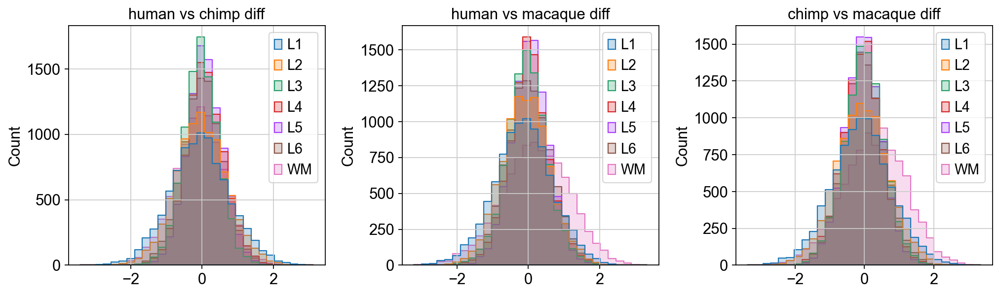

In [14]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={'wspace': 0.3})

sns.histplot(human_chimp_diff, bins=30, element="step", ax=ax[0])
ax[0].set_title('human vs chimp diff')

sns.histplot(human_macaque_diff, bins=30, element="step", ax=ax[1])
ax[1].set_title('human vs macaque diff')

sns.histplot(chimp_macaque_diff, bins=30, element="step", ax=ax[2])
ax[2].set_title('chimp vs macaque diff')

# Human-specific genes for each layer

## Calculate the ratio

Load human vs chimp and human vs macaque differecies to one dataframe

In [15]:
hum_stack = human_chimp_diff.stack().to_frame().swaplevel(1, 0)
hum_stack.columns = ['human_chimp_diff']
hum_stack['human_macaque_diff'] = human_macaque_diff.stack().swaplevel(1, 0)
hum_stack['ΔHC/ΔHM'] = hum_stack['human_chimp_diff'] / hum_stack['human_macaque_diff']
hum_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC/ΔHM
L1,A1BG,-0.905086,-1.018086,0.889007
L2,A1BG,1.081197,-0.573703,-1.884593
L3,A1BG,-0.537651,0.948931,-0.566587
L4,A1BG,-0.221108,0.826215,-0.267615
L5,A1BG,0.084847,0.226093,0.375275


Add t-test results for ANOVA significant genes

In [16]:
hum_stack['hc_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp')].set_index(['layer', 'gene']).p_val_adj
hum_stack['hm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack['cm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'chimp') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack.head()

#hum_stack['mult_diff'] = hum_stack['human_chimp_diff'] * hum_stack['human_macaque_diff']
#hum_spec_stack = hum_stack[hum_stack.mult_diff > 0].sort_index()
#hum_spec_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC/ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L1,A1BG,-0.905086,-1.018086,0.889007,0.280856,0.339575,0.940987
L2,A1BG,1.081197,-0.573703,-1.884593,0.335712,0.555180,0.052087
L3,A1BG,-0.537651,0.948931,-0.566587,0.378553,0.184102,0.040639
L4,A1BG,-0.221108,0.826215,-0.267615,0.709464,0.334743,0.266840
L5,A1BG,0.084847,0.226093,0.375275,0.945910,0.837651,0.786265


Text(0, 0.5, 'Number of genes')

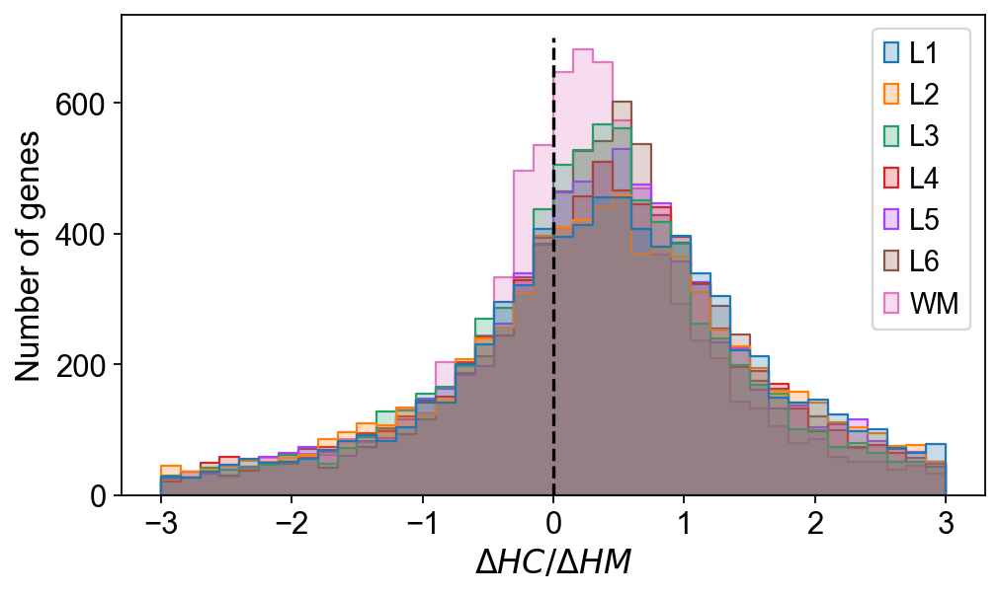

In [17]:
fig, ax = plt.subplots(figsize=(7, 4))
sns.histplot(hum_stack['ΔHC/ΔHM'].unstack().T, element="step", binrange=[-3, 3], bins=40)
plt.vlines(0, ymin=0, ymax=700, colors='black', linestyles='dashed')
ax.grid(False)
ax.set_xlabel('$\Delta HC / \Delta HM$', fontsize=15)
ax.set_ylabel('Number of genes', fontsize=15)

In [18]:
(hum_stack['ΔHC/ΔHM'] > 0).value_counts()

ΔHC/ΔHM
True     41469
False    22987
Name: count, dtype: int64

## Filter human-specific genes

 $$0.5 \le \frac{\Delta HC}{\Delta HM} \le 1 $$

In [19]:
hum_stack[hum_stack.hc_p_val_adj < 0.05]

,,human_chimp_diff,human_macaque_diff,ΔHC/ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L2,AATK,1.390281,0.993122,1.399909,0.042266,0.050167,0.292342
L6,ABI3BP,-1.433956,-0.188006,7.627177,0.039258,0.875569,0.299315
WM,ACAP1,2.386411,2.277839,1.047665,0.028640,0.002433,0.911604
L1,ACBD6,1.654986,1.381195,1.198227,0.031980,0.189240,0.845061
L4,ACTL6B,1.073876,-0.316040,-3.397917,0.040562,0.395443,0.040384
...,...,...,...,...,...,...,...
L1,ZNF579,1.911906,2.268611,0.842765,0.010026,0.003352,0.281370
L4,ZNF672,0.544886,1.772851,0.307350,0.040562,0.018278,0.053129
L1,ZNF706,-1.210448,-1.158202,1.045110,0.029376,0.117182,0.963909
WM,ZSCAN26,-2.074278,0.535813,-3.871270,0.031919,0.745900,0.160143


In [20]:
hs_samples_diff = ((hum_stack['ΔHC/ΔHM'] >= 0.5) & (hum_stack['ΔHC/ΔHM'] <= 1))
hs_samples_pval = ((hum_stack['ΔHC/ΔHM'] >= 0) & (hum_stack['ΔHC/ΔHM'] <= 1) & (hum_stack.hc_p_val_adj < 0.05))
hum_spec = hum_stack[hs_samples_diff | hs_samples_pval].copy()
hum_spec

human_chimp_diff  human_macaque_diff   ΔHC/ΔHM  hc_p_val_adj  \
L1 A1BG           -0.905086           -1.018086  0.889007      0.280856   
L2 AAAS            0.749777            1.401189  0.535101           NaN   
L3 AAAS           -0.053661           -0.095973  0.559126           NaN   
L4 AAAS           -0.864171           -0.901881  0.958187           NaN   
   AACS           -0.398020           -0.693795  0.573686           NaN   
...                     ...                 ...       ...           ...   
L5 ZUP1           -0.134446           -0.239539  0.561268           NaN   
L3 ZYG11B          0.492918            0.750964  0.656380           NaN   
WM ZYX            -0.978935           -1.162622  0.842007      0.254108   
L4 ZZEF1           0.614646            0.734467  0.836859           NaN   
L1 ZZZ3           -0.427094           -0.596727  0.715726           NaN   

           hm_p_val_adj  cm_p_val_adj  
L1 A1BG        0.339575      0.940987  
L2 AAAS             NaN           NaN  
L3 AAAS             NaN           NaN  
L4 AAAS             NaN           NaN  
   AACS             NaN           NaN  
...                 ...           ...  
L5 ZUP1             NaN           NaN  
L3 ZYG11B           NaN           NaN  
WM ZYX         0.240927      0.911374  
L4 ZZEF1            NaN           NaN  
L1 ZZZ3             NaN           NaN  

[10196 rows x 6 columns]

In [21]:
hs_tr = [0.5, 0.6, 0.7, 0.8]
hs_genes_tr = []

for tr in hs_tr:
    hs_samples_diff = ((hum_stack['ΔHC/ΔHM'] >= tr) & (hum_stack['ΔHC/ΔHM'] <= 1))
    hs_samples_pval = ((hum_stack['ΔHC/ΔHM'] >= 0) & (hum_stack['ΔHC/ΔHM'] <= 1) & (hum_stack.hc_p_val_adj < 0.05))
    hs = hum_stack[hs_samples_diff | hs_samples_pval].copy()
    hs_genes_tr.append(hs['ΔHC/ΔHM'].unstack().notna().astype(int))

## Layer statistics

Count number of human-specific genes for each layer

In [22]:
hum_spec_onehot = hum_spec['ΔHC/ΔHM'].unstack().notna().astype(int)
hum_spec_onehot.sum().value_counts()

1    3509
2    2018
3     658
4     138
5      16
6       4
7       3
Name: count, dtype: int64

In [23]:
hum_spec_onehot.to_csv('results/hum_spec_onehot.csv')

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

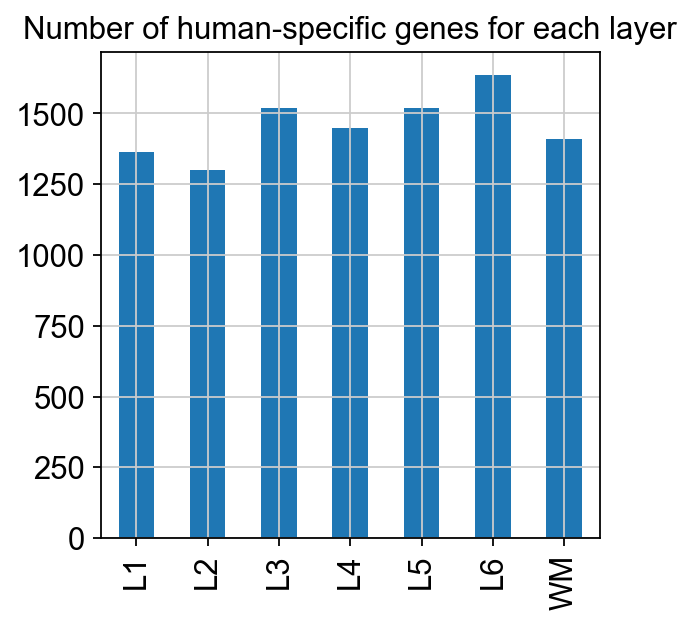

In [24]:
hum_spec_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

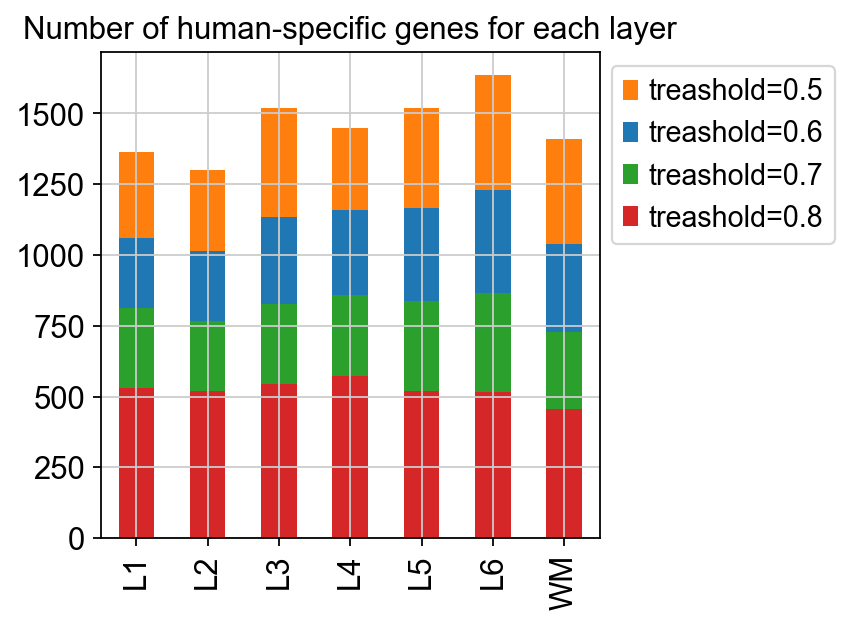

In [25]:
fig, ax = plt.subplots(figsize=(4, 4))

hs_genes_tr[0].sum(axis=1).plot.bar(ax=ax, color='tab:orange')
hs_genes_tr[1].sum(axis=1).plot.bar(ax=ax, color='tab:blue')
hs_genes_tr[2].sum(axis=1).plot.bar(ax=ax, color='tab:green')
hs_genes_tr[3].sum(axis=1).plot.bar(ax=ax, color='tab:red')
#ax.legend(ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
plt.title('Number of human-specific genes for each layer')
plt.legend([f'treashold={tr}' for tr in hs_tr], loc='upper right', bbox_to_anchor=(1.5, 1))

In [26]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_onehot), columns=hum_spec_onehot.index, index=hum_spec_onehot.index)
pairwise_jaccard

,L1,L2,L3,L4,L5,L6,WM
L1,1.000000,0.075929,0.081334,0.078221,0.094569,0.094891,0.080249
L2,0.075929,1.000000,0.086672,0.084024,0.094369,0.100450,0.084902
L3,0.081334,0.086672,1.000000,0.089541,0.097905,0.104619,0.101504
L4,0.078221,0.084024,0.089541,1.000000,0.087243,0.086681,0.094636
L5,0.094569,0.094369,0.097905,0.087243,1.000000,0.101257,0.102033
L6,0.094891,0.100450,0.104619,0.086681,0.101257,1.000000,0.086336
WM,0.080249,0.084902,0.101504,0.094636,0.102033,0.086336,1.000000


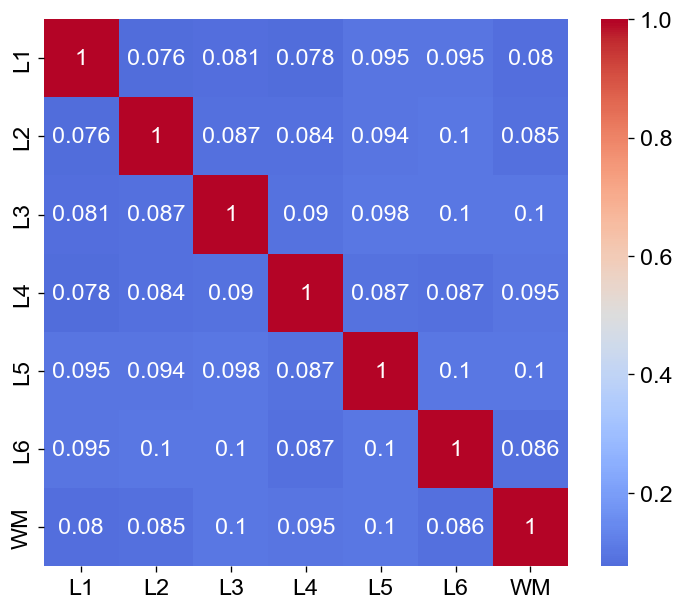

In [27]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

In [28]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_onehot.index, index=hum_spec_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_onehot.loc[lay1] * hum_spec_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,1364,188,217,204,249,260,206
L2,188,1300,225,213,243,268,212
L3,217,225,1521,244,271,299,270
L4,204,213,244,1448,238,246,247
L5,249,243,271,238,1518,290,271
L6,260,268,299,246,290,1636,242
WM,206,212,270,247,271,242,1409


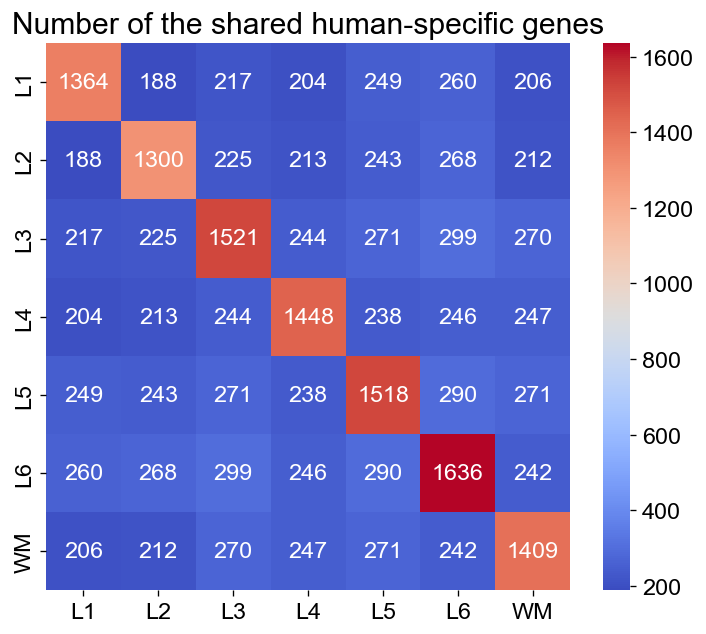

In [29]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

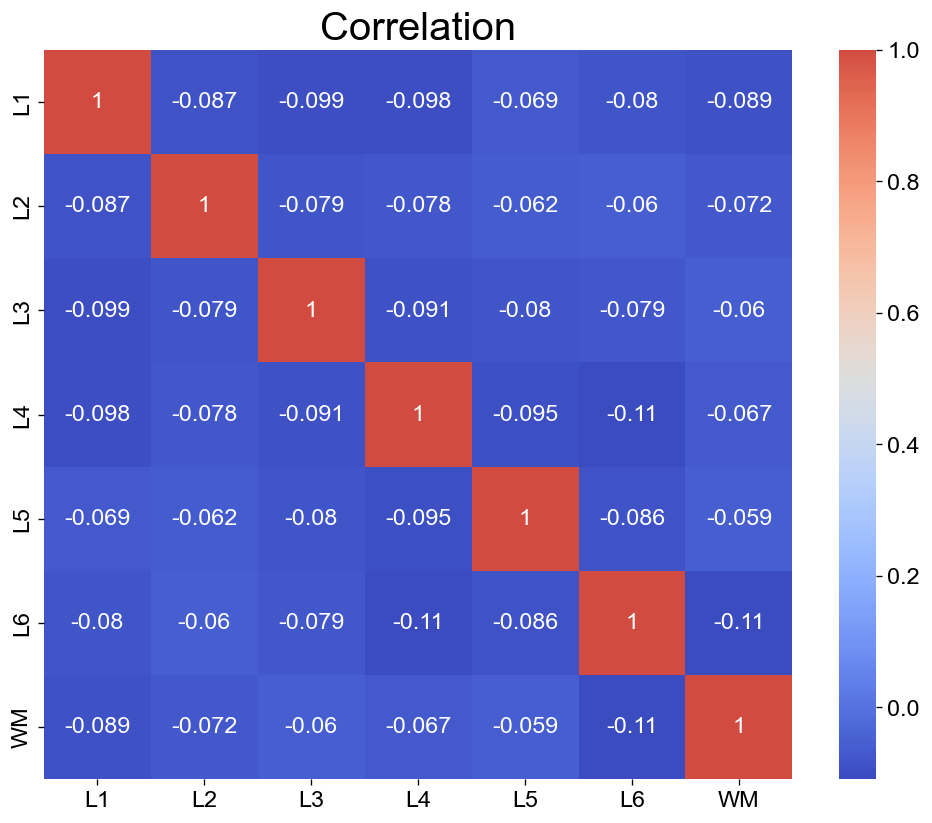

In [30]:
plt.figure(figsize=(10, 8), dpi=60)
sns.heatmap(hum_spec_onehot.T.corr(), annot=True, cmap = 'coolwarm', center=0.5, fmt='.2g')
plt.title('Correlation', fontsize=24)
plt.grid(False)

## Cluster human-specific genes

In [31]:
df = pd.DataFrame(adata_pb_norm.X, index=adata_pb_norm.obs_names, columns=adata_pb_norm.var_names)
df.head()

,A1BG,AAAS,AACS,AADAT,AAGAB,AAK1,AAMDC,AAMP,AAR2,AARS1,...,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZWILCH,ZYG11B,ZYX,ZZEF1,ZZZ3
chimp_11454_L1,0.067607,1.677290,-1.534315,0.929936,-1.891263,-1.121907,2.229827,0.418000,-0.182887,0.048899,...,2.267787,-0.605884,-1.395130,-1.446029,-2.058029,0.766767,-0.871571,2.119675,-1.825826,0.044699
chimp_13309_L1,-0.620890,-0.837512,-0.035323,-0.156411,1.389692,0.899977,-1.379352,0.203313,1.537268,0.551155,...,0.000000,2.147622,-0.679872,0.606861,-2.148551,-0.496705,-0.991205,-0.377964,-1.916228,0.735414
chimp_j8_L1,0.180522,1.164353,-0.967539,0.124353,1.043396,-0.044744,0.921149,-0.260578,0.199490,0.714291,...,0.000000,-0.542437,0.406670,1.972330,1.190047,-0.278057,-0.758739,-0.983870,1.912076,0.256580
human_759_L1,-1.331822,2.137584,-1.205822,0.901628,-1.817619,-1.699446,1.991166,-0.914848,-0.788294,-0.647242,...,0.415925,0.461636,-0.452875,-0.346116,-0.100112,-1.887467,-1.363774,1.315433,0.350686,0.344768
human_j12_L1,-0.233744,0.324173,-2.036622,-0.808470,-0.009232,-1.925505,1.342983,-1.619777,-1.418294,-1.010445,...,-1.644043,-0.352265,1.806208,0.183947,-1.941861,-1.789864,-1.398794,0.664080,-1.271133,1.354874


In [32]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

### Hierarch clasterisation

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


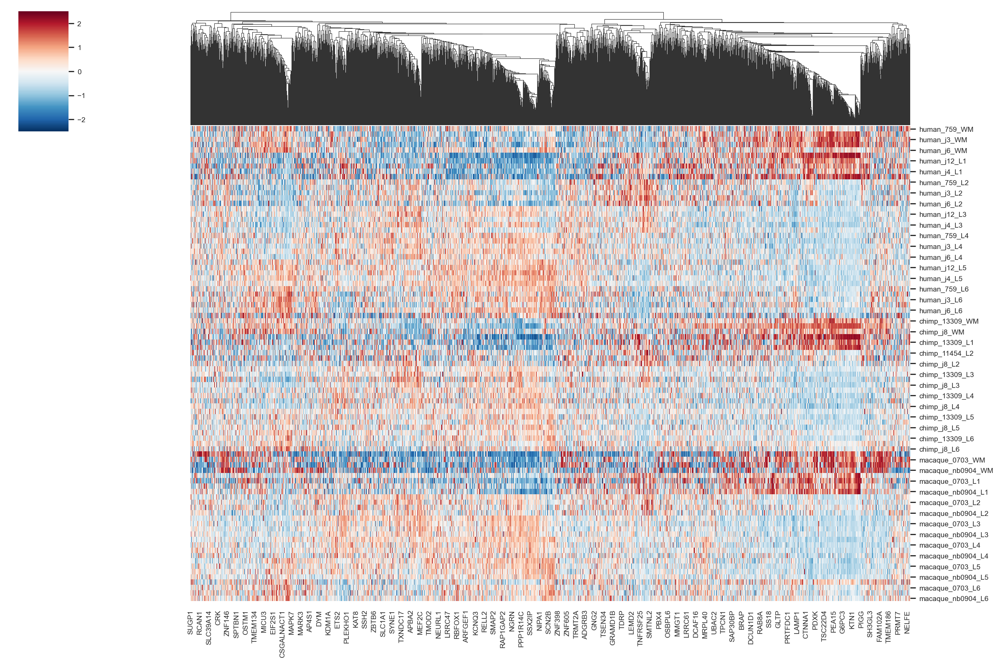

In [33]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_onehot.columns], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral clusterisation

In [34]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_onehot.columns].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [35]:
hs_labels = pd.Series(clustering.labels_, index=hum_spec_onehot.columns).sort_values()
order = hs_labels.sort_values().index

In [36]:
hs_labels.to_csv('results/hs_layers.csv')

<Axes: >

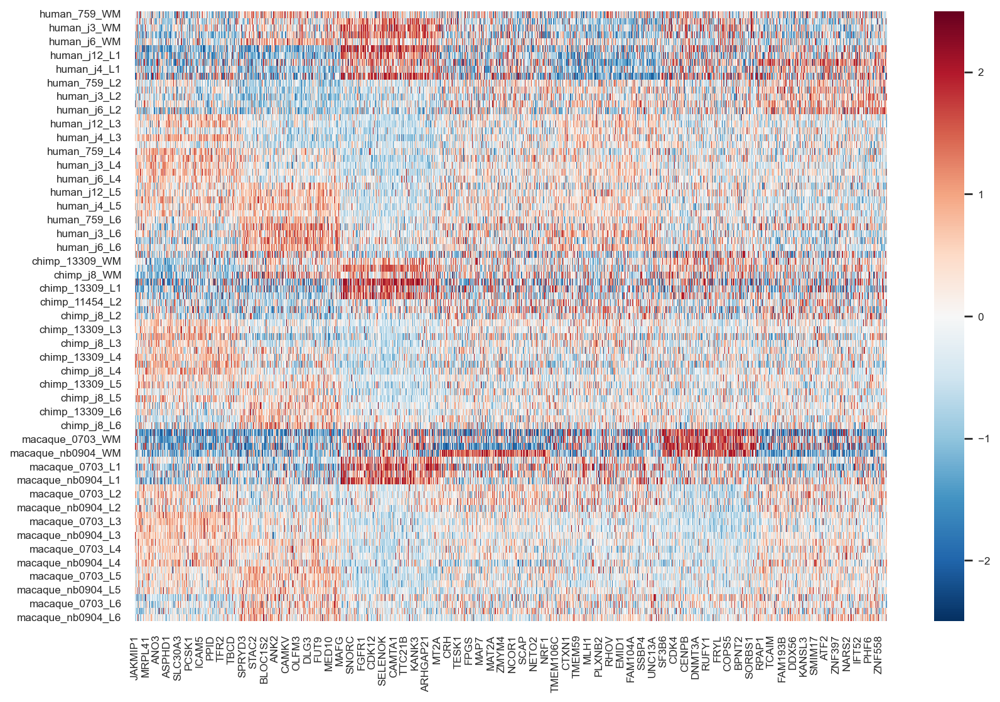

In [37]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

### Profile visualisation

In [38]:
df_annotation = df[hum_spec_onehot.columns].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [39]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AAAS      AACS     AADAT     AAGAB      AAK1  \
condition layer                                                               
chimp     L1    -0.124254  0.668044 -0.845726  0.299293  0.180608 -0.088891   
          L2    -0.601969 -0.238239 -1.246811 -0.005332  0.095587 -0.225721   
          L3     1.322821 -0.301482 -0.212525  0.897277  0.138341 -0.089796   
          L4     1.045246  0.393339  0.458715  0.415090  0.313722 -0.259123   
          L5    -0.120974 -0.548878  0.841061 -0.265830 -0.175241 -0.161909   

                    AAMDC      AAR2     AARS1  AASDHPPT  ...   ZSCAN30  \
condition layer                                          ...             
chimp     L1     0.590541  0.517957  0.438115 -1.546592  ... -1.372898   
          L2    -0.790027 -0.005194 -0.610583 -0.085128  ...  0.688032   
          L3    -0.390847  0.037472 -0.184341  0.382427  ... -0.046050   
          L4     0.073225  0.365190 -0.346950  0.826681  ...  0.198244   
          L5     0.013781 -0.308601 -0.162974  0.274136  ...  0.248565   

                   ZSCAN9    ZSWIM5    ZSWIM6    ZSWIM7      ZUP1    ZYG11B  \
condition layer                                                               
chimp     L1     0.156321  0.755929  0.333100 -0.556111 -1.005511 -0.873839   
          L2    -0.287853 -0.125988 -0.605761  1.347295  0.381757  0.000382   
          L3     0.039725 -0.263664 -0.400222 -0.042495  0.056983 -0.183451   
          L4     0.151193 -0.263664 -0.398616 -0.126006 -0.117936  0.200496   
          L5    -0.178360  0.292223 -0.098673 -0.732700  0.093389  0.051731   

                      ZYX     ZZEF1      ZZZ3  
condition layer                                
chimp     L1     0.252614 -0.609993  0.345564  
          L2    -0.645583  0.224229  0.615859  
          L3     0.367243 -0.356349 -0.277304  
          L4     0.850038 -0.159547 -0.946701  
          L5    -0.293464 -0.084772 -0.422981  

[5 rows x 6346 columns]

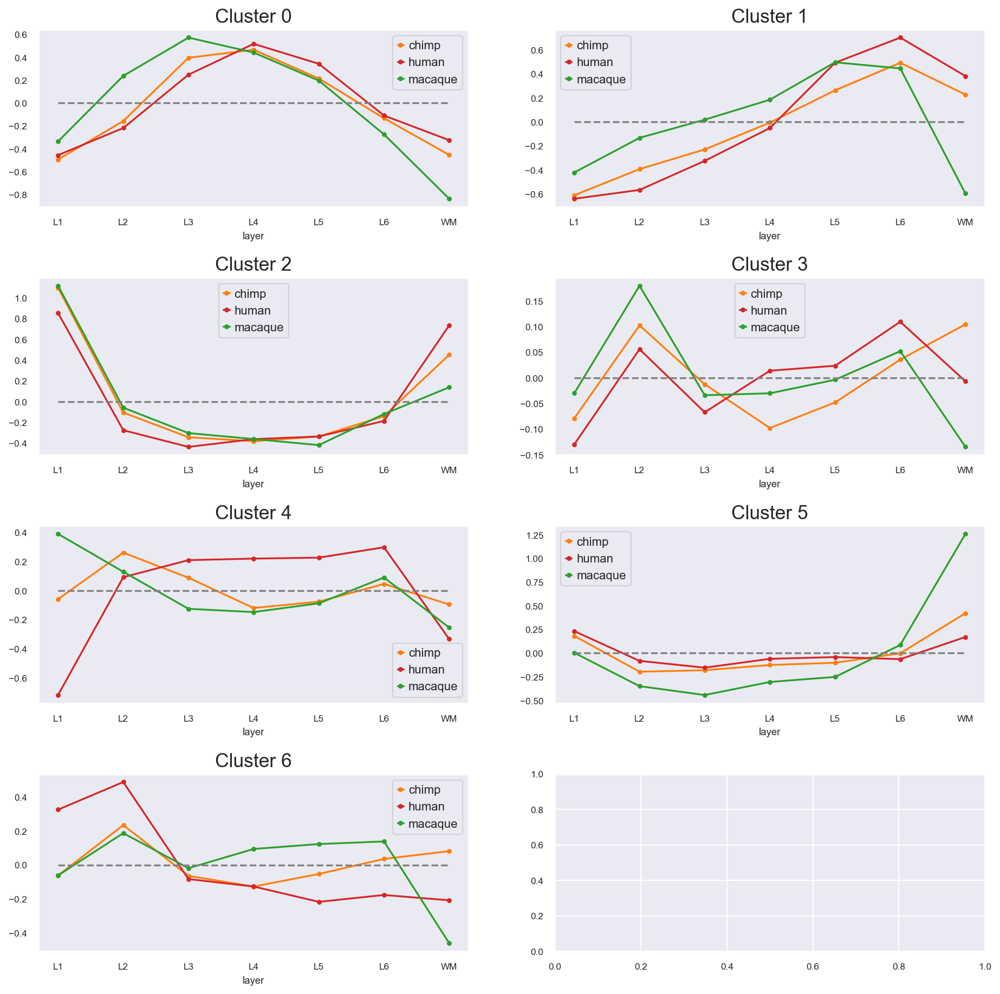

In [40]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 4 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Intersection with ANOVA clusters

In [41]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_zscore_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels + 1
anova_labels.name = 'ANOVA_labels'

In [42]:
anova_labels.value_counts().sort_index()

ANOVA_labels
1    395
2    405
3    352
4    420
5    448
6    373
7    443
Name: count, dtype: int64

In [43]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
ZYX,1,0,0,0,0,0,0
TOP2B,1,0,0,0,0,0,0
TOPORS,1,0,0,0,0,0,0
TOR2A,1,0,0,0,0,0,0
ARL15,1,0,0,0,0,0,0


In [44]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
JAKMIP1,1,0,0,0,0,0,0
HMGCL,1,0,0,0,0,0,0
CACNG3,1,0,0,0,0,0,0
RTN4RL2,1,0,0,0,0,0,0
TOX2,1,0,0,0,0,0,0


In [45]:
dummie_concat = pd.concat([anova_dummies, hs_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS0,HS1,HS2,HS3,HS4,HS5,HS6
ZYX,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
TOP2B,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOPORS,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOR2A,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
ARL15,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


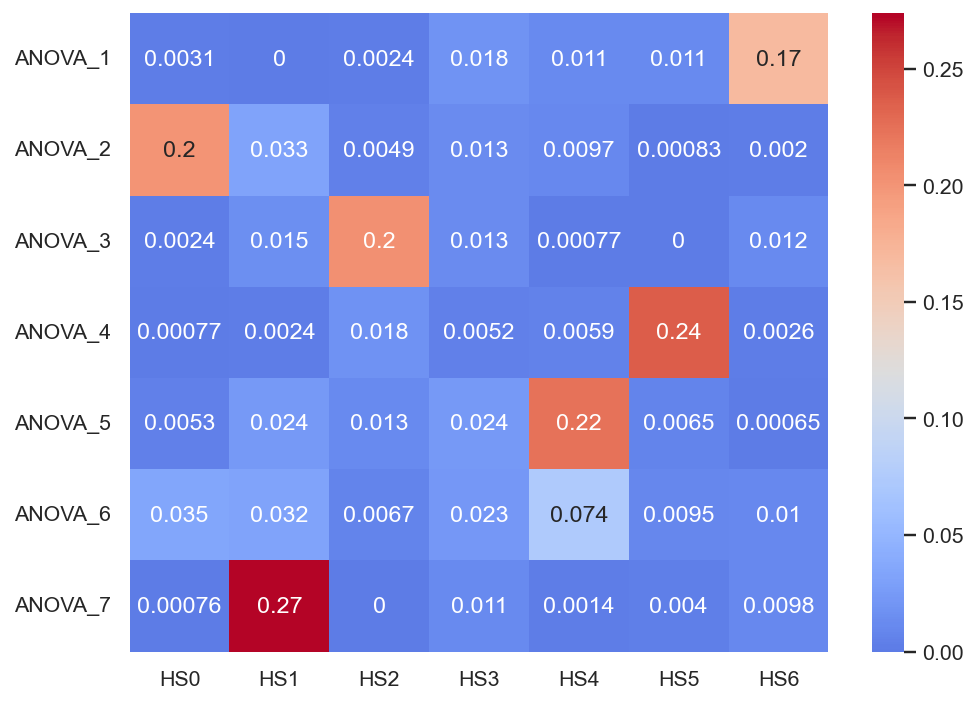

In [46]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(8, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[anova_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.12)
plt.grid(False)

In [47]:
gene_inter = hs_labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], hs_labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,4.0,0.0,3.0,24.0,15.0,13.0,216.0
2,215.0,40.0,6.0,17.0,13.0,1.0,3.0
3,3.0,18.0,200.0,17.0,1.0,0.0,17.0
4,1.0,3.0,22.0,7.0,8.0,233.0,4.0
5,7.0,31.0,16.0,32.0,253.0,8.0,1.0
6,42.0,38.0,8.0,30.0,91.0,11.0,15.0
7,1.0,279.0,0.0,15.0,2.0,5.0,15.0


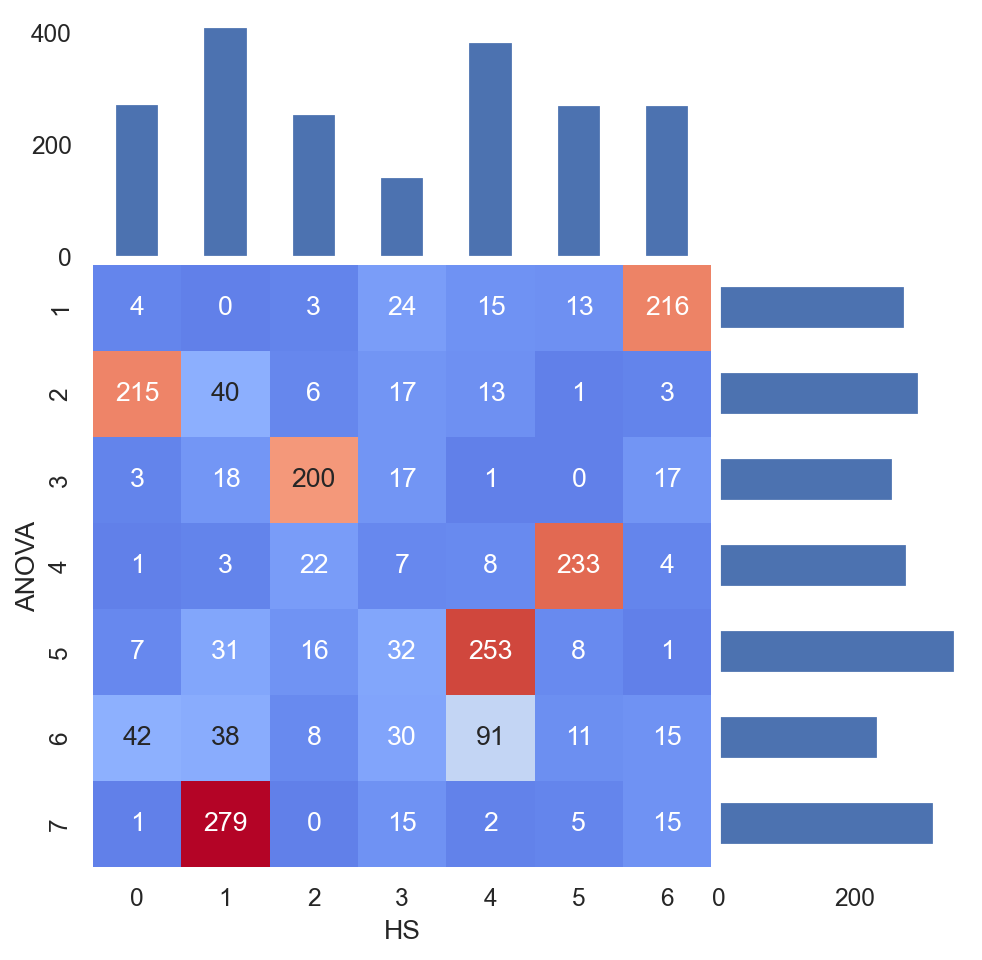

In [48]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter, annot=True, cmap = 'coolwarm', center=120, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum().plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.index[::-1]
pivot_labels_inter.T.sum().loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

## Intersection of ANOVA significant genes and genes with human-specific layer

In [49]:
hum_spec_anova_inter = hum_spec_onehot.columns.intersection(anova_genes)
hum_spec_anova_inter

Index(['A1BG', 'AARS1', 'AATK', 'ABAT', 'ABCA2', 'ABCA3', 'ABCB1', 'ABCC8',
       'ABCD2', 'ABCD4',
       ...
       'ZNF706', 'ZNF708', 'ZNF768', 'ZNF770', 'ZNF791', 'ZNFX1', 'ZNHIT3',
       'ZSWIM6', 'ZSWIM7', 'ZYX'],
      dtype='object', length=2004)

### Visualization for layer freq

In [50]:
hum_spec_anova_onehot = hum_spec_onehot[hum_spec_anova_inter]

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

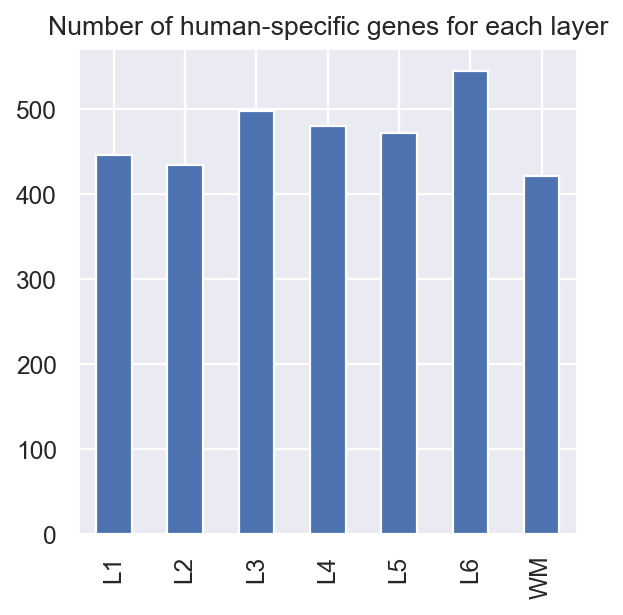

In [51]:
hum_spec_anova_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

In [52]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_anova_onehot.index, index=hum_spec_anova_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_anova_onehot.loc[lay1] * hum_spec_anova_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_anova_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_anova_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,446,66,68,72,92,92,68
L2,66,435,76,80,86,96,72
L3,68,76,498,91,86,113,98
L4,72,80,91,480,85,88,84
L5,92,86,86,85,472,114,76
L6,92,96,113,88,114,545,82
WM,68,72,98,84,76,82,421


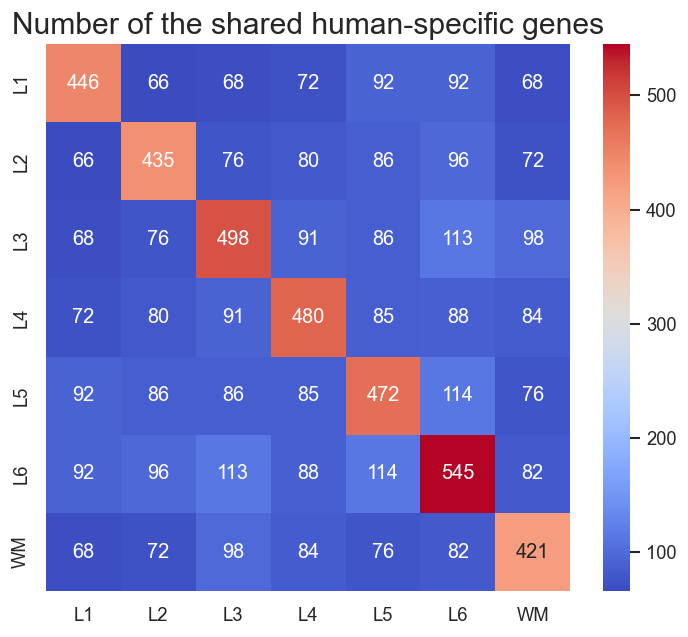

In [53]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

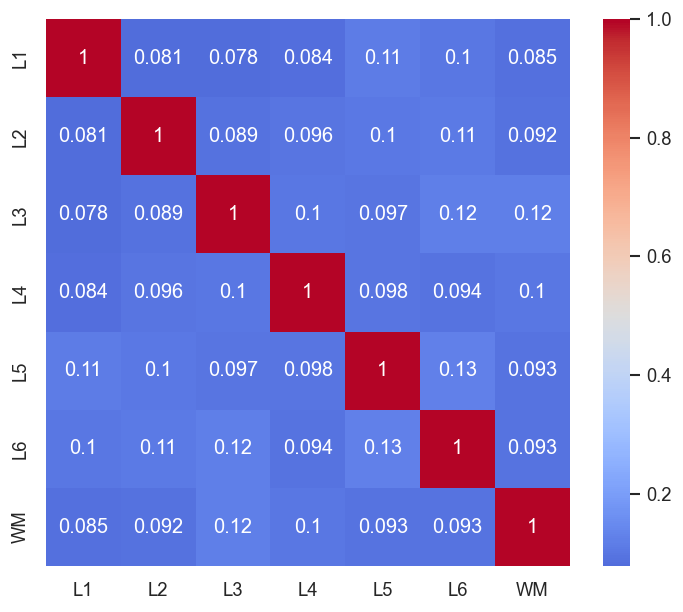

In [54]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_anova_onehot), columns=hum_spec_anova_onehot.index, index=hum_spec_anova_onehot.index)
pairwise_jaccard

plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

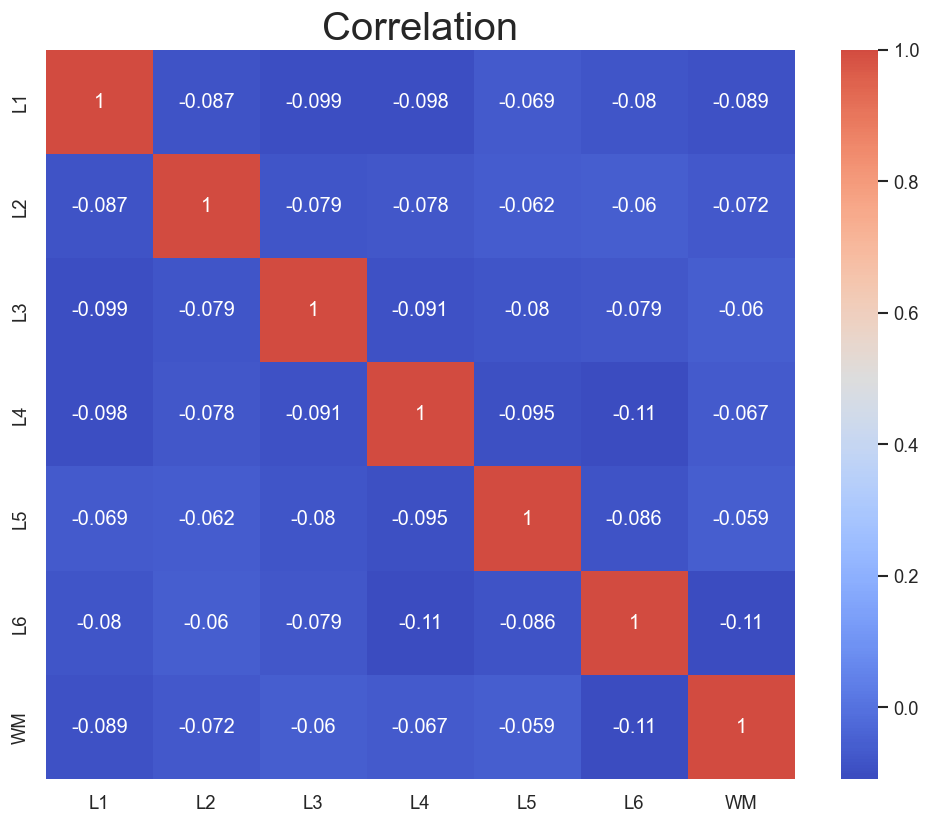

In [55]:
plt.figure(figsize=(10, 8), dpi=60)
sns.heatmap(hum_spec_onehot.T.corr(), annot=True, cmap = 'coolwarm', center=0.5, fmt='.2g')
plt.title('Correlation', fontsize=24)
plt.grid(False)

### ANOVA clusters visualization

In [56]:
pivot_labels = anova_labels.loc[hum_spec_anova_inter].to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='ANOVA_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
ANOVA_labels,,,,,,,
1,143,96,31,4,0,0,1
2,139,98,39,14,4,1,0
3,122,97,33,4,0,0,0
4,163,72,32,9,1,1,0
5,181,110,37,17,2,0,1
6,136,75,19,5,0,0,0
7,201,84,29,2,0,0,1


In [57]:
pivot_labels_fraction = pivot_labels / anova_labels.value_counts().sort_index().values.reshape(7, 1)

(0.0, 1.0)

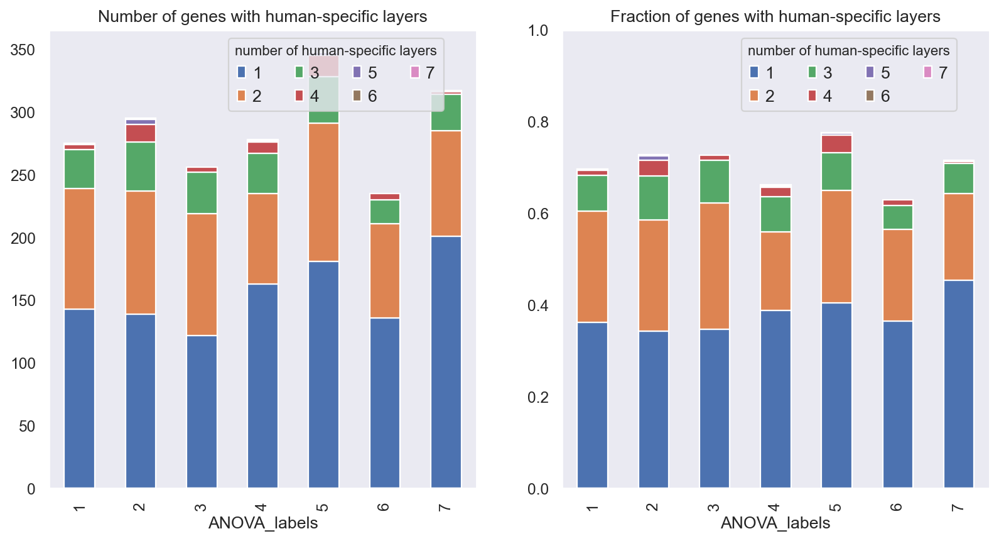

In [58]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[0], stacked=True)
ax[0].set_title('Number of genes with human-specific layers')
ax[0].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[0].grid(False)

pivot_labels_fraction.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Fraction of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)
ax[1].set_ylim(0, 1)

In [59]:
onehot_unstack = hum_spec_anova_onehot.unstack()
onehot_unstack.name = 'hum-spec & ANOVA'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['ANOVA cluster'] = anova_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ANOVA'] == 1].groupby(['ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ANOVA']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
ANOVA cluster,,,,,,,
1,64,67,61,68,63,74,54
2,54,62,99,58,87,85,89
3,53,61,69,50,56,63,79
4,41,67,65,78,72,71,56
5,126,60,69,89,95,104,54
6,45,45,58,56,42,74,43
7,63,73,77,81,57,74,46


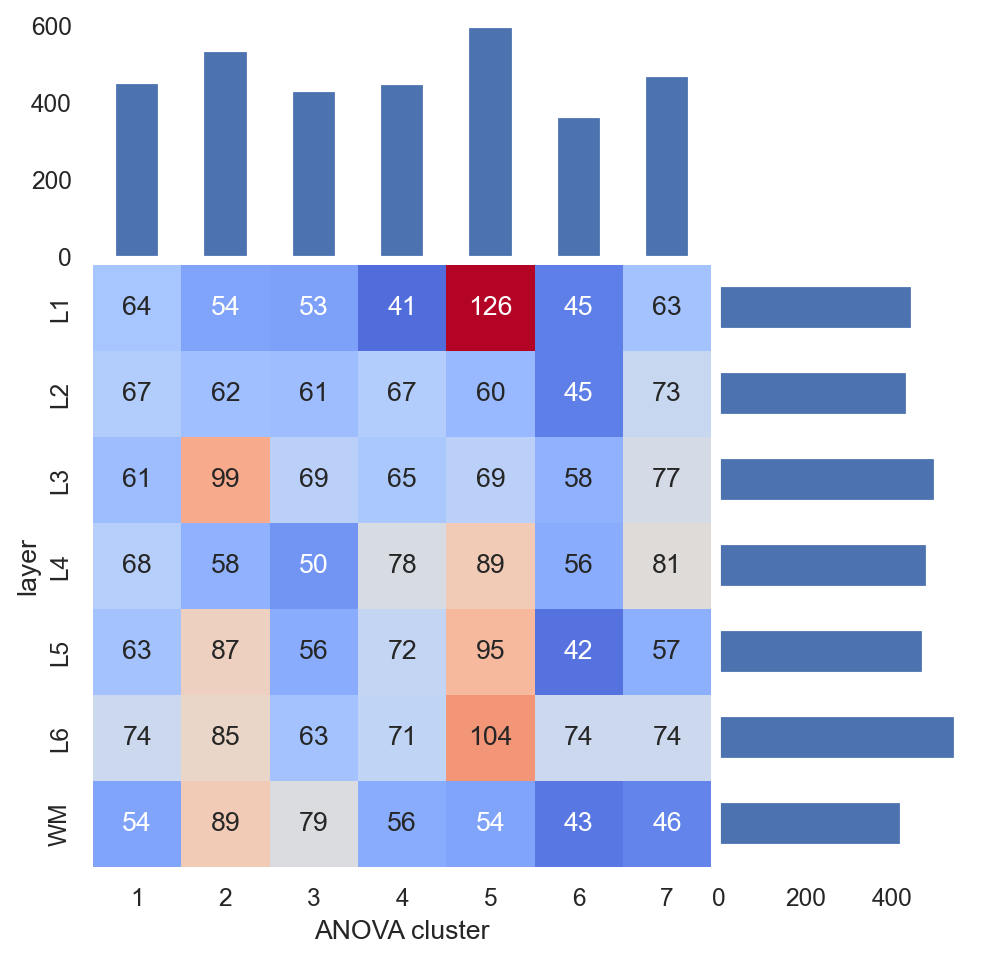

In [60]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [61]:
hum_spec_anova_onehot.sum(axis=1)

L1    446
L2    435
L3    498
L4    480
L5    472
L6    545
WM    421
dtype: int64

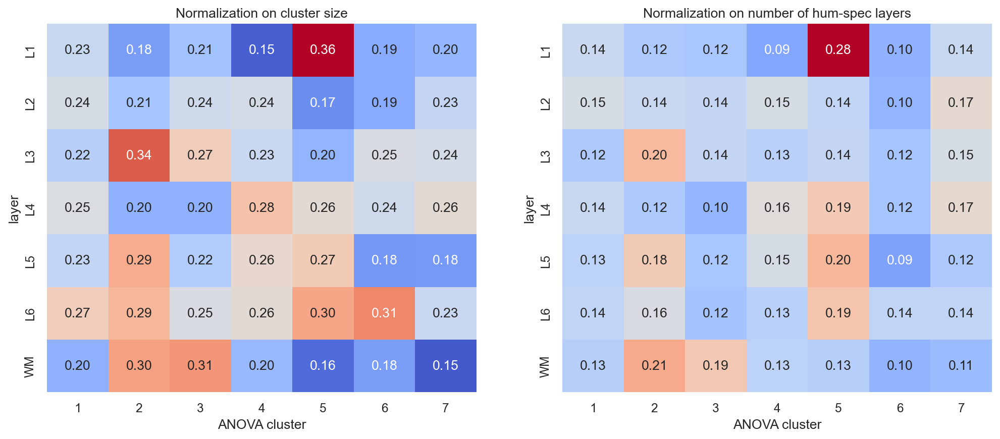

In [62]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_anova_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

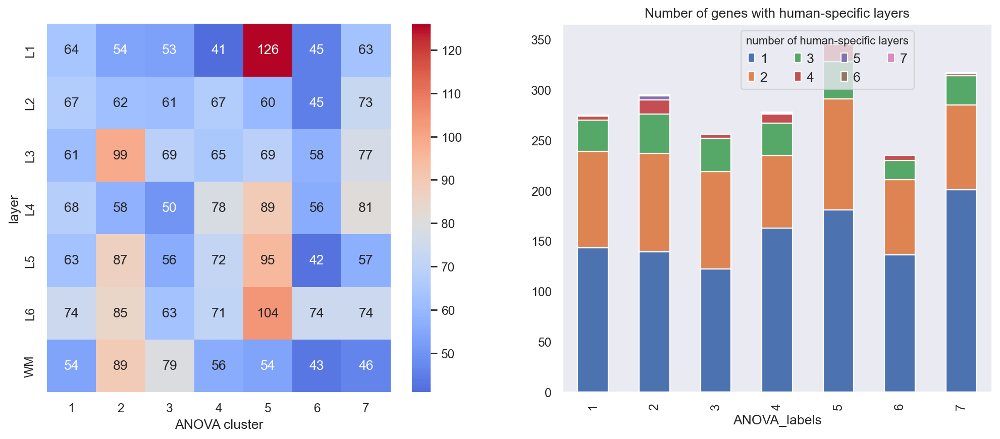

In [63]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [64]:
df_annotation = df[hum_spec_anova_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [65]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG     AARS1      AATK      ABAT     ABCA2     ABCA3  \
condition layer                                                               
chimp     L1    -0.124254  0.438115 -0.539509 -0.048830 -0.446716  0.004408   
          L2    -0.601969 -0.610583 -1.150563 -0.865423 -0.446716 -1.078788   
          L3     1.322821 -0.184341  0.164686 -0.757013  0.023459 -0.281512   
          L4     1.045246 -0.346950  0.145362  0.606082  0.117506 -0.005355   
          L5    -0.120974 -0.162974  0.883652  1.146056 -0.061804 -0.141554   

                    ABCB1     ABCC8     ABCD2     ABCD4  ...    ZNF706  \
condition layer                                          ...             
chimp     L1     1.925533 -1.597717  0.341589  0.435920  ...  0.254733   
          L2    -0.617952  1.198276  0.032164  1.432714  ...  1.471642   
          L3    -0.302529  0.397876  0.860705 -0.573886  ...  0.806847   
          L4    -0.411912  0.219108  0.378155 -0.410210  ...  0.056175   
          L5    -0.508543  0.189006 -0.572668  0.002664  ... -0.455261   

                   ZNF708    ZNF768    ZNF770    ZNF791     ZNFX1    ZNHIT3  \
condition layer                                                               
chimp     L1     0.571811 -0.552008  0.218645  1.243329  0.335096  0.299887   
          L2    -1.018149  1.178501 -0.350721 -0.087413  0.343525  0.643968   
          L3     0.230917 -0.698060 -0.317873  0.091345 -0.352491  0.080413   
          L4     0.598299 -0.022310 -0.986731 -0.709821 -0.297188 -0.253781   
          L5     0.017168 -0.404709 -0.419019 -0.296824 -0.641171  0.220328   

                   ZSWIM6    ZSWIM7       ZYX  
condition layer                                
chimp     L1     0.333100 -0.556111  0.252614  
          L2    -0.605761  1.347295 -0.645583  
          L3    -0.400222 -0.042495  0.367243  
          L4    -0.398616 -0.126006  0.850038  
          L5    -0.098673 -0.732700 -0.293464  

[5 rows x 2004 columns]

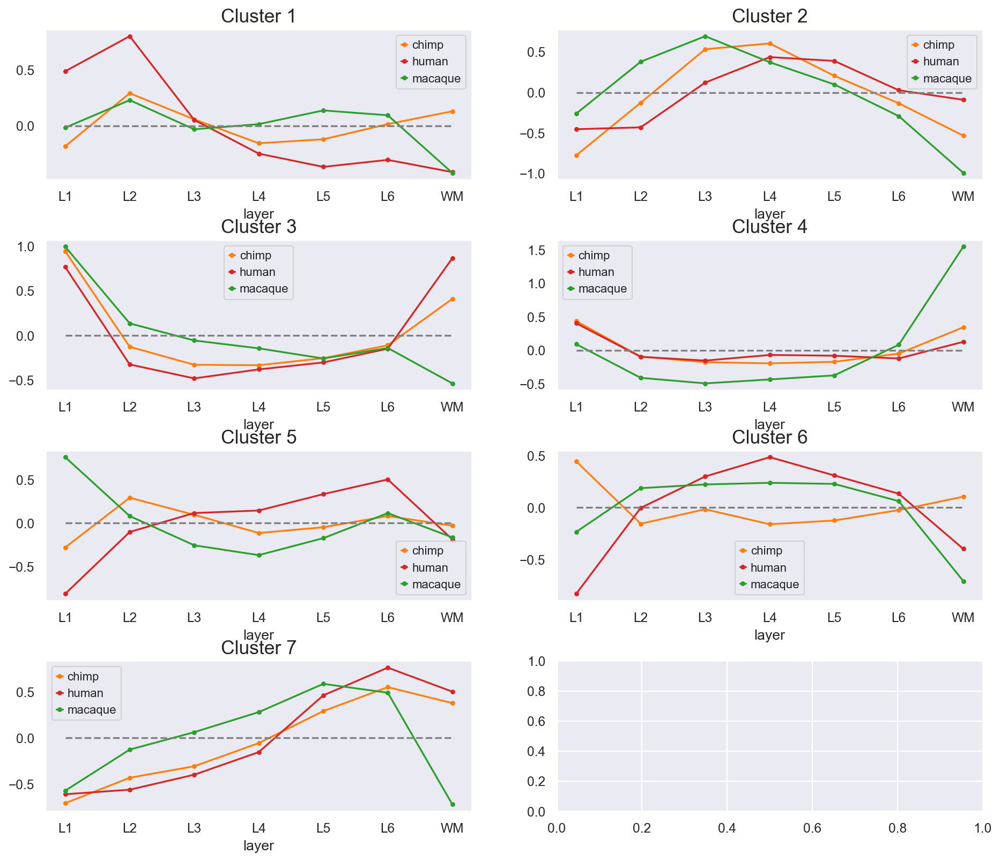

In [66]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(anova_labels.unique(), axes.flatten()):
    genes = anova_labels.loc[hum_spec_anova_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Human-specific clusters visualization

In [67]:
hs_labels.name = 'HS_labels'
pivot_labels = hs_labels.loc[hum_spec_anova_inter].to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS_labels,,,,,,,
0,131,96,32,11,2,1,0
1,255,111,38,4,0,0,1
2,129,90,32,4,0,0,0
3,82,41,15,2,2,0,0
4,188,127,45,20,2,0,1
5,159,72,29,9,1,1,0
6,141,95,29,5,0,0,1


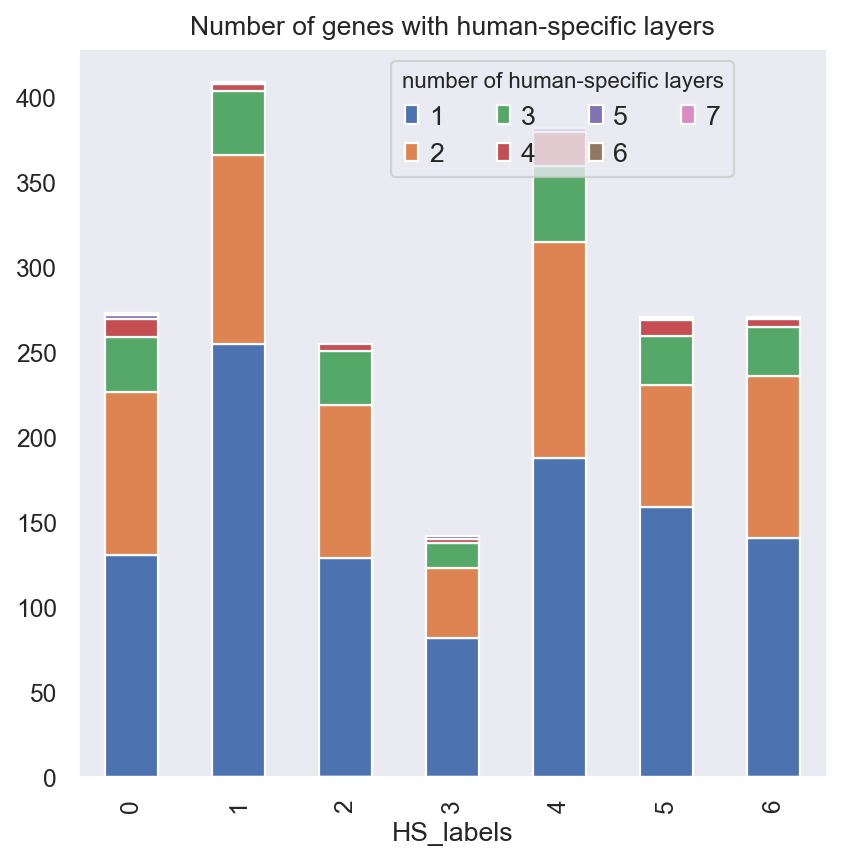

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [69]:
onehot_unstack = hum_spec_anova_onehot.unstack()
onehot_unstack.name = 'hum-spec & ANOVA'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS cluster'] = hs_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ANOVA'] == 1].groupby(['HS cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ANOVA']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS cluster,,,,,,,
0,52,61,78,59,82,77,70
1,70,95,109,100,71,106,63
2,48,56,61,54,55,73,74
3,27,31,25,33,29,48,34
4,144,62,96,104,105,100,63
5,37,70,67,64,64,68,67
6,68,60,62,66,66,73,50


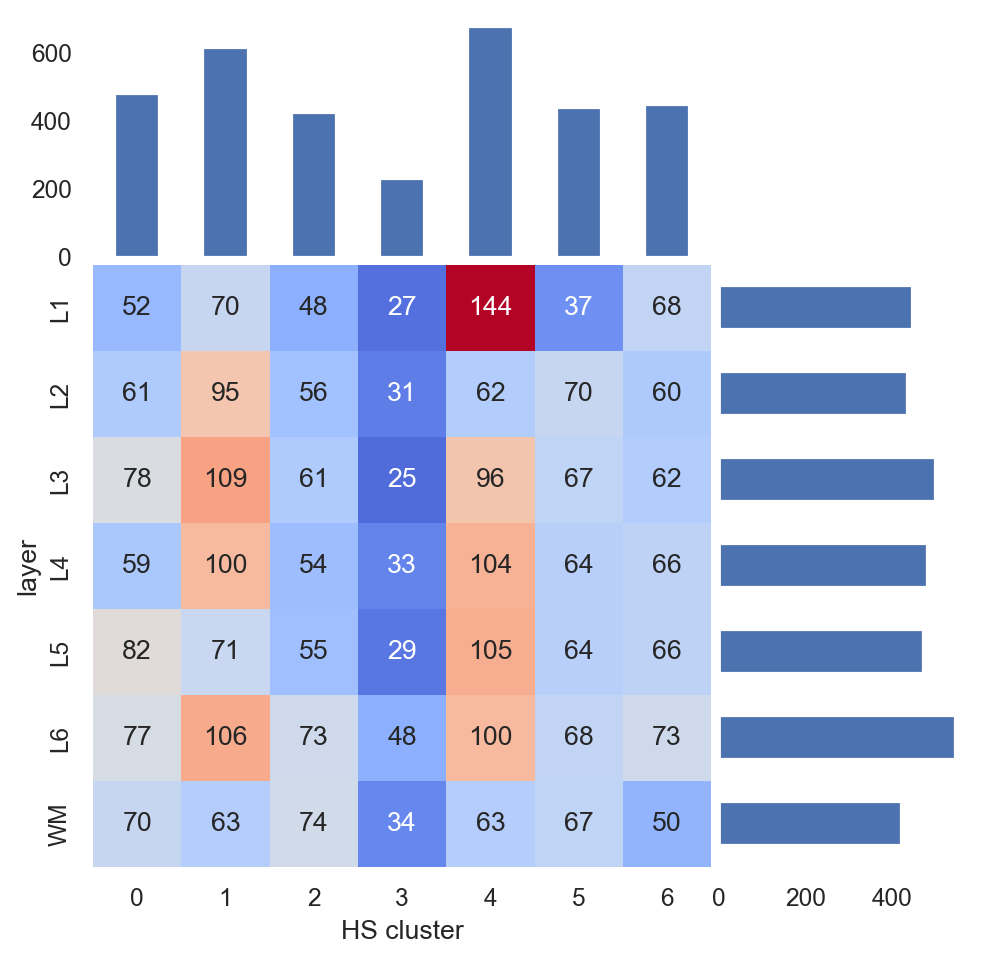

In [70]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

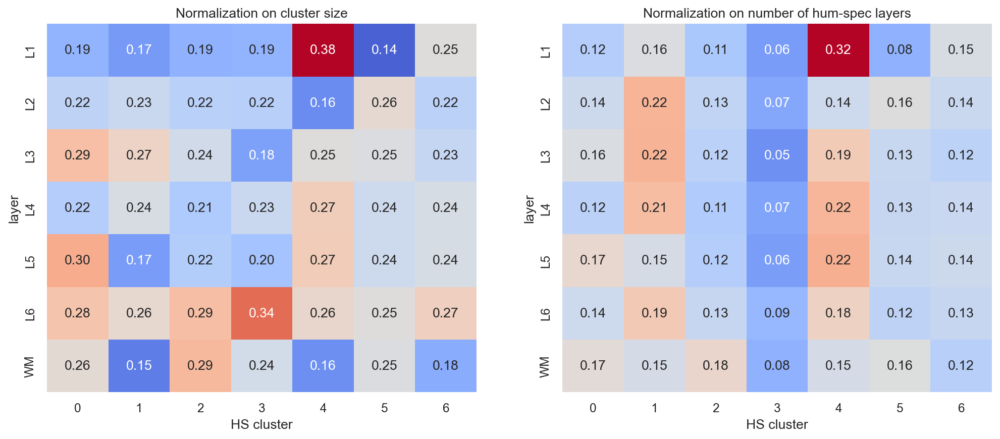

In [71]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_anova_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

<Axes: xlabel='HS_labels'>

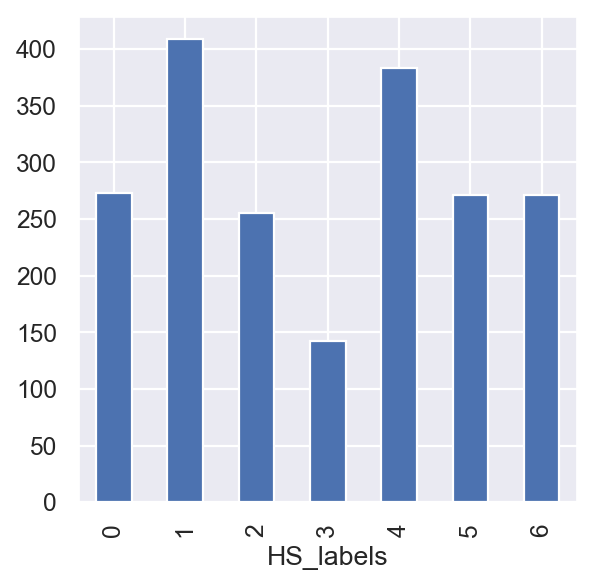

In [72]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

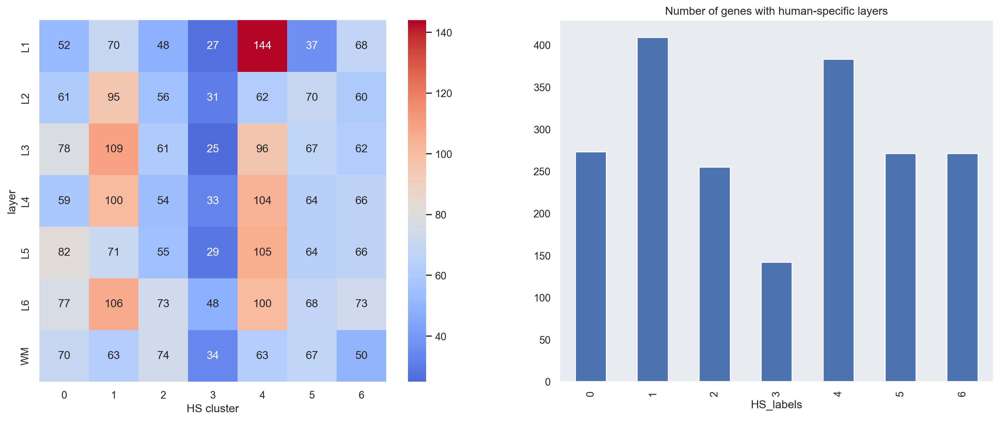

In [73]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=120)
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=80, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.sum(axis=1).plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
#ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [74]:
df_annotation = df[hum_spec_anova_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [75]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG     AARS1      AATK      ABAT     ABCA2     ABCA3  \
condition layer                                                               
chimp     L1    -0.124254  0.438115 -0.539509 -0.048830 -0.446716  0.004408   
          L2    -0.601969 -0.610583 -1.150563 -0.865423 -0.446716 -1.078788   
          L3     1.322821 -0.184341  0.164686 -0.757013  0.023459 -0.281512   
          L4     1.045246 -0.346950  0.145362  0.606082  0.117506 -0.005355   
          L5    -0.120974 -0.162974  0.883652  1.146056 -0.061804 -0.141554   

                    ABCB1     ABCC8     ABCD2     ABCD4  ...    ZNF706  \
condition layer                                          ...             
chimp     L1     1.925533 -1.597717  0.341589  0.435920  ...  0.254733   
          L2    -0.617952  1.198276  0.032164  1.432714  ...  1.471642   
          L3    -0.302529  0.397876  0.860705 -0.573886  ...  0.806847   
          L4    -0.411912  0.219108  0.378155 -0.410210  ...  0.056175   
          L5    -0.508543  0.189006 -0.572668  0.002664  ... -0.455261   

                   ZNF708    ZNF768    ZNF770    ZNF791     ZNFX1    ZNHIT3  \
condition layer                                                               
chimp     L1     0.571811 -0.552008  0.218645  1.243329  0.335096  0.299887   
          L2    -1.018149  1.178501 -0.350721 -0.087413  0.343525  0.643968   
          L3     0.230917 -0.698060 -0.317873  0.091345 -0.352491  0.080413   
          L4     0.598299 -0.022310 -0.986731 -0.709821 -0.297188 -0.253781   
          L5     0.017168 -0.404709 -0.419019 -0.296824 -0.641171  0.220328   

                   ZSWIM6    ZSWIM7       ZYX  
condition layer                                
chimp     L1     0.333100 -0.556111  0.252614  
          L2    -0.605761  1.347295 -0.645583  
          L3    -0.400222 -0.042495  0.367243  
          L4    -0.398616 -0.126006  0.850038  
          L5    -0.098673 -0.732700 -0.293464  

[5 rows x 2004 columns]

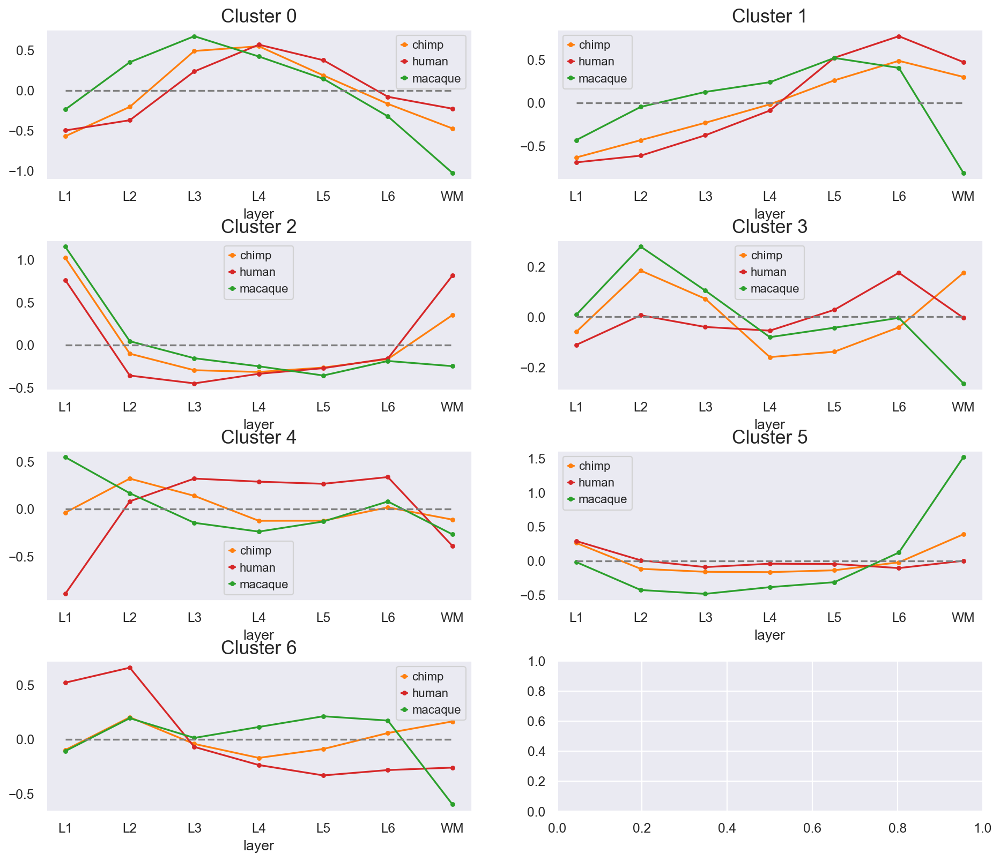

In [76]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels.loc[hum_spec_anova_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

## Clusterization of ANOVA sign and  hum-spec genes

### Hierarchial

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


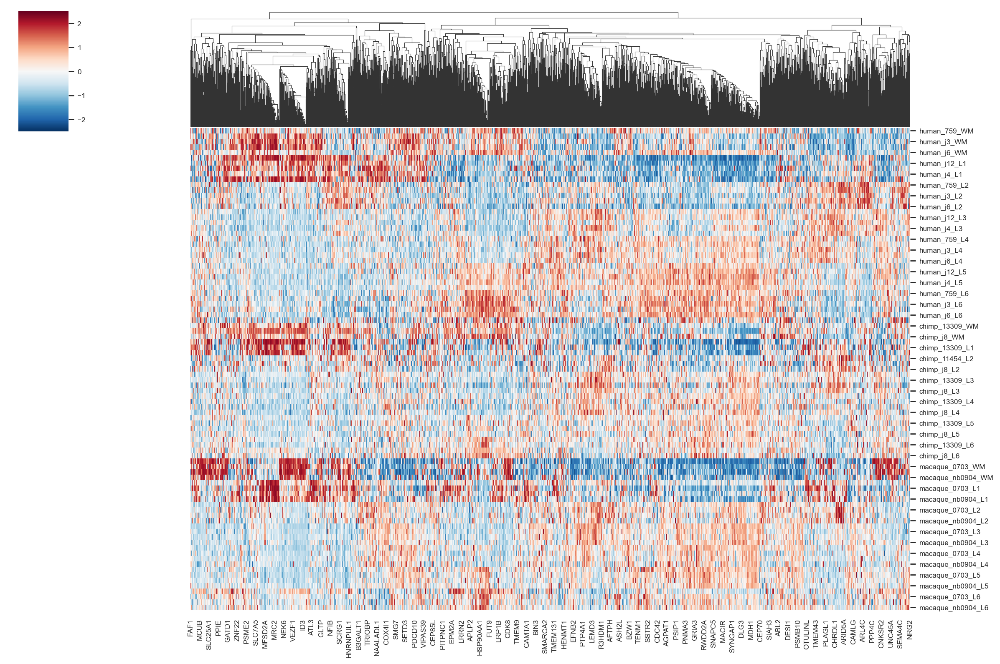

In [77]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_anova_inter], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral

In [78]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_anova_inter].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [79]:
labels = pd.Series(clustering.labels_, index=hum_spec_anova_inter).sort_values()
order = labels.sort_values().index
labels.to_csv('results/hs_anova_inter_clusters.csv')

<Axes: >

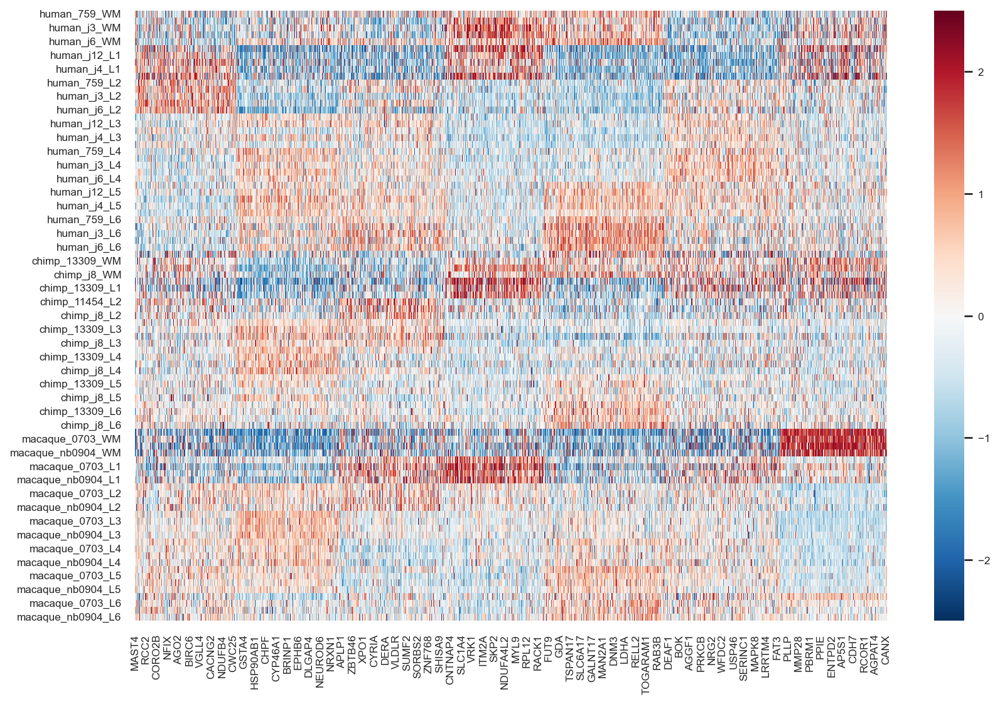

In [80]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

### Profiles

In [81]:
df_annotation = df[hum_spec_anova_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [82]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG     AARS1      AATK      ABAT     ABCA2     ABCA3  \
condition layer                                                               
chimp     L1    -0.124254  0.438115 -0.539509 -0.048830 -0.446716  0.004408   
          L2    -0.601969 -0.610583 -1.150563 -0.865423 -0.446716 -1.078788   
          L3     1.322821 -0.184341  0.164686 -0.757013  0.023459 -0.281512   
          L4     1.045246 -0.346950  0.145362  0.606082  0.117506 -0.005355   
          L5    -0.120974 -0.162974  0.883652  1.146056 -0.061804 -0.141554   

                    ABCB1     ABCC8     ABCD2     ABCD4  ...    ZNF706  \
condition layer                                          ...             
chimp     L1     1.925533 -1.597717  0.341589  0.435920  ...  0.254733   
          L2    -0.617952  1.198276  0.032164  1.432714  ...  1.471642   
          L3    -0.302529  0.397876  0.860705 -0.573886  ...  0.806847   
          L4    -0.411912  0.219108  0.378155 -0.410210  ...  0.056175   
          L5    -0.508543  0.189006 -0.572668  0.002664  ... -0.455261   

                   ZNF708    ZNF768    ZNF770    ZNF791     ZNFX1    ZNHIT3  \
condition layer                                                               
chimp     L1     0.571811 -0.552008  0.218645  1.243329  0.335096  0.299887   
          L2    -1.018149  1.178501 -0.350721 -0.087413  0.343525  0.643968   
          L3     0.230917 -0.698060 -0.317873  0.091345 -0.352491  0.080413   
          L4     0.598299 -0.022310 -0.986731 -0.709821 -0.297188 -0.253781   
          L5     0.017168 -0.404709 -0.419019 -0.296824 -0.641171  0.220328   

                   ZSWIM6    ZSWIM7       ZYX  
condition layer                                
chimp     L1     0.333100 -0.556111  0.252614  
          L2    -0.605761  1.347295 -0.645583  
          L3    -0.400222 -0.042495  0.367243  
          L4    -0.398616 -0.126006  0.850038  
          L5    -0.098673 -0.732700 -0.293464  

[5 rows x 2004 columns]

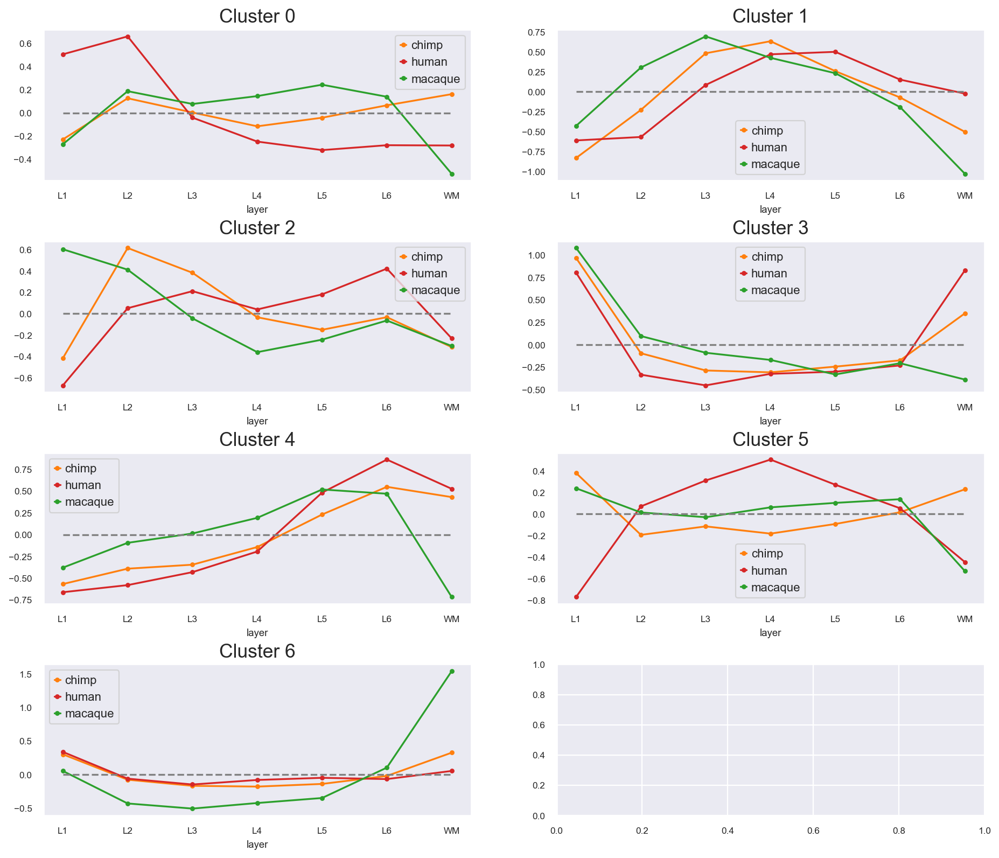

In [83]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels.loc[hum_spec_anova_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Describe clusters

In [84]:
labels.name = 'HS & ANOVA labels'
pivot_labels = labels.to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS & ANOVA labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS & ANOVA labels,,,,,,,
0,143,91,32,4,0,0,1
1,131,91,36,14,2,1,0
2,144,91,31,10,3,0,1
3,125,100,32,4,0,0,0
4,209,85,24,3,1,0,1
5,162,101,34,12,0,0,0
6,171,73,31,8,1,1,0


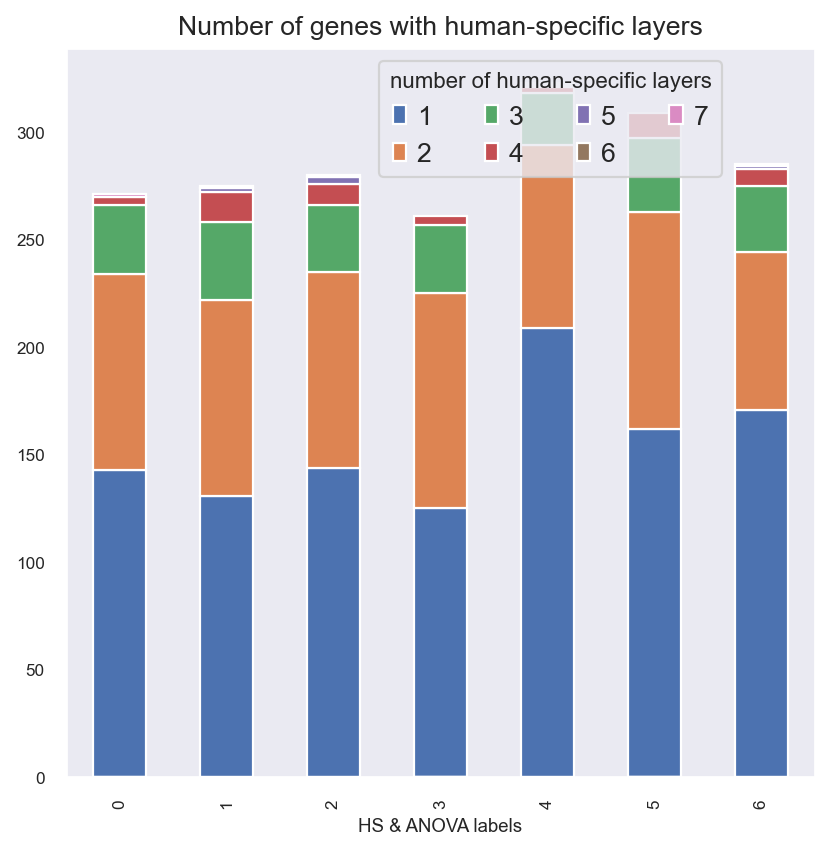

In [85]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [86]:
onehot_unstack = hum_spec_anova_onehot.unstack()
onehot_unstack.name = 'hum-spec & ANOVA'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS & ANOVA cluster'] = labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ANOVA'] == 1].groupby(['HS & ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ANOVA']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS & ANOVA cluster,,,,,,,
0,71,57,65,63,68,68,52
1,48,66,92,53,76,77,81
2,70,55,53,71,84,97,51
3,52,59,71,56,52,66,81
4,61,73,74,81,54,85,47
5,105,55,74,82,67,82,49
6,39,70,69,74,71,70,60


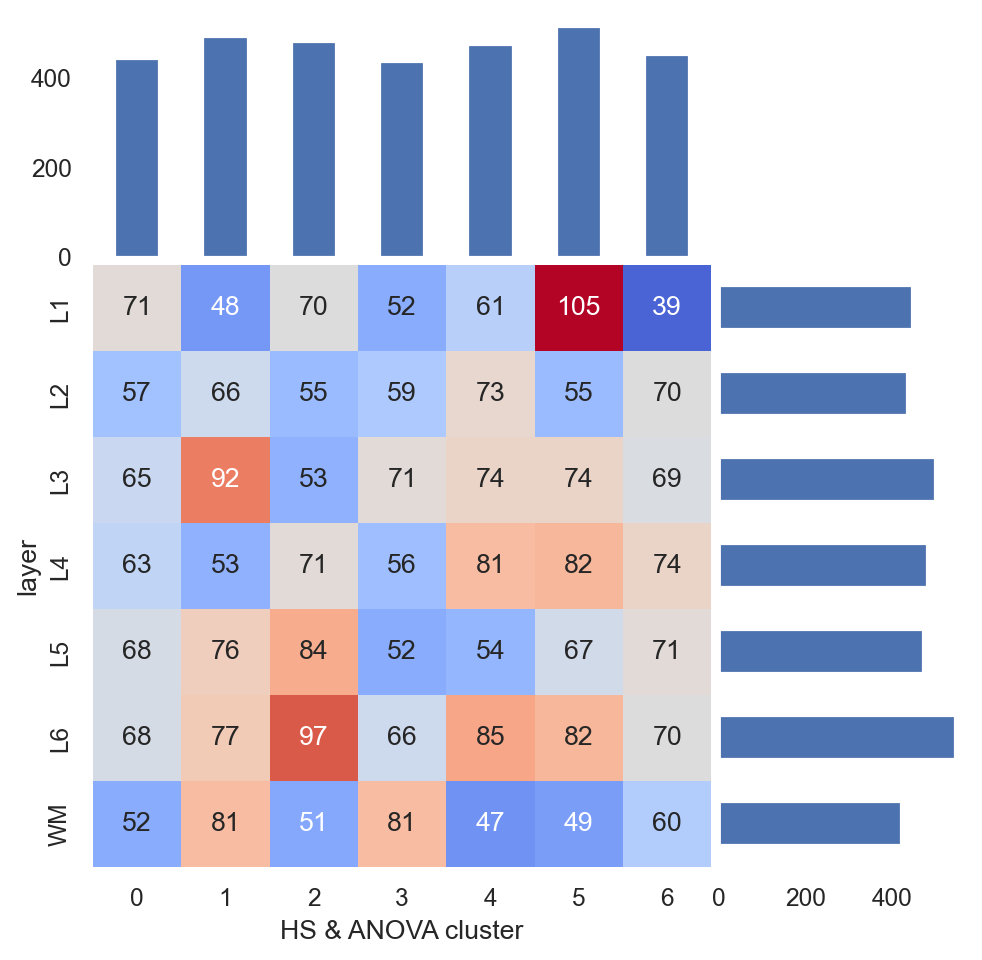

In [87]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=70, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

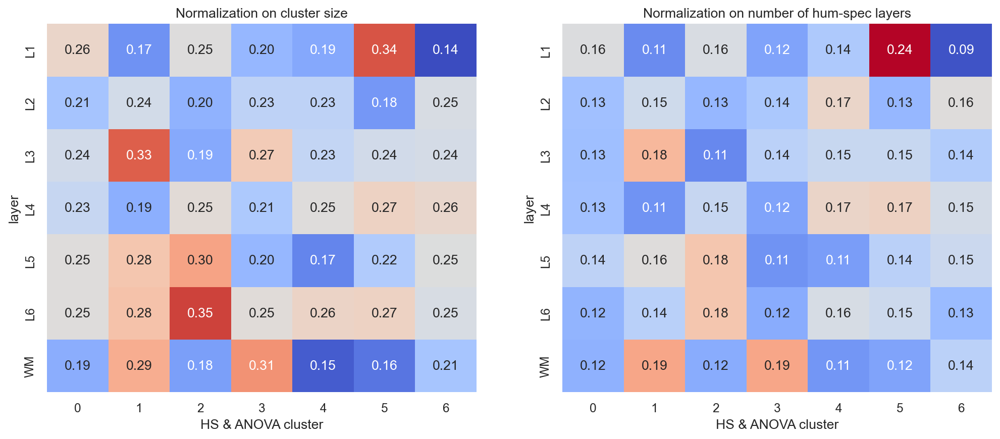

In [88]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=12)

frac = layer_count.T / hum_spec_anova_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=12)
plt.show()

<Axes: xlabel='HS & ANOVA labels'>

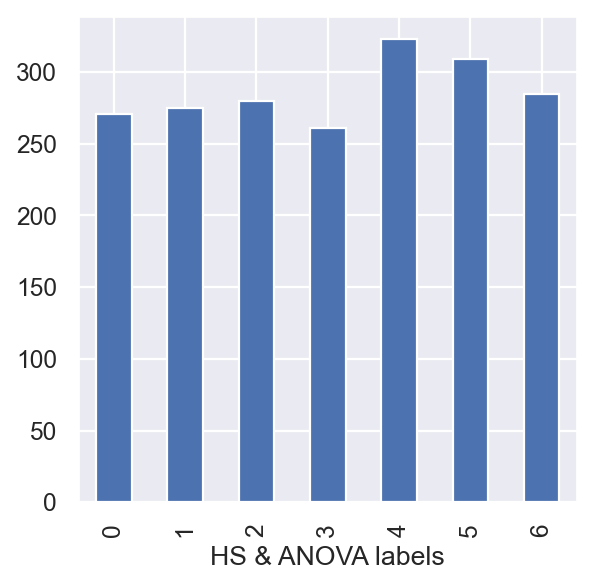

In [89]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

In [90]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
ZYX,1,0,0,0,0,0,0
TOP2B,1,0,0,0,0,0,0
TOPORS,1,0,0,0,0,0,0
TOR2A,1,0,0,0,0,0,0
ARL15,1,0,0,0,0,0,0


In [91]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ANOVA' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
MAST4,1,0,0,0,0,0,0
CCDC88C,1,0,0,0,0,0,0
KXD1,1,0,0,0,0,0,0
VGLL4,1,0,0,0,0,0,0
LCMT1,1,0,0,0,0,0,0


In [92]:
dummie_concat = pd.concat([anova_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
ZYX,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
TOP2B,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOPORS,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOR2A,1,0,0,0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
ARL15,1,0,0,0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


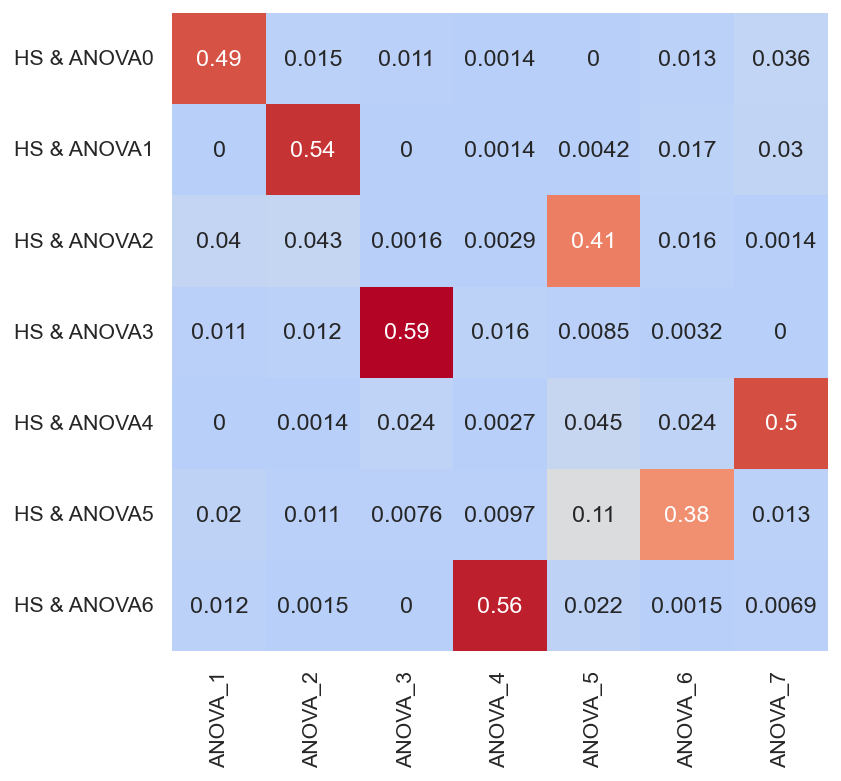

In [93]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, anova_dummies.columns], annot=True, cmap = 'coolwarm', center=0.12, cbar=False)
plt.grid(False)

In [94]:
gene_inter = labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS & ANOVA']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ANOVA,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,220.0,0.0,26.0,7.0,0.0,14.0,8.0
2,10.0,239.0,28.0,8.0,1.0,8.0,1.0
3,7.0,0.0,1.0,227.0,16.0,5.0,0.0
4,1.0,1.0,2.0,11.0,2.0,7.0,254.0
5,0.0,3.0,212.0,6.0,33.0,78.0,16.0
6,8.0,11.0,10.0,2.0,16.0,187.0,1.0
7,25.0,21.0,1.0,0.0,255.0,10.0,5.0


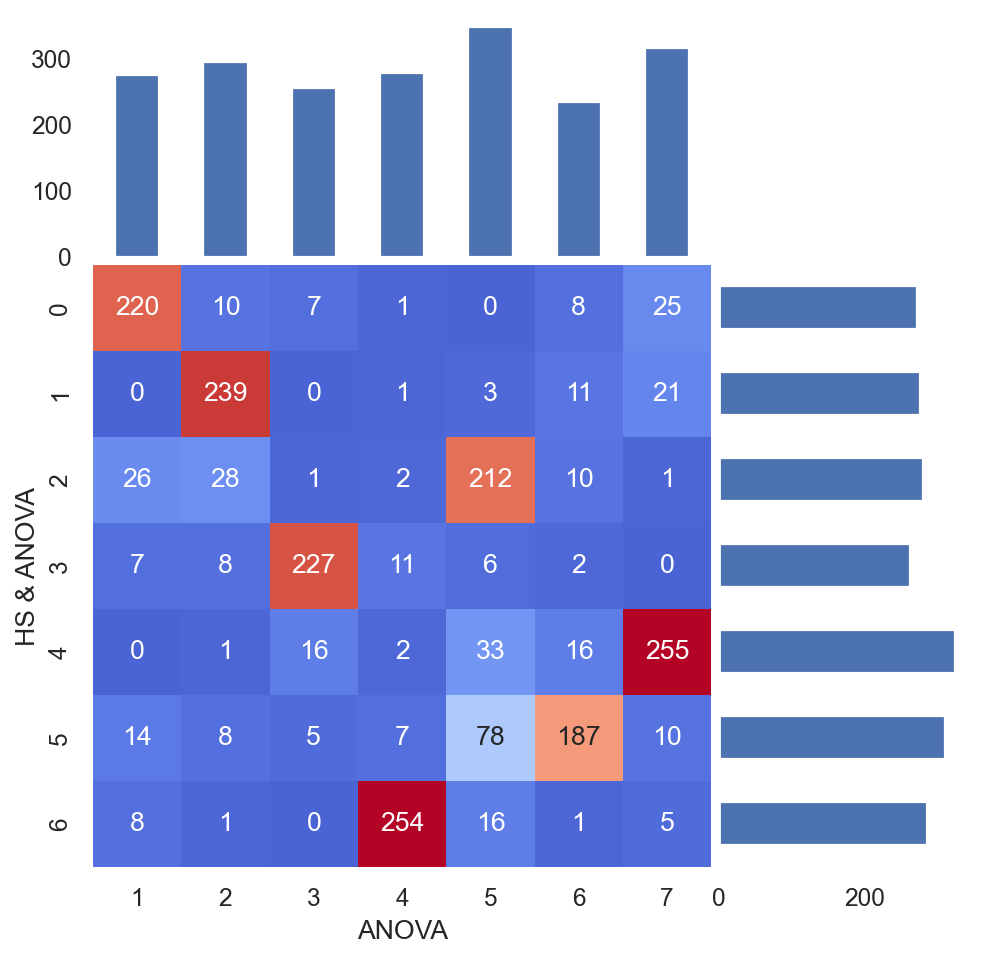

In [95]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=120, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [96]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
JAKMIP1,1,0,0,0,0,0,0
HMGCL,1,0,0,0,0,0,0
CACNG3,1,0,0,0,0,0,0
RTN4RL2,1,0,0,0,0,0,0
TOX2,1,0,0,0,0,0,0


In [97]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ANOVA' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
MAST4,1,0,0,0,0,0,0
CCDC88C,1,0,0,0,0,0,0
KXD1,1,0,0,0,0,0,0
VGLL4,1,0,0,0,0,0,0
LCMT1,1,0,0,0,0,0,0


In [98]:
dummie_concat = pd.concat([hs_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6,HS & ANOVA0,HS & ANOVA1,HS & ANOVA2,HS & ANOVA3,HS & ANOVA4,HS & ANOVA5,HS & ANOVA6
JAKMIP1,1,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
HMGCL,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CACNG3,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RTN4RL2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOX2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


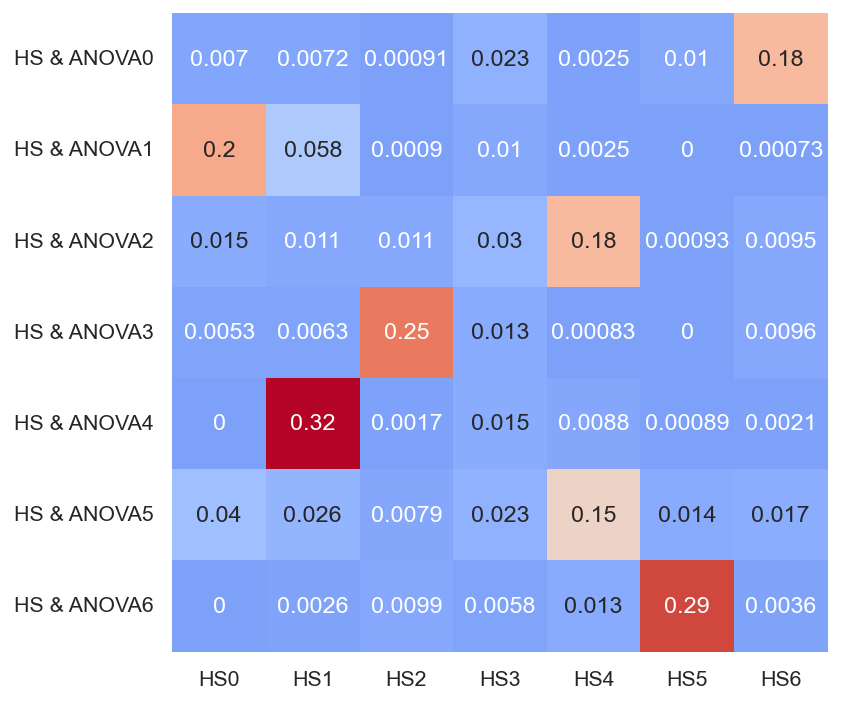

In [99]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.12, cbar=False)
plt.grid(False)

In [100]:
gene_inter = labels.index.intersection(hs_labels.index)
table_to_pivot = pd.concat([hs_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['HS', 'HS & ANOVA']
pivot_labels_inter = table_to_pivot.groupby('HS').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ANOVA,0,1,2,3,4,5,6
HS,,,,,,,
0,8.0,196.0,17.0,6.0,0.0,46.0,0.0
1,8.0,62.0,12.0,7.0,288.0,29.0,3.0
2,1.0,1.0,12.0,219.0,2.0,9.0,11.0
3,27.0,12.0,35.0,15.0,18.0,28.0,7.0
4,3.0,3.0,190.0,1.0,11.0,159.0,16.0
5,11.0,0.0,1.0,0.0,1.0,15.0,243.0
6,213.0,1.0,13.0,13.0,3.0,23.0,5.0


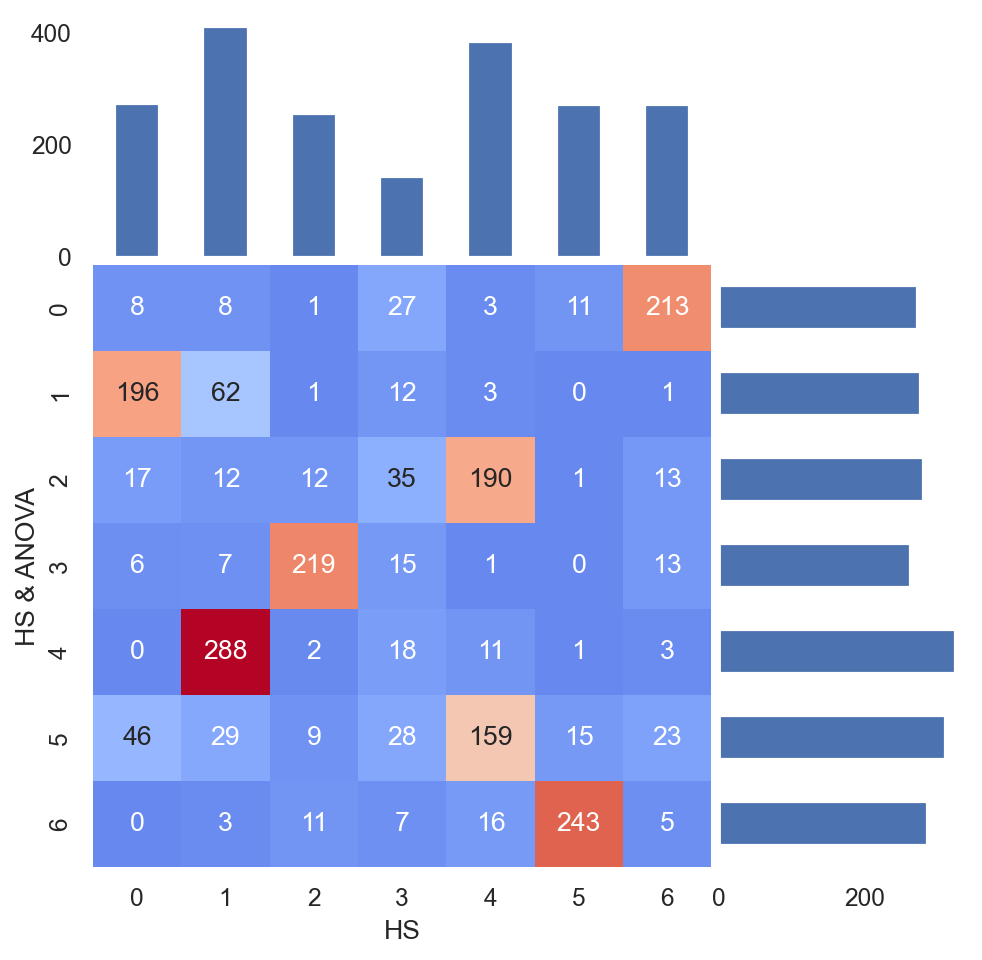

In [101]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=120, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

## Intersect with human-chimp significant

In [102]:
trs = [0.05, 0.1, 0.2]
hc_genes = {tr:ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp') & (ttest_res.p_val_adj < tr)].gene.tolist() for tr in trs}

In [103]:
list(map(len, hc_genes.values()))

[426, 1082, 2797]

### P-value = 0.1

In [104]:
hum_spec_ttest_inter = hum_spec_onehot.columns.intersection(hc_genes[0.1])
hum_spec_ttest_inter

Index(['AATK', 'ABHD11', 'ABI3BP', 'ABL2', 'ACAP1', 'ACBD6', 'ACSL4', 'ACTN2',
       'ADCY1', 'ADGRB3',
       ...
       'ZNF341', 'ZNF385B', 'ZNF529', 'ZNF579', 'ZNF672', 'ZNF706', 'ZNF708',
       'ZNF768', 'ZSWIM6', 'ZYX'],
      dtype='object', length=626)

### Visualization for layer freq

In [105]:
hum_spec_ttest_onehot = hum_spec_onehot[hum_spec_ttest_inter]

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

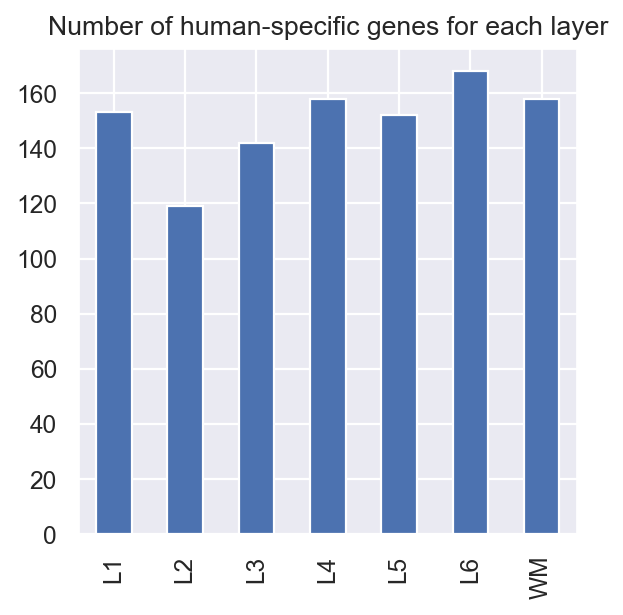

In [106]:
hum_spec_ttest_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

In [107]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_ttest_onehot.loc[lay1] * hum_spec_ttest_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_ttest_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_ttest_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,153,23,21,23,36,39,25
L2,23,119,19,30,21,35,20
L3,21,19,142,26,34,30,32
L4,23,30,26,158,37,31,36
L5,36,21,34,37,152,35,25
L6,39,35,30,31,35,168,30
WM,25,20,32,36,25,30,158


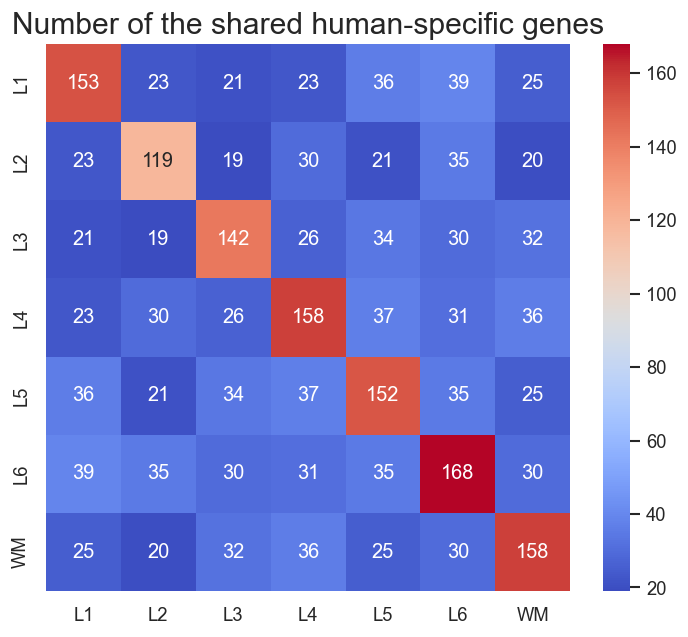

In [108]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

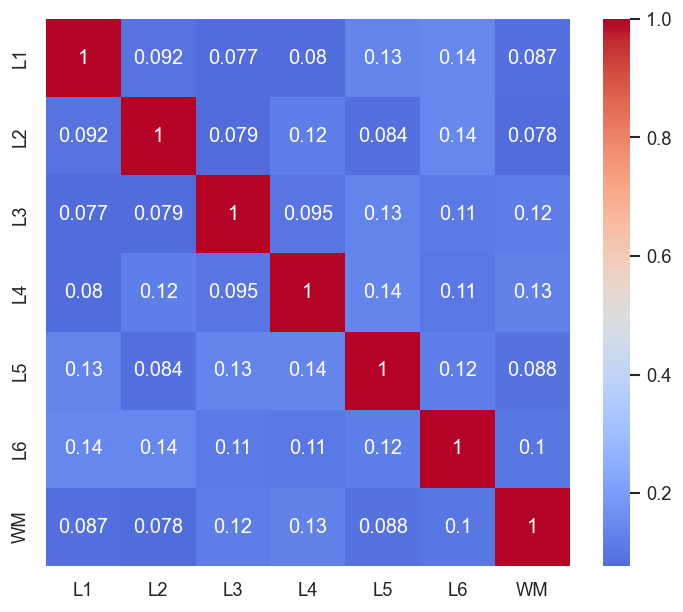

In [109]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_ttest_onehot), columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
pairwise_jaccard

plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

### ANOVA clusters visualization

In [110]:
pivot_labels = anova_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='ANOVA_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
ANOVA_labels,,,,,,,
1,67,30,9,2,0,0,1
2,34,25,16,4,0,1,0
3,24,23,9,0,0,0,0
4,49,18,14,3,0,1,0
5,58,39,16,7,1,0,0
6,58,41,6,2,0,0,0
7,43,20,4,0,0,0,1


In [111]:
pivot_labels_fraction = pivot_labels / anova_labels.value_counts().sort_index().values.reshape(7, 1)

(0.0, 0.4)

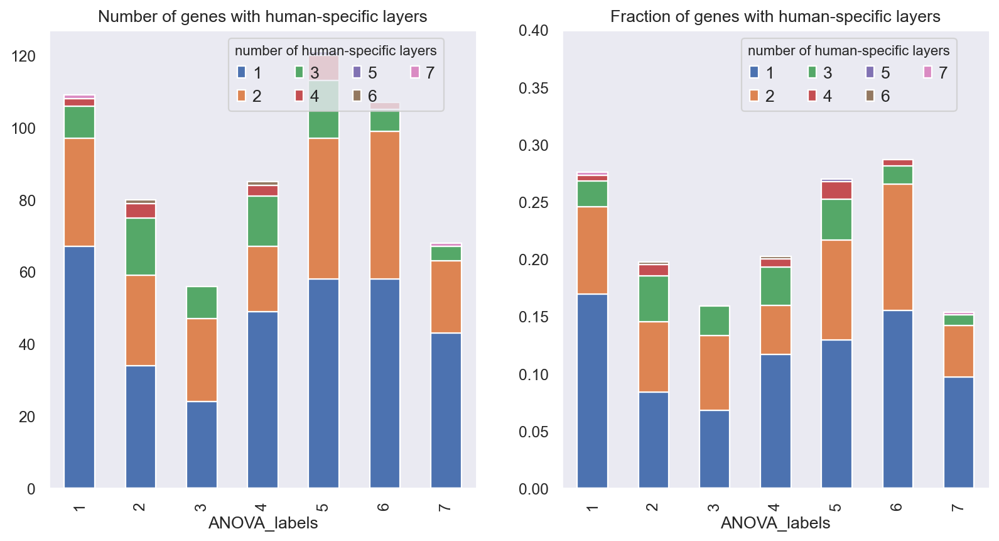

In [112]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[0], stacked=True)
ax[0].set_title('Number of genes with human-specific layers')
ax[0].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[0].grid(False)

pivot_labels_fraction.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Fraction of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)
ax[1].set_ylim(0, 0.4)

In [113]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['ANOVA cluster'] = anova_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
ANOVA cluster,,,,,,,
1,22,21,20,23,25,32,26
2,19,12,30,17,22,26,28
3,10,12,13,13,14,11,24
4,14,16,15,27,25,22,26
5,57,20,22,29,38,37,14
6,16,21,25,33,18,31,22
7,15,17,17,16,10,9,18


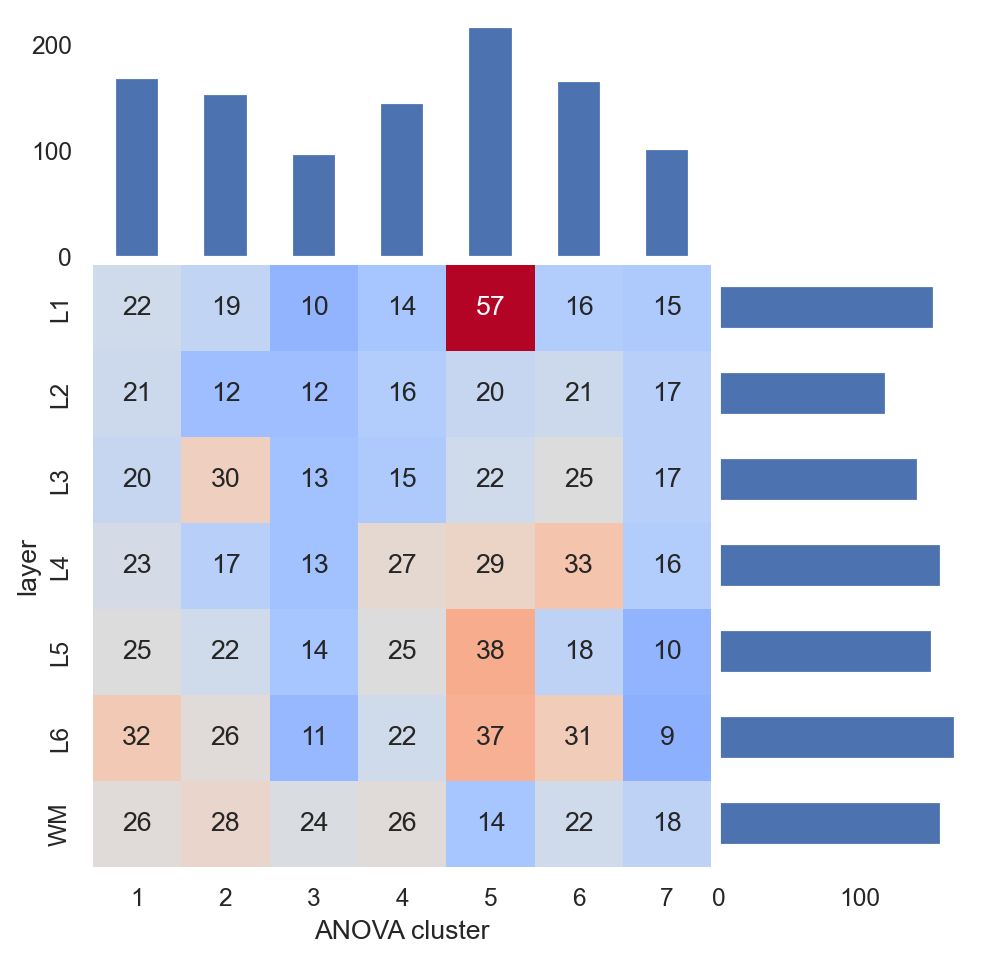

In [114]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

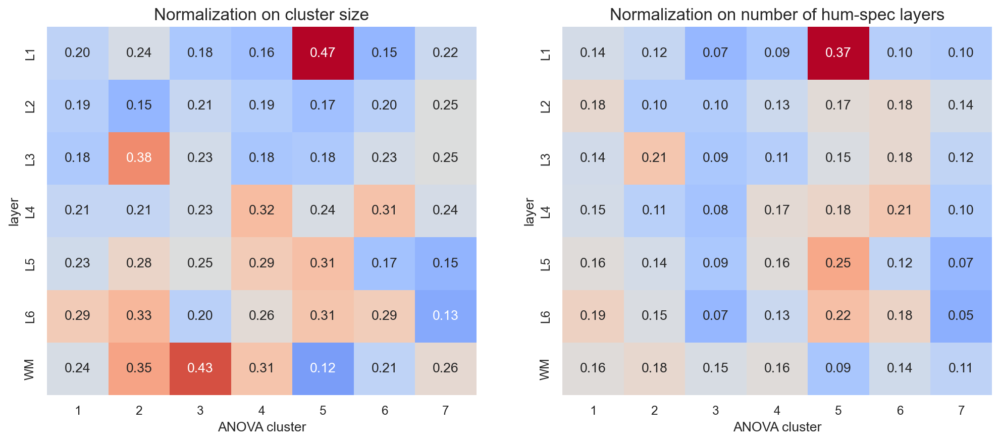

In [115]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

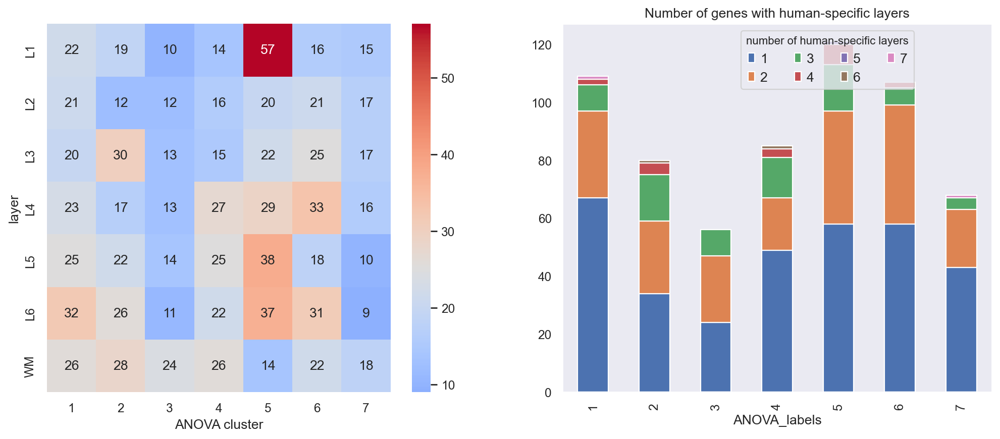

In [116]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [117]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [118]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK    ABHD11    ABI3BP      ABL2     ACAP1     ACBD6  \
condition layer                                                               
chimp     L1    -0.539509 -0.403743  0.121710 -0.686058 -0.446778 -0.158668   
          L2    -1.150563  0.472163 -1.142022 -0.686058 -0.808796  1.496868   
          L3     0.164686 -0.211259 -0.242678  0.213414  0.179863 -0.285135   
          L4     0.145362 -0.484670 -0.656526 -0.275781  0.918027 -0.665936   
          L5     0.883652  0.474505 -0.564811  0.105707  0.304401 -0.639077   

                    ACSL4     ACTN2  ADCY1    ADGRB3  ...    ZNF341   ZNF385B  \
condition layer                                       ...                       
chimp     L1     0.524083 -0.188512    0.0  1.803627  ... -1.010875 -0.429484   
          L2    -0.818999  0.808020    0.0 -0.395117  ...  0.252432 -0.648332   
          L3     0.215657  1.410957    0.0 -0.178409  ...  0.022365 -0.926064   
          L4    -0.525698 -0.017920    0.0 -0.378734  ...  0.517762 -0.055822   
          L5     0.203608 -0.505067    0.0 -0.652525  ...  0.354078  1.095097   

                   ZNF529    ZNF579  ZNF672    ZNF706    ZNF708    ZNF768  \
condition layer                                                             
chimp     L1    -0.406683 -0.807146     0.0  0.254733  0.571811 -0.552008   
          L2     0.253855 -0.023190     0.0  1.471642 -1.018149  1.178501   
          L3    -0.238785  0.859209     0.0  0.806847  0.230917 -0.698060   
          L4    -0.466032 -0.529854     0.0  0.056175  0.598299 -0.022310   
          L5    -0.460608  0.223835     0.0 -0.455261  0.017168 -0.404709   

                   ZSWIM6       ZYX  
condition layer                      
chimp     L1     0.333100  0.252614  
          L2    -0.605761 -0.645583  
          L3    -0.400222  0.367243  
          L4    -0.398616  0.850038  
          L5    -0.098673 -0.293464  

[5 rows x 626 columns]

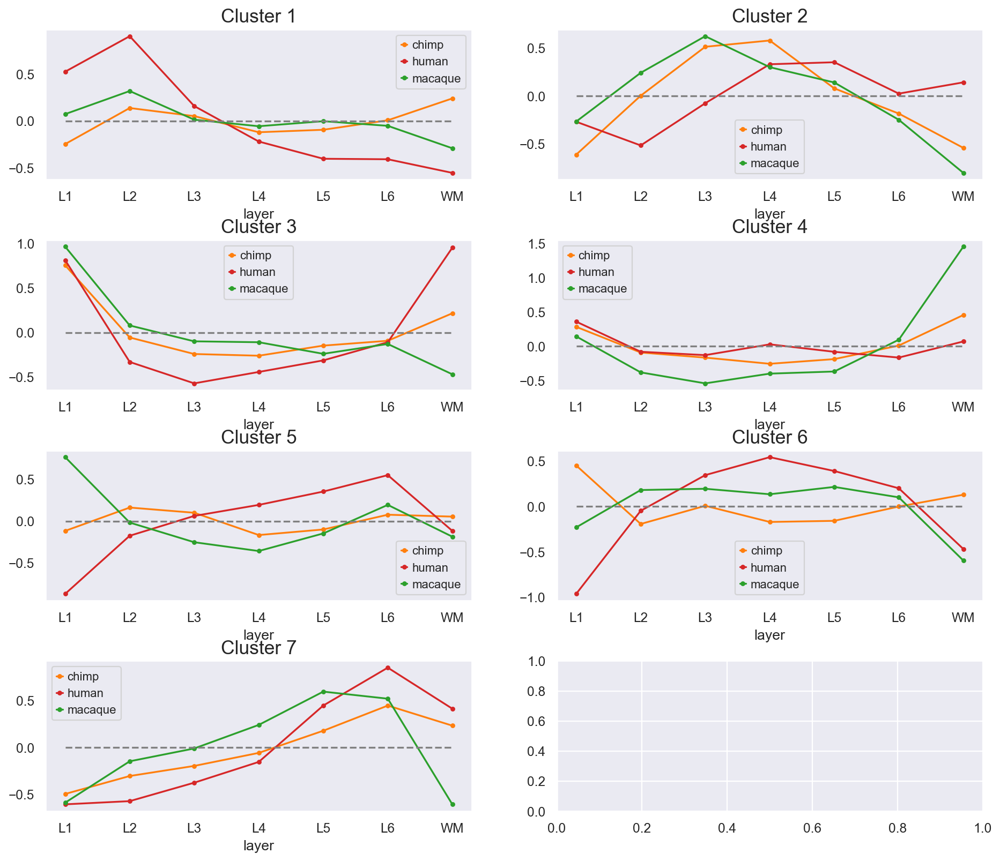

In [119]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(anova_labels.unique(), axes.flatten()):
    genes = anova_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Human-specific clusters visualization

In [120]:
hs_labels.name = 'HS_labels'
pivot_labels = hs_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS_labels,,,,,,,
0,30,29,12,3,0,1,0
1,60,29,9,1,0,0,1
2,31,20,9,0,0,0,0
3,29,20,4,1,0,0,0
4,70,50,17,9,1,0,0
5,51,21,14,3,0,1,0
6,62,27,9,1,0,0,1


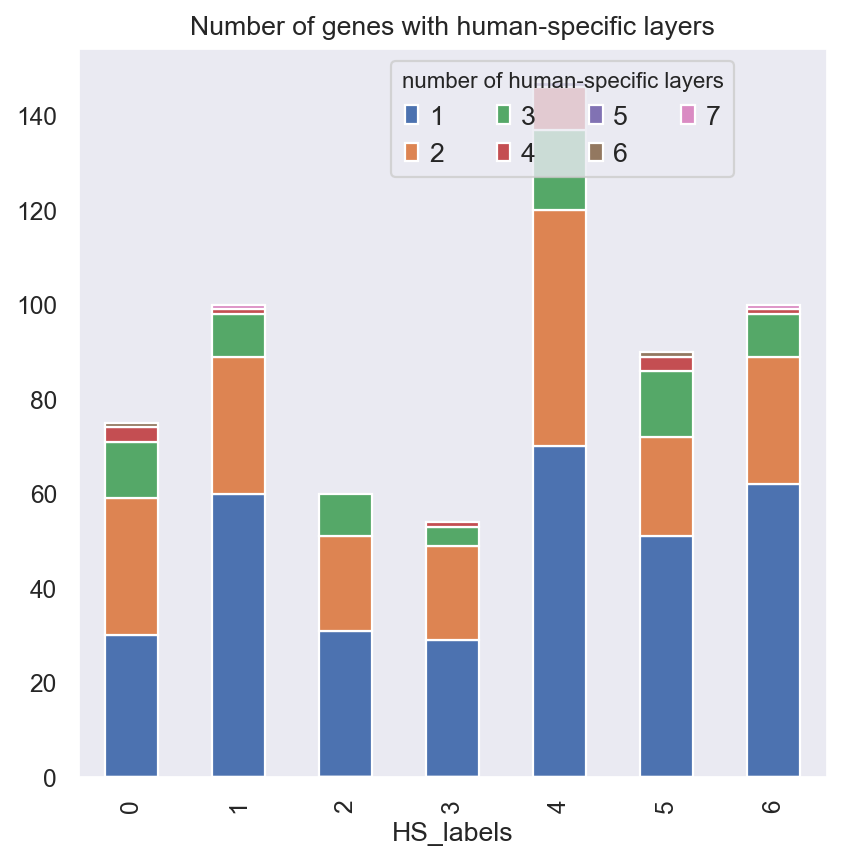

In [121]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [122]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS cluster'] = hs_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS cluster,,,,,,,
0,22,14,20,18,24,24,20
1,19,25,28,23,14,20,27
2,11,10,10,16,13,15,23
3,10,12,10,12,8,16,17
4,55,25,38,45,44,37,18
5,14,18,20,22,23,24,32
6,22,15,16,22,26,32,21


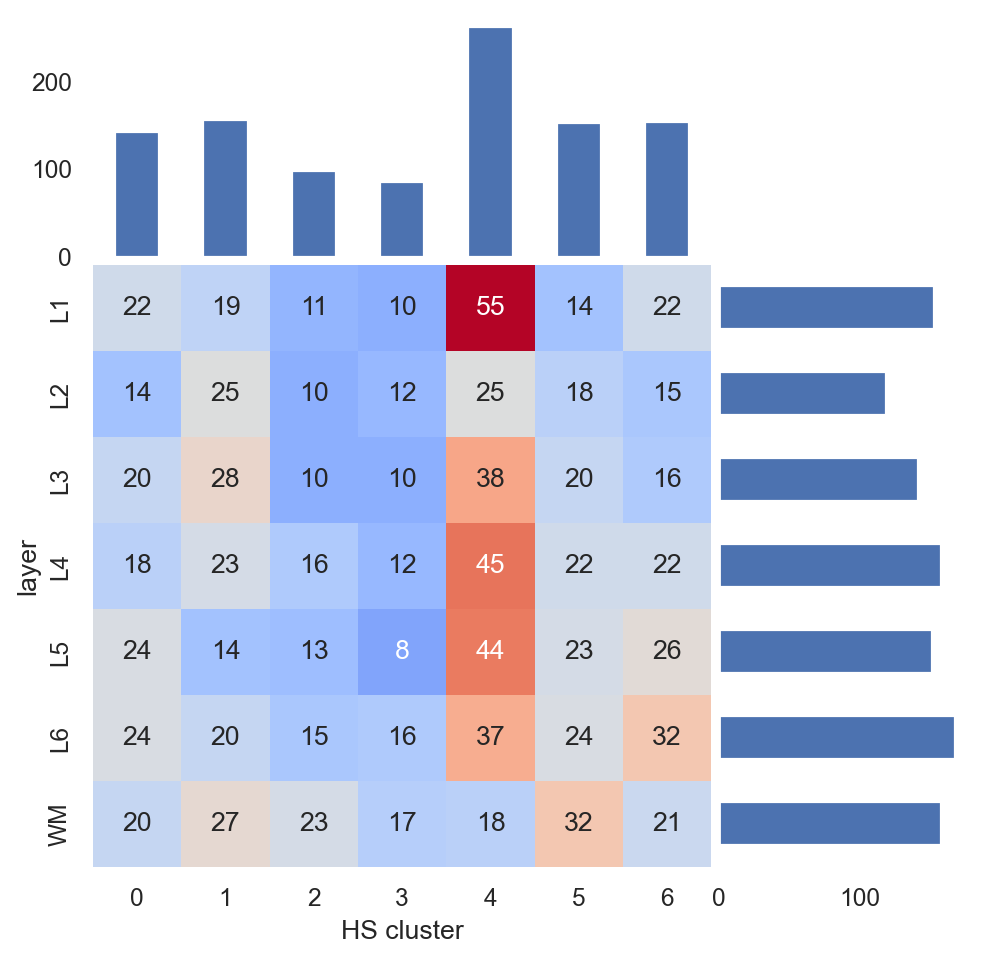

In [123]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

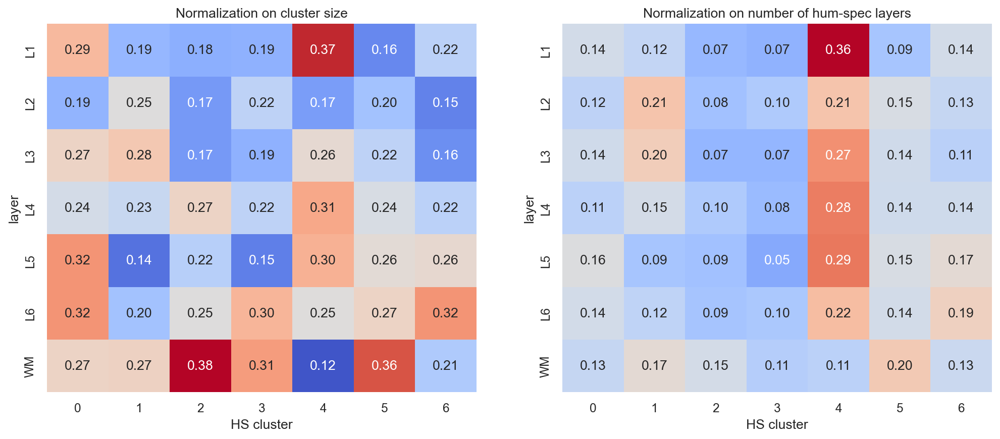

In [124]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

<Axes: xlabel='HS_labels'>

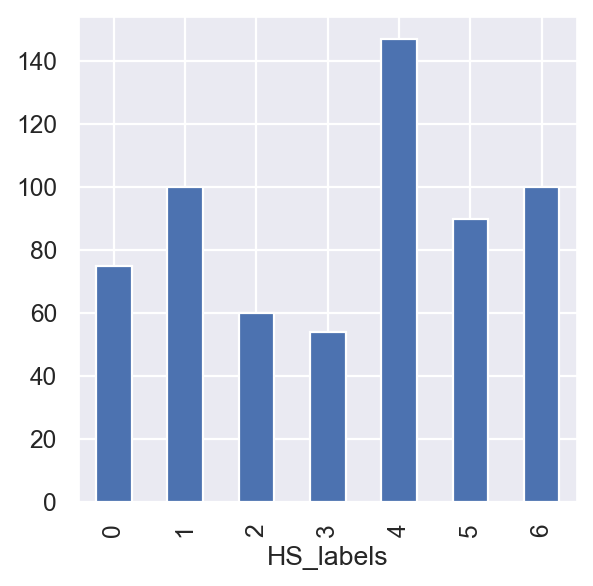

In [125]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

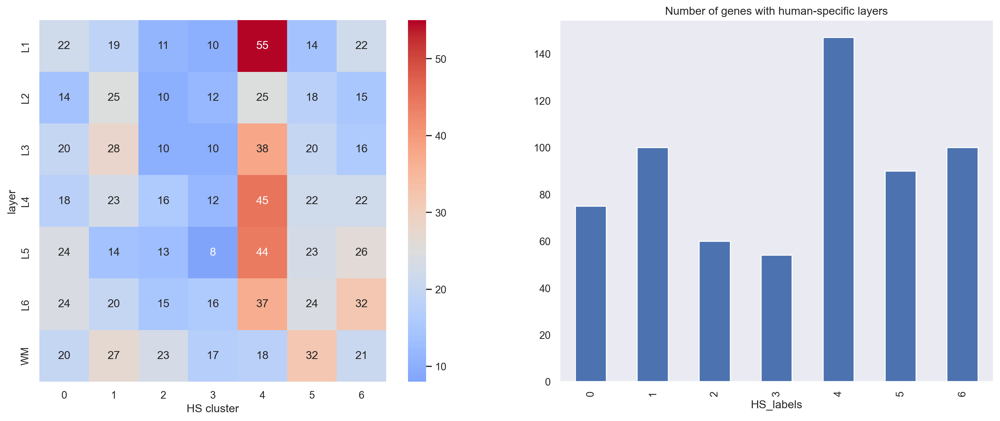

In [126]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=120)
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.sum(axis=1).plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
#ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [127]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [128]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK    ABHD11    ABI3BP      ABL2     ACAP1     ACBD6  \
condition layer                                                               
chimp     L1    -0.539509 -0.403743  0.121710 -0.686058 -0.446778 -0.158668   
          L2    -1.150563  0.472163 -1.142022 -0.686058 -0.808796  1.496868   
          L3     0.164686 -0.211259 -0.242678  0.213414  0.179863 -0.285135   
          L4     0.145362 -0.484670 -0.656526 -0.275781  0.918027 -0.665936   
          L5     0.883652  0.474505 -0.564811  0.105707  0.304401 -0.639077   

                    ACSL4     ACTN2  ADCY1    ADGRB3  ...    ZNF341   ZNF385B  \
condition layer                                       ...                       
chimp     L1     0.524083 -0.188512    0.0  1.803627  ... -1.010875 -0.429484   
          L2    -0.818999  0.808020    0.0 -0.395117  ...  0.252432 -0.648332   
          L3     0.215657  1.410957    0.0 -0.178409  ...  0.022365 -0.926064   
          L4    -0.525698 -0.017920    0.0 -0.378734  ...  0.517762 -0.055822   
          L5     0.203608 -0.505067    0.0 -0.652525  ...  0.354078  1.095097   

                   ZNF529    ZNF579  ZNF672    ZNF706    ZNF708    ZNF768  \
condition layer                                                             
chimp     L1    -0.406683 -0.807146     0.0  0.254733  0.571811 -0.552008   
          L2     0.253855 -0.023190     0.0  1.471642 -1.018149  1.178501   
          L3    -0.238785  0.859209     0.0  0.806847  0.230917 -0.698060   
          L4    -0.466032 -0.529854     0.0  0.056175  0.598299 -0.022310   
          L5    -0.460608  0.223835     0.0 -0.455261  0.017168 -0.404709   

                   ZSWIM6       ZYX  
condition layer                      
chimp     L1     0.333100  0.252614  
          L2    -0.605761 -0.645583  
          L3    -0.400222  0.367243  
          L4    -0.398616  0.850038  
          L5    -0.098673 -0.293464  

[5 rows x 626 columns]

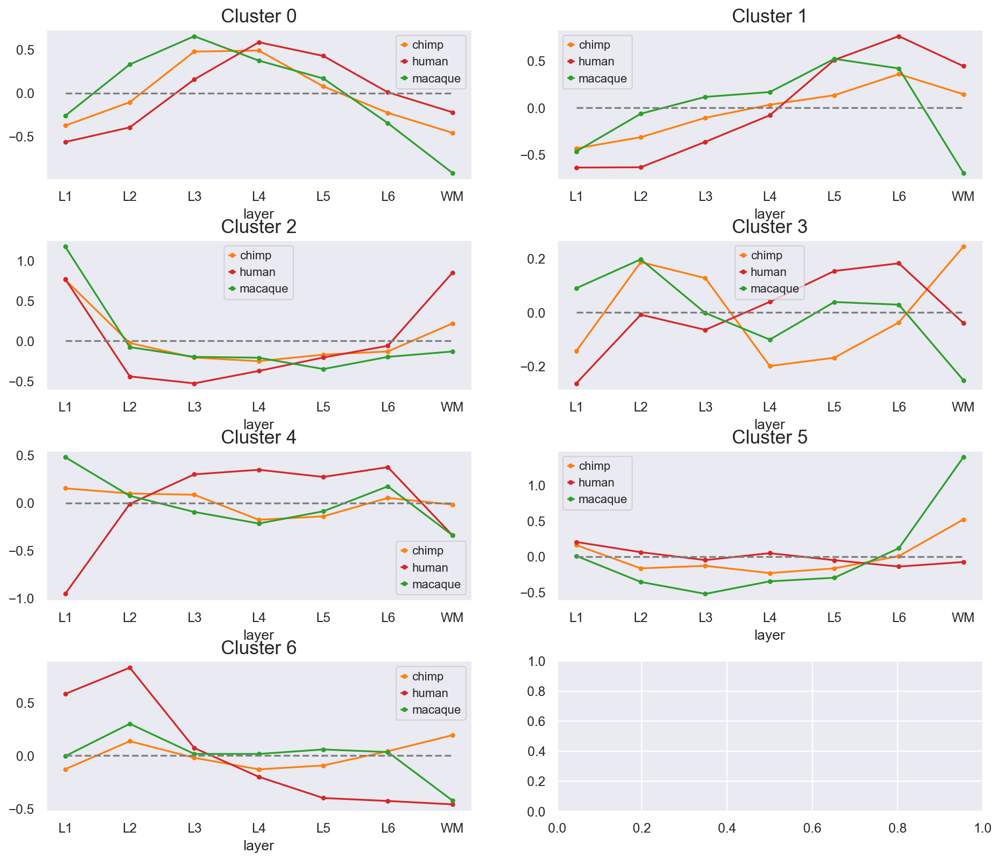

In [129]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

## Clusterization of ttest sign and  hum-spec genes

### Hierarchial

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


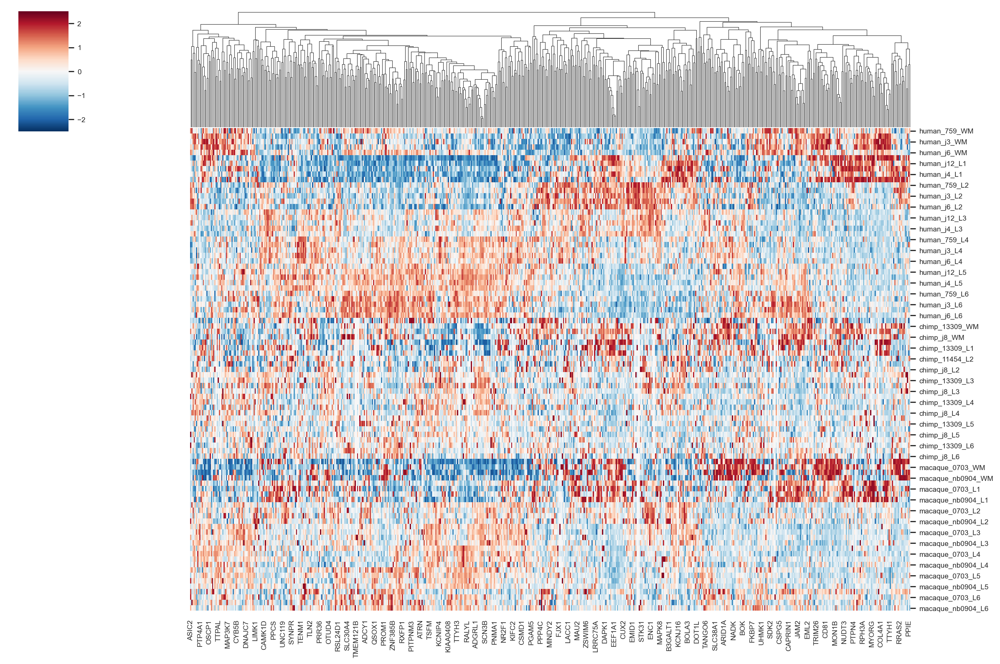

In [130]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_ttest_inter], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral

In [131]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_ttest_inter].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [132]:
labels = pd.Series(clustering.labels_, index=hum_spec_ttest_inter).sort_values()
order = labels.sort_values().index
labels.to_csv('results/hs_ttest_inter_clusters.csv')

<Axes: >

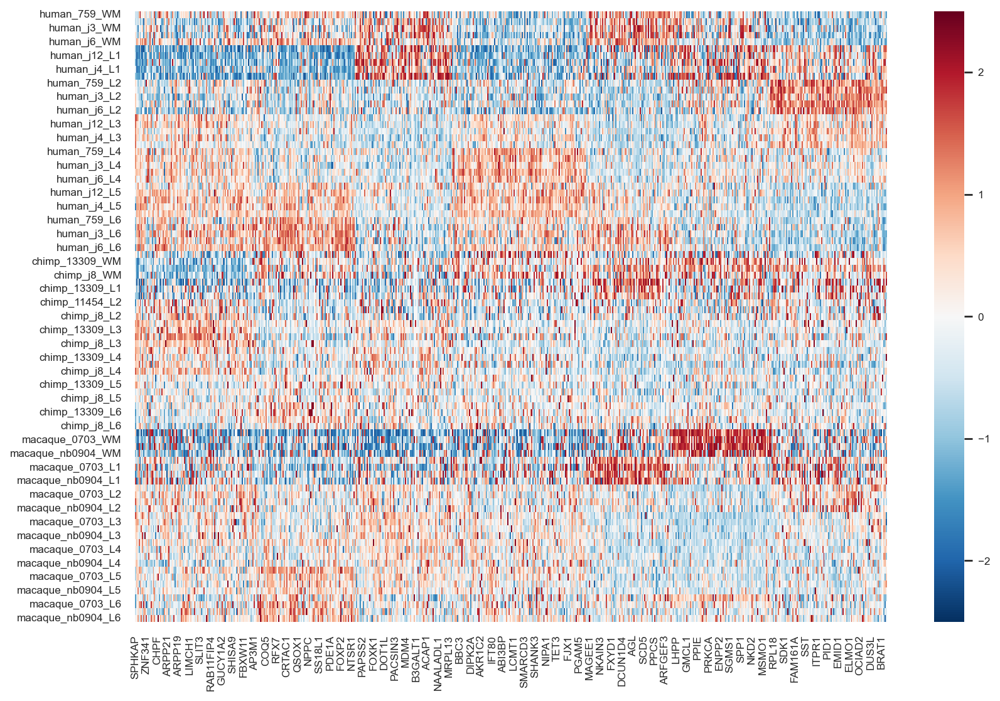

In [133]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

In [134]:
sns.set(font_scale=1)

### Profiles

In [135]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [136]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK    ABHD11    ABI3BP      ABL2     ACAP1     ACBD6  \
condition layer                                                               
chimp     L1    -0.539509 -0.403743  0.121710 -0.686058 -0.446778 -0.158668   
          L2    -1.150563  0.472163 -1.142022 -0.686058 -0.808796  1.496868   
          L3     0.164686 -0.211259 -0.242678  0.213414  0.179863 -0.285135   
          L4     0.145362 -0.484670 -0.656526 -0.275781  0.918027 -0.665936   
          L5     0.883652  0.474505 -0.564811  0.105707  0.304401 -0.639077   

                    ACSL4     ACTN2  ADCY1    ADGRB3  ...    ZNF341   ZNF385B  \
condition layer                                       ...                       
chimp     L1     0.524083 -0.188512    0.0  1.803627  ... -1.010875 -0.429484   
          L2    -0.818999  0.808020    0.0 -0.395117  ...  0.252432 -0.648332   
          L3     0.215657  1.410957    0.0 -0.178409  ...  0.022365 -0.926064   
          L4    -0.525698 -0.017920    0.0 -0.378734  ...  0.517762 -0.055822   
          L5     0.203608 -0.505067    0.0 -0.652525  ...  0.354078  1.095097   

                   ZNF529    ZNF579  ZNF672    ZNF706    ZNF708    ZNF768  \
condition layer                                                             
chimp     L1    -0.406683 -0.807146     0.0  0.254733  0.571811 -0.552008   
          L2     0.253855 -0.023190     0.0  1.471642 -1.018149  1.178501   
          L3    -0.238785  0.859209     0.0  0.806847  0.230917 -0.698060   
          L4    -0.466032 -0.529854     0.0  0.056175  0.598299 -0.022310   
          L5    -0.460608  0.223835     0.0 -0.455261  0.017168 -0.404709   

                   ZSWIM6       ZYX  
condition layer                      
chimp     L1     0.333100  0.252614  
          L2    -0.605761 -0.645583  
          L3    -0.400222  0.367243  
          L4    -0.398616  0.850038  
          L5    -0.098673 -0.293464  

[5 rows x 626 columns]

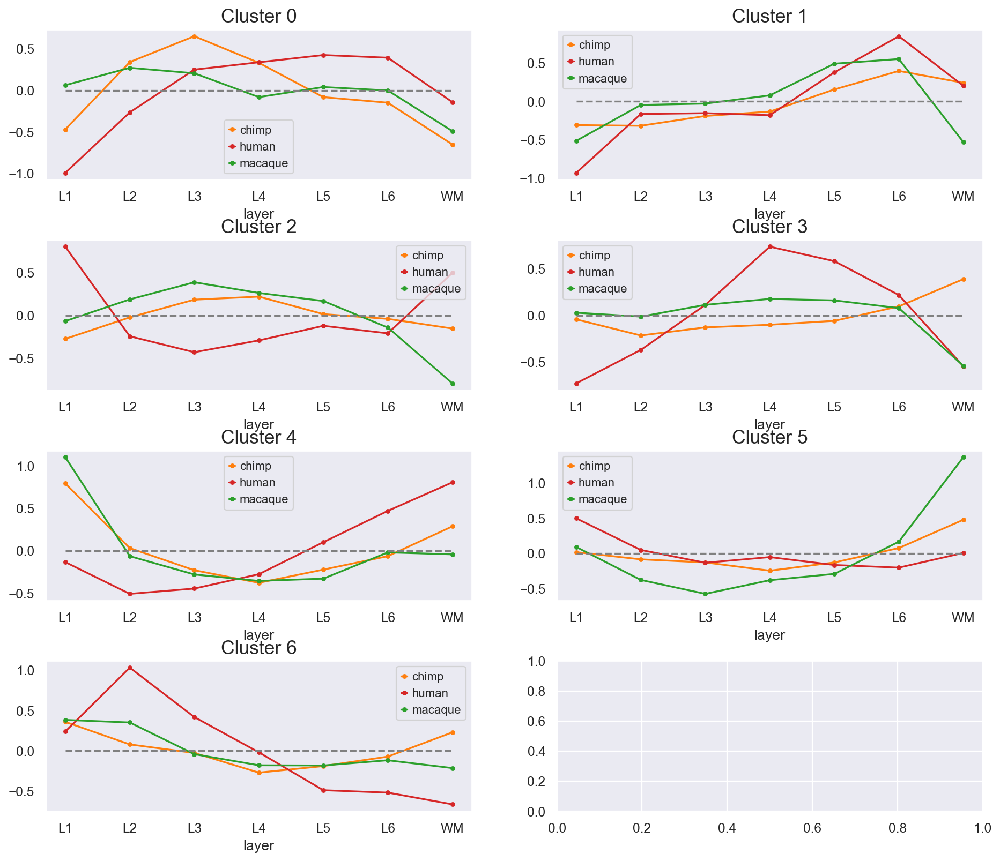

In [137]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Describe clusters

In [138]:
labels.name = 'HS & ttest labels'
pivot_labels = labels.to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS & ttest labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,5,6,7
HS & ttest labels,,,,,,,
0,49,38,6,5,0,0,0
1,55,18,11,0,0,0,1
2,38,32,10,1,0,0,0
3,53,39,15,4,0,1,0
4,34,21,11,2,1,0,0
5,50,18,13,3,0,1,0
6,54,30,8,3,0,0,1


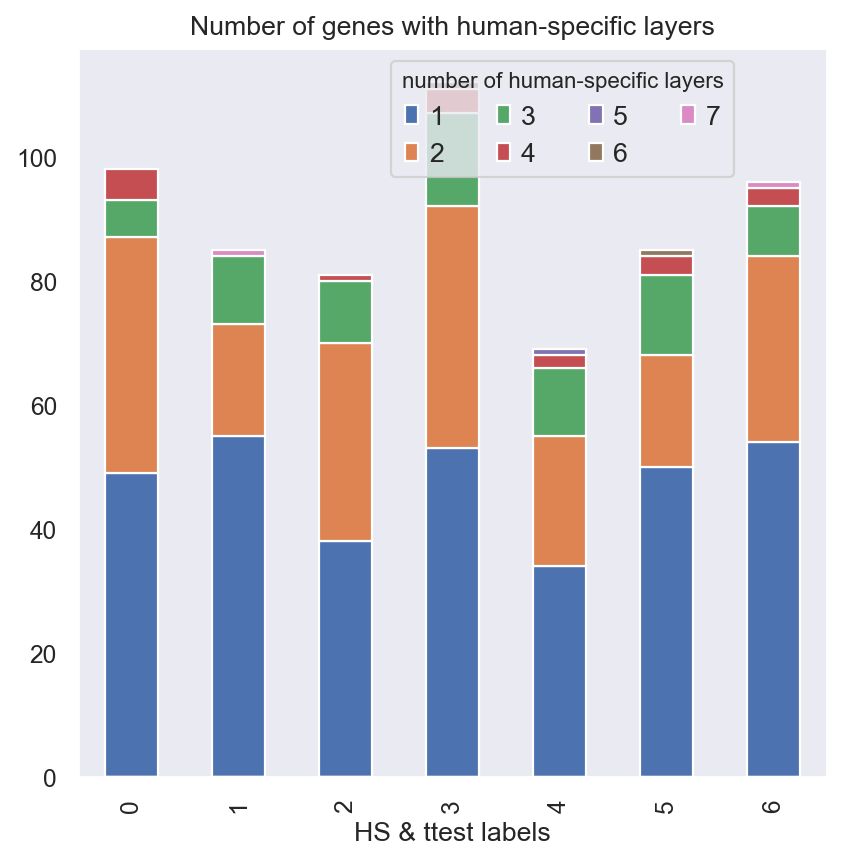

In [139]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [140]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS & ttest cluster'] = labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS & ttest cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS & ttest cluster,,,,,,,
0,31,19,21,21,28,26,17
1,17,18,22,22,13,20,19
2,15,10,28,19,21,12,31
3,36,25,22,34,32,37,12
4,24,9,13,15,21,20,20
5,15,19,17,22,18,23,29
6,15,19,19,25,19,30,30


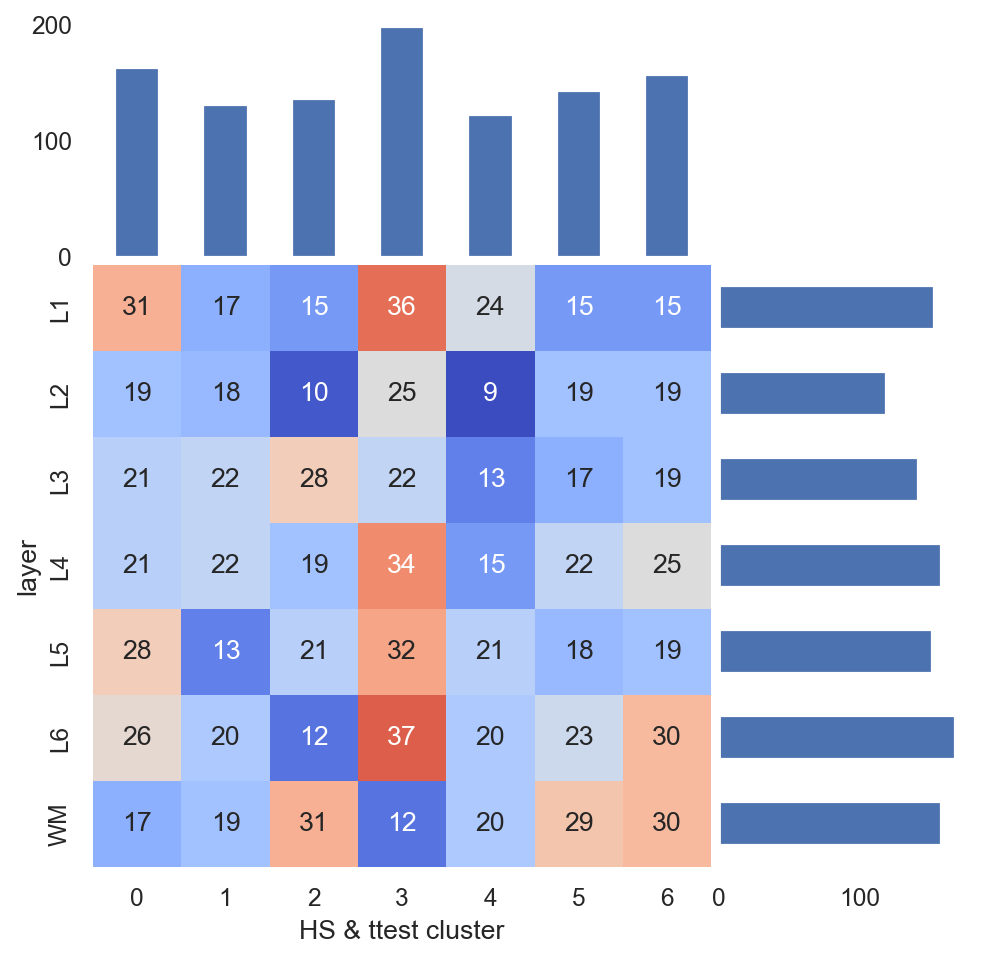

In [141]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

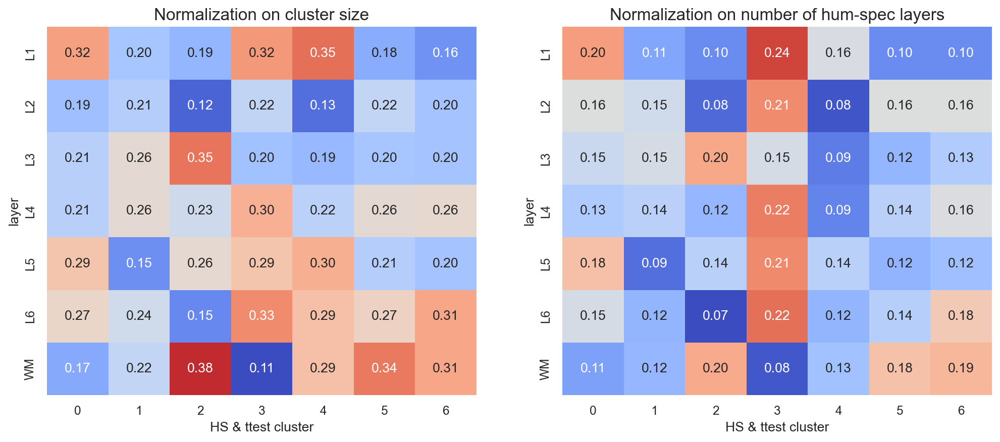

In [142]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

<Axes: xlabel='HS & ttest labels'>

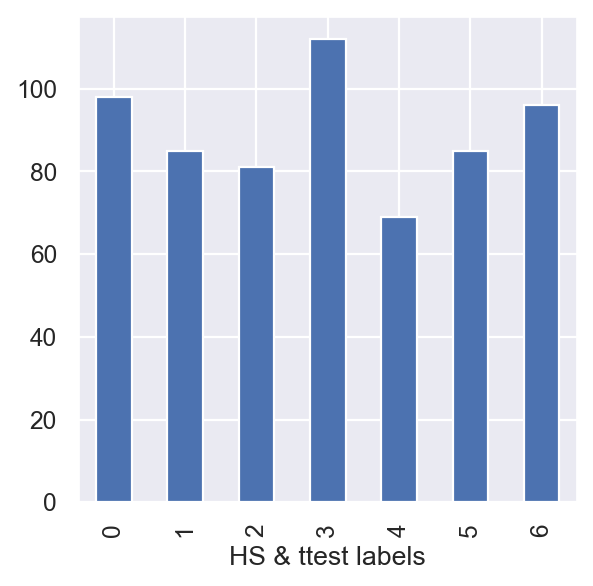

In [143]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

In [144]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
ZYX,1,0,0,0,0,0,0
TOP2B,1,0,0,0,0,0,0
TOPORS,1,0,0,0,0,0,0
TOR2A,1,0,0,0,0,0,0
ARL15,1,0,0,0,0,0,0


In [145]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ttest' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
SPHKAP,1,0,0,0,0,0,0
SLC27A5,1,0,0,0,0,0,0
CELF1,1,0,0,0,0,0,0
SLC2A13,1,0,0,0,0,0,0
PANX1,1,0,0,0,0,0,0


In [146]:
dummie_concat = pd.concat([anova_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
ZYX,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
TOP2B,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOPORS,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOR2A,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ARL15,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


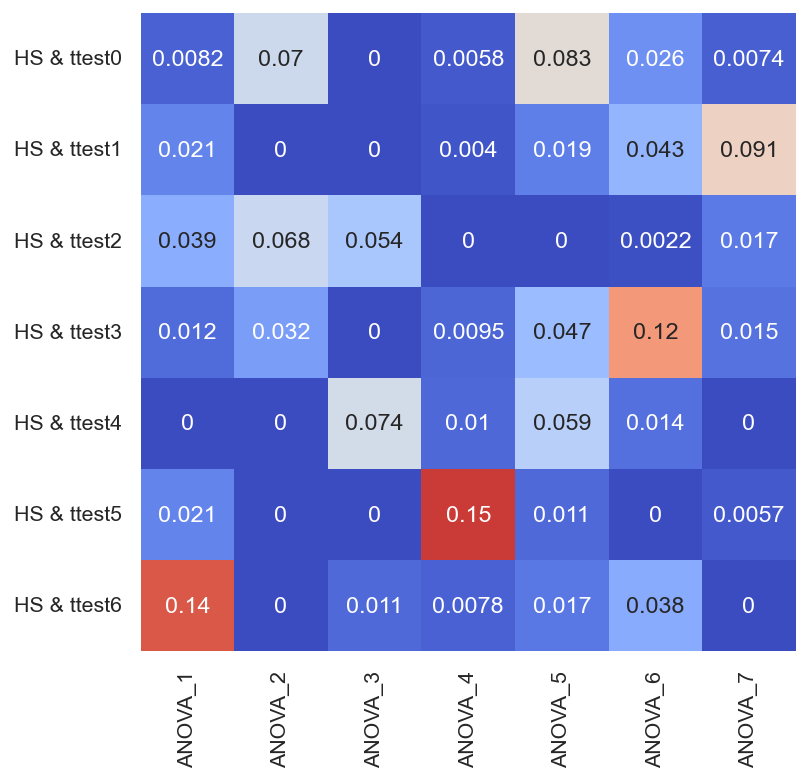

In [147]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, anova_dummies.columns], annot=True, cmap = 'coolwarm', center=0.08, cbar=False)
plt.grid(False)

In [148]:
gene_inter = labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,4.0,10.0,18.0,6.0,0.0,10.0,61.0
2,33.0,0.0,31.0,16.0,0.0,0.0,0.0
3,0.0,0.0,22.0,0.0,29.0,0.0,5.0
4,3.0,2.0,0.0,5.0,5.0,66.0,4.0
5,42.0,10.0,0.0,25.0,29.0,6.0,9.0
6,12.0,19.0,1.0,52.0,6.0,0.0,17.0
7,4.0,44.0,9.0,8.0,0.0,3.0,0.0


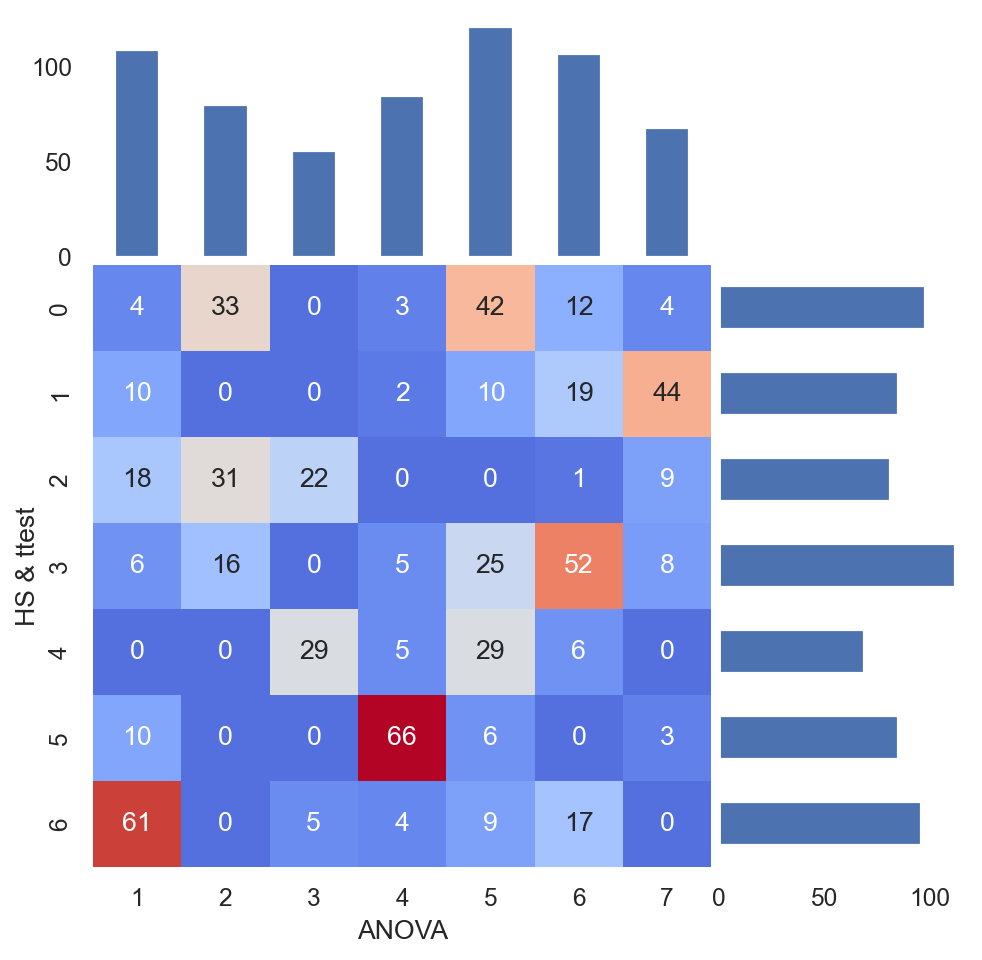

In [149]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [150]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
JAKMIP1,1,0,0,0,0,0,0
HMGCL,1,0,0,0,0,0,0
CACNG3,1,0,0,0,0,0,0
RTN4RL2,1,0,0,0,0,0,0
TOX2,1,0,0,0,0,0,0


In [151]:
hs_ttest_dummies = labels.astype(str).str.get_dummies()
hs_ttest_dummies.columns = 'HS & ttest' + hs_ttest_dummies.columns
hs_ttest_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
SPHKAP,1,0,0,0,0,0,0
SLC27A5,1,0,0,0,0,0,0
CELF1,1,0,0,0,0,0,0
SLC2A13,1,0,0,0,0,0,0
PANX1,1,0,0,0,0,0,0


In [152]:
dummie_concat = pd.concat([hs_dummies, hs_ttest_dummies], axis=1).fillna(0)
dummie_concat.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
JAKMIP1,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
HMGCL,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CACNG3,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RTN4RL2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOX2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


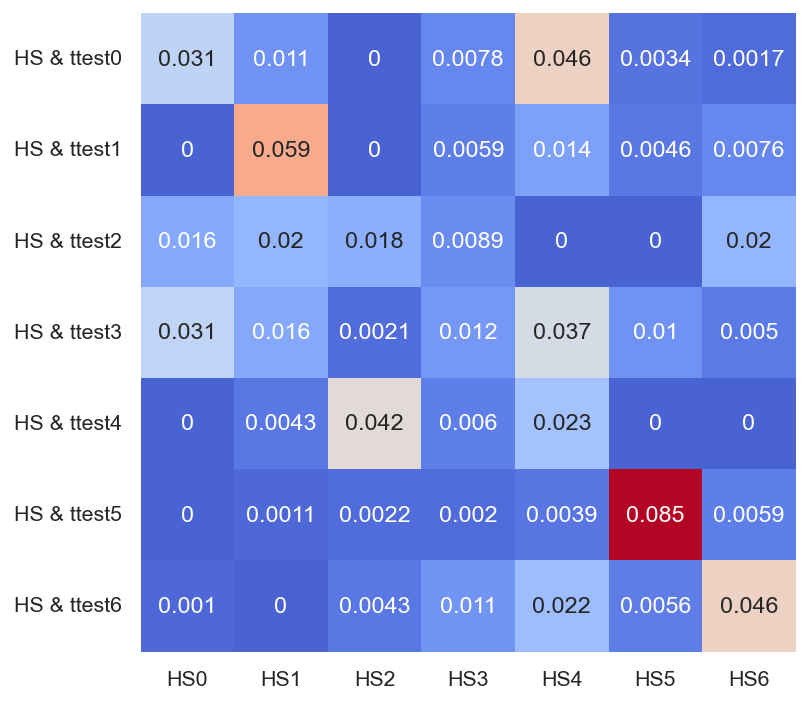

In [153]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_ttest_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.04, cbar=False)
plt.grid(False)

In [154]:
gene_inter = labels.index.intersection(hs_labels.index)
table_to_pivot = pd.concat([hs_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['HS', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('HS').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
HS,,,,,,,
0,29.0,0.0,15.0,30.0,0.0,0.0,1.0
1,10.0,52.0,18.0,15.0,4.0,1.0,0.0
2,0.0,0.0,16.0,2.0,36.0,2.0,4.0
3,8.0,6.0,9.0,12.0,6.0,2.0,11.0
4,46.0,14.0,0.0,38.0,23.0,4.0,22.0
5,3.0,4.0,0.0,9.0,0.0,69.0,5.0
6,2.0,9.0,23.0,6.0,0.0,7.0,53.0


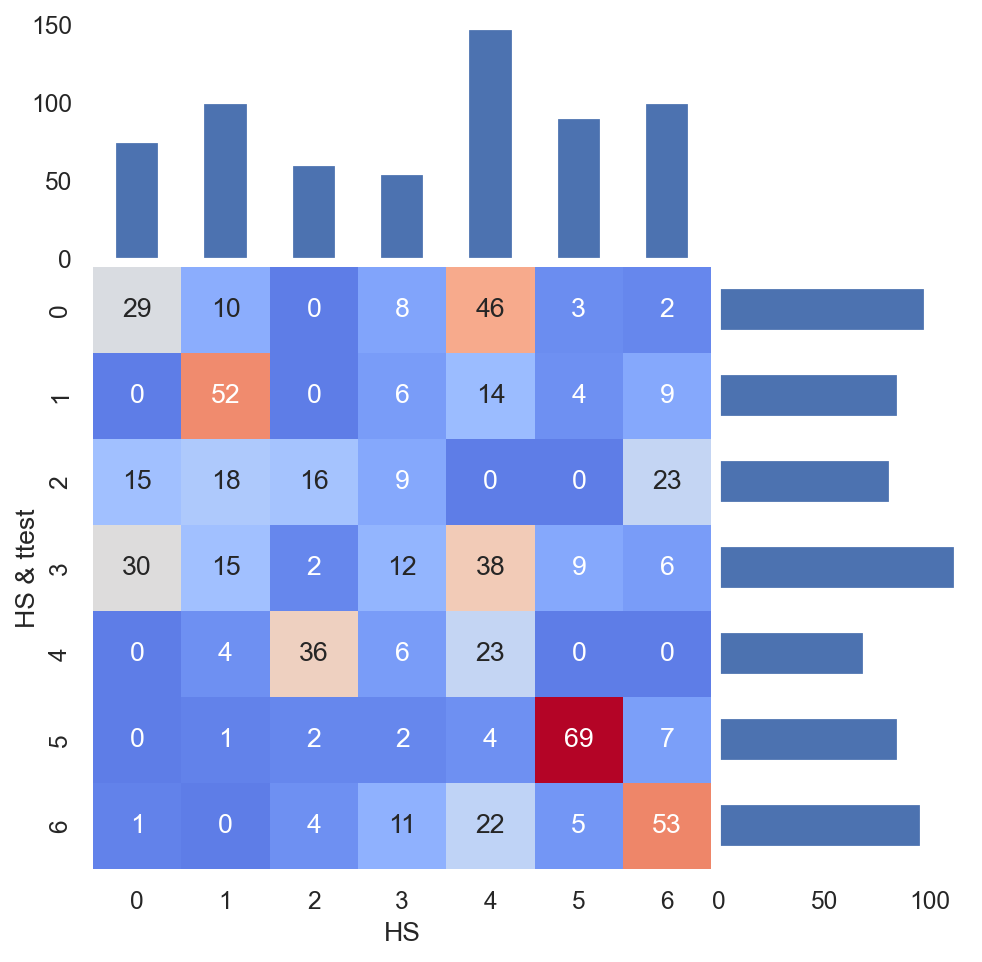

In [155]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

### P-value = 0.05

In [156]:
hum_spec_ttest_inter = hum_spec_onehot.columns.intersection(hc_genes[0.05])
hum_spec_ttest_inter

Index(['AATK', 'ABI3BP', 'ACAP1', 'ACBD6', 'ACTN2', 'ADCY1', 'ADGRB3', 'ADI1',
       'ADRA2A', 'AKAP13',
       ...
       'ZBTB10', 'ZBTB18', 'ZDHHC23', 'ZFAND3', 'ZNF333', 'ZNF341', 'ZNF579',
       'ZNF672', 'ZNF706', 'ZYX'],
      dtype='object', length=277)

### Visualization for layer freq

In [157]:
hum_spec_ttest_onehot = hum_spec_onehot[hum_spec_ttest_inter]

Text(0.5, 1.0, 'Number of human-specific genes for each layer')

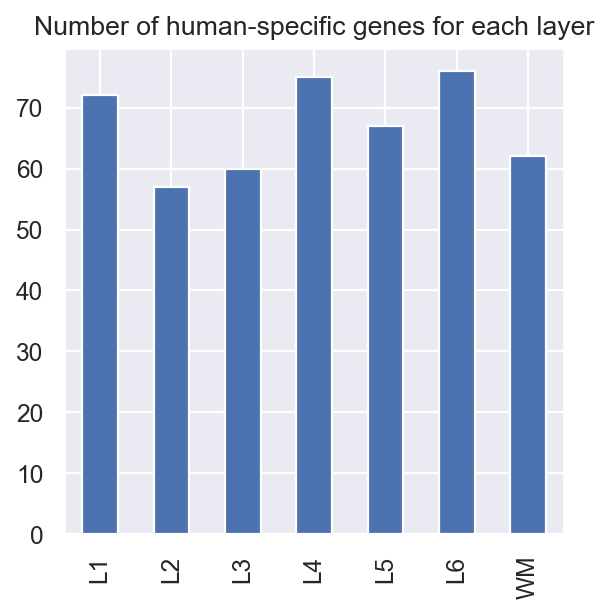

In [158]:
hum_spec_ttest_onehot.sum(axis=1).plot.bar()
plt.title('Number of human-specific genes for each layer')

In [159]:
from itertools import combinations
count_df = pd.DataFrame(columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
for lay1, lay2 in combinations(layers, 2):
    count_num = (hum_spec_ttest_onehot.loc[lay1] * hum_spec_ttest_onehot.loc[lay2]).sum()
    count_df.loc[[lay1, lay2], [lay1, lay2]] = count_num
    count_df.loc[lay1, lay1] = hum_spec_ttest_onehot.loc[lay1].sum()
    count_df.loc[lay2, lay2] = hum_spec_ttest_onehot.loc[lay2].sum()
count_df = count_df.astype(int)
count_df

,L1,L2,L3,L4,L5,L6,WM
L1,72,12,11,15,18,20,10
L2,12,57,7,15,14,16,10
L3,11,7,60,9,13,15,15
L4,15,15,9,75,19,15,16
L5,18,14,13,19,67,18,10
L6,20,16,15,15,18,76,12
WM,10,10,15,16,10,12,62


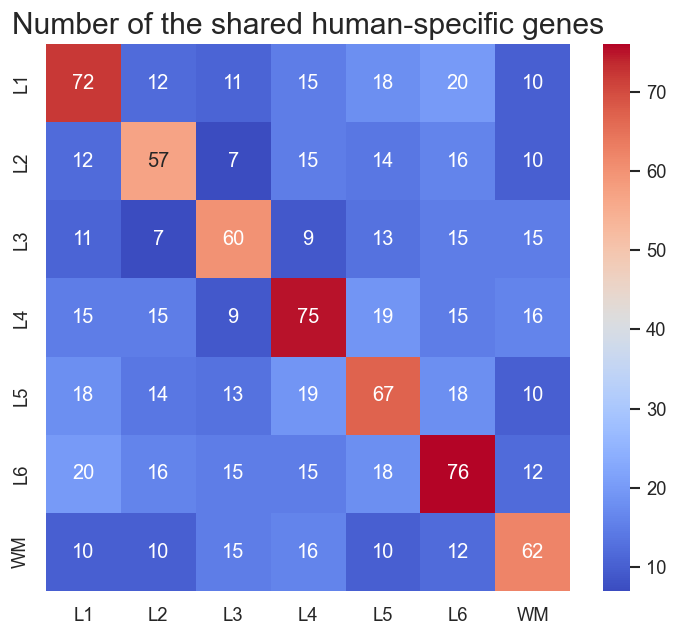

In [160]:
plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.title('Number of the shared human-specific genes', fontsize=18)
plt.grid(False)

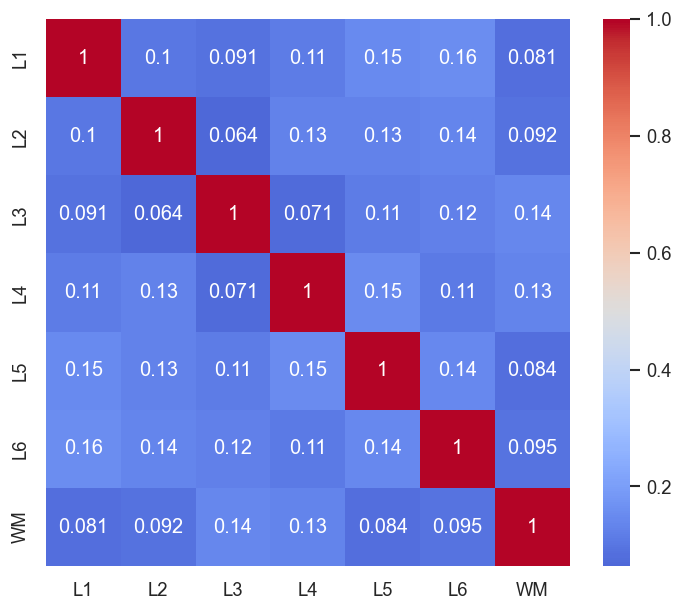

In [161]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(hum_spec_ttest_onehot), columns=hum_spec_ttest_onehot.index, index=hum_spec_ttest_onehot.index)
pairwise_jaccard

plt.figure(figsize=(7, 6), dpi=60)
sns.heatmap(pairwise_jaccard, annot=True, cmap = 'coolwarm', center=0.5)
plt.grid(False)

### ANOVA clusters visualization

In [162]:
pivot_labels = anova_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='ANOVA_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,6,7
ANOVA_labels,,,,,,
1,33,18,7,0,0,1
2,14,8,7,2,1,0
3,12,11,2,0,0,0
4,15,7,5,1,1,0
5,26,14,5,2,0,0
6,27,21,5,0,0,0
7,19,10,2,0,0,1


In [163]:
pivot_labels_fraction = pivot_labels / anova_labels.value_counts().sort_index().values.reshape(7, 1)

(0.0, 0.4)

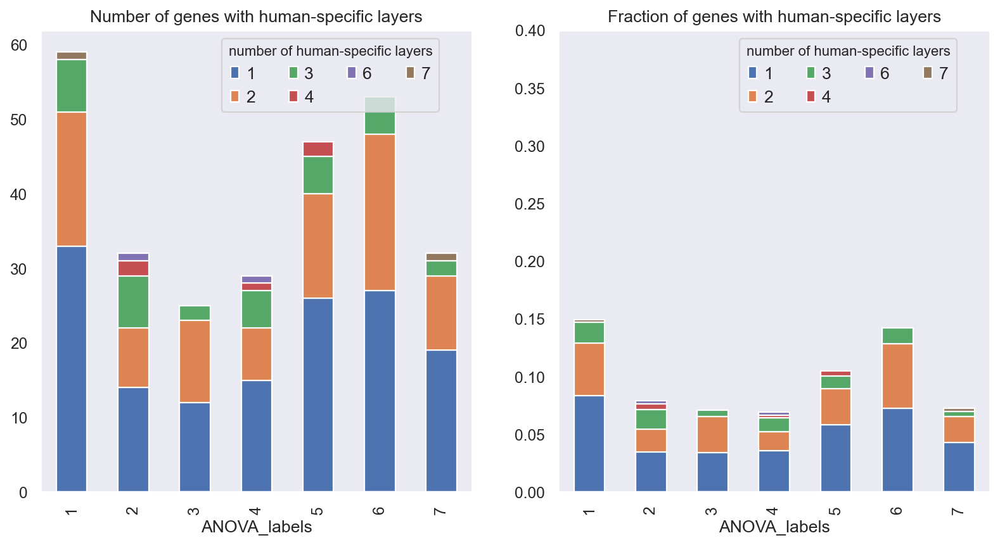

In [164]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[0], stacked=True)
ax[0].set_title('Number of genes with human-specific layers')
ax[0].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[0].grid(False)

pivot_labels_fraction.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Fraction of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)
ax[1].set_ylim(0, 0.4)

In [165]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['ANOVA cluster'] = anova_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['ANOVA cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
ANOVA cluster,,,,,,,
1,13,14,12,16,13,15,14
2,10,5,11,7,11,12,9
3,4,3,7,5,7,4,10
4,7,8,6,7,8,11,7
5,20,7,6,12,13,16,3
6,11,11,11,19,10,14,8
7,7,9,7,9,5,4,11


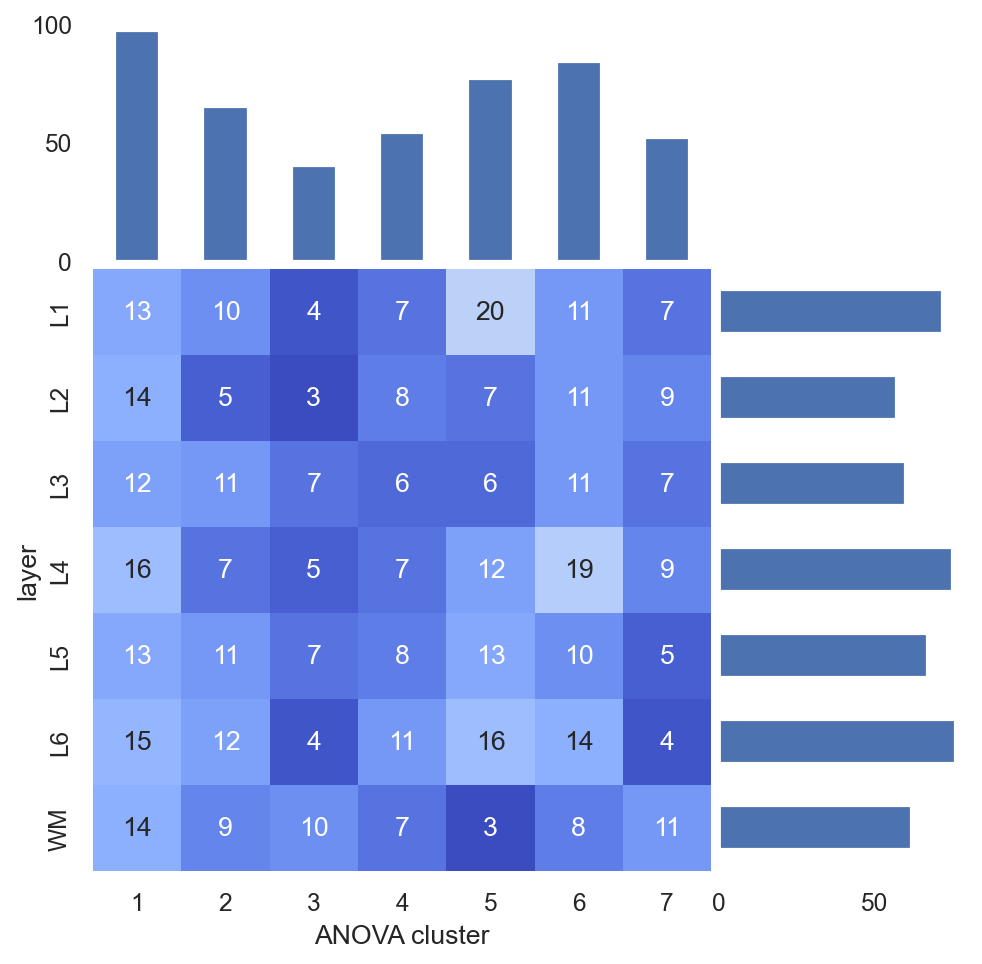

In [166]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

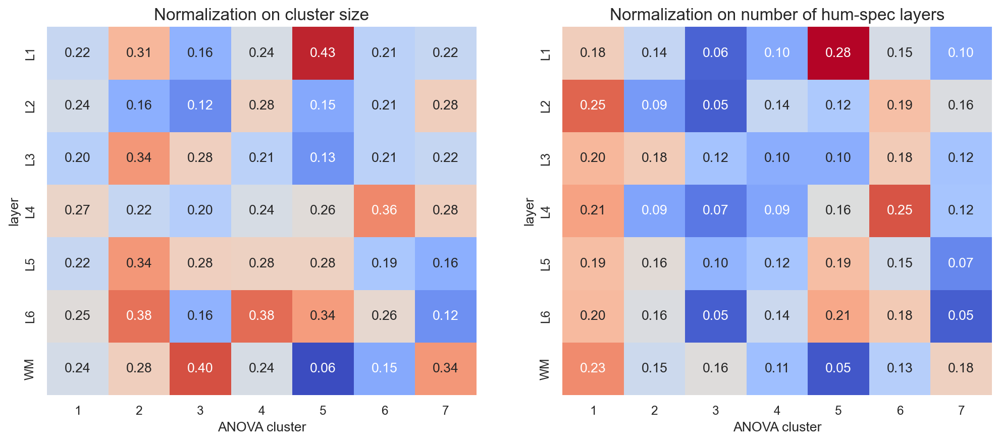

In [167]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

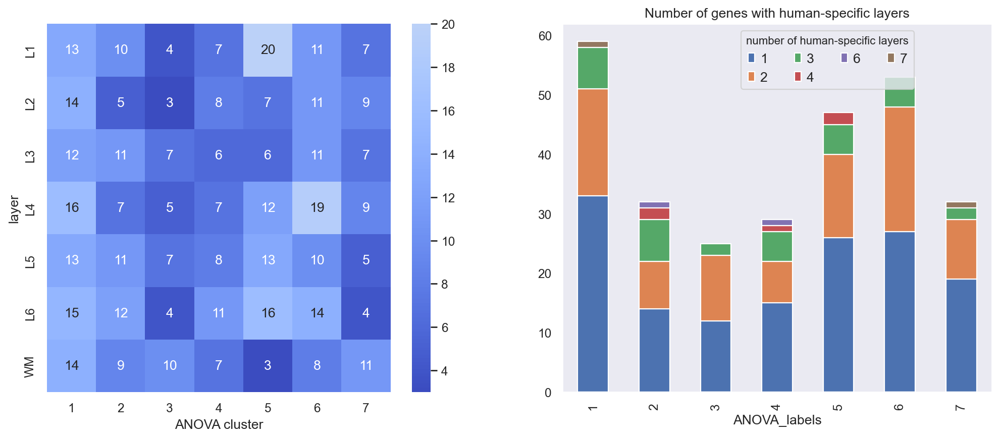

In [168]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [169]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [170]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK    ABI3BP     ACAP1     ACBD6     ACTN2  ADCY1  \
condition layer                                                            
chimp     L1    -0.539509  0.121710 -0.446778 -0.158668 -0.188512    0.0   
          L2    -1.150563 -1.142022 -0.808796  1.496868  0.808020    0.0   
          L3     0.164686 -0.242678  0.179863 -0.285135  1.410957    0.0   
          L4     0.145362 -0.656526  0.918027 -0.665936 -0.017920    0.0   
          L5     0.883652 -0.564811  0.304401 -0.639077 -0.505067    0.0   

                   ADGRB3      ADI1  ADRA2A    AKAP13  ...    ZBTB10  \
condition layer                                        ...             
chimp     L1     1.803627  1.816050     0.0  1.631677  ...  1.993941   
          L2    -0.395117 -0.242480     0.0  0.190807  ... -0.515403   
          L3    -0.178409 -0.754483     0.0 -0.665184  ... -0.044317   
          L4    -0.378734 -0.473983     0.0 -0.753010  ...  0.057801   
          L5    -0.652525 -0.478245     0.0 -0.518005  ... -0.713329   

                   ZBTB18   ZDHHC23    ZFAND3  ZNF333    ZNF341    ZNF579  \
condition layer                                                             
chimp     L1    -0.598878 -0.251976  0.773880     0.0 -1.010875 -0.807146   
          L2     1.105448 -0.251976  0.416082     0.0  0.252432 -0.023190   
          L3     0.813398  0.472456 -0.661515     0.0  0.022365  0.859209   
          L4     0.590885 -0.188982 -0.124473     0.0  0.517762 -0.529854   
          L5     0.089690 -0.188982 -0.184180     0.0  0.354078  0.223835   

                 ZNF672    ZNF706       ZYX  
condition layer                              
chimp     L1        0.0  0.254733  0.252614  
          L2        0.0  1.471642 -0.645583  
          L3        0.0  0.806847  0.367243  
          L4        0.0  0.056175  0.850038  
          L5        0.0 -0.455261 -0.293464  

[5 rows x 277 columns]

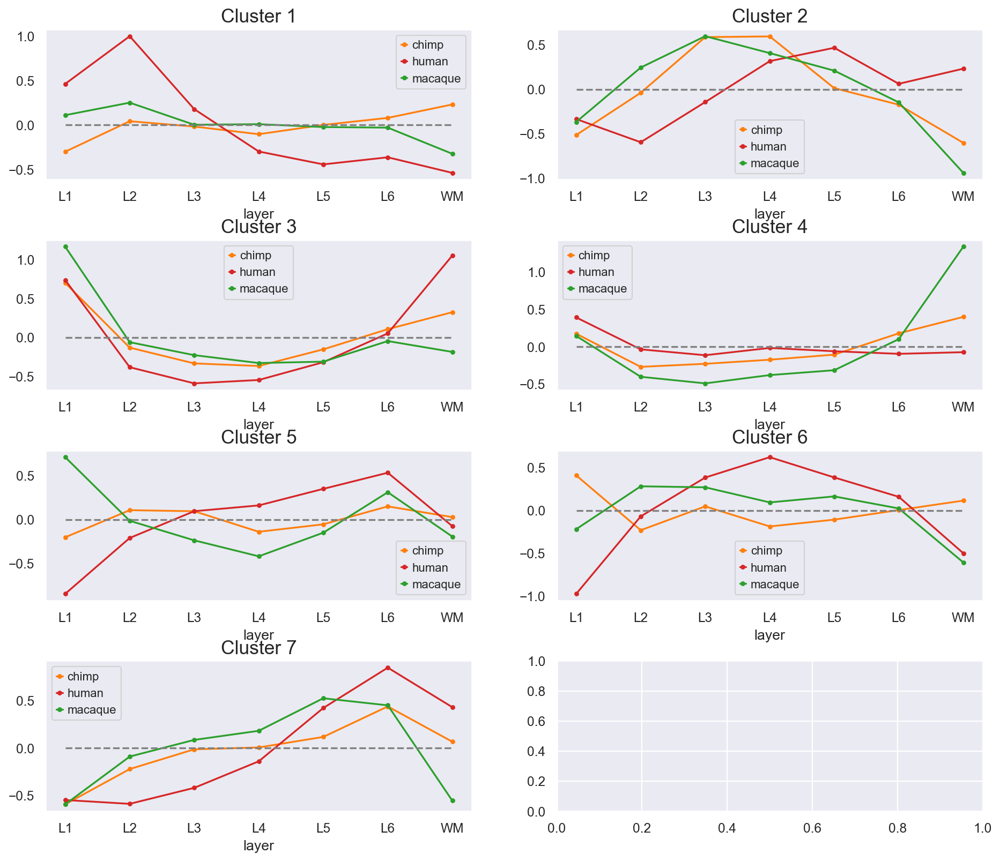

In [171]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(anova_labels.unique(), axes.flatten()):
    genes = anova_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Human-specific clusters visualization

In [172]:
hs_labels.name = 'HS_labels'
pivot_labels = hs_labels.loc[hum_spec_ttest_inter].to_frame()
pivot_labels['count'] = hum_spec_ttest_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS_labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,6,7
HS_labels,,,,,,
0,14,13,6,1,1,0
1,26,13,4,1,0,1
2,13,9,3,0,0,0
3,12,8,1,0,0,0
4,33,23,7,2,0,0
5,16,8,6,1,1,0
6,32,15,6,0,0,1


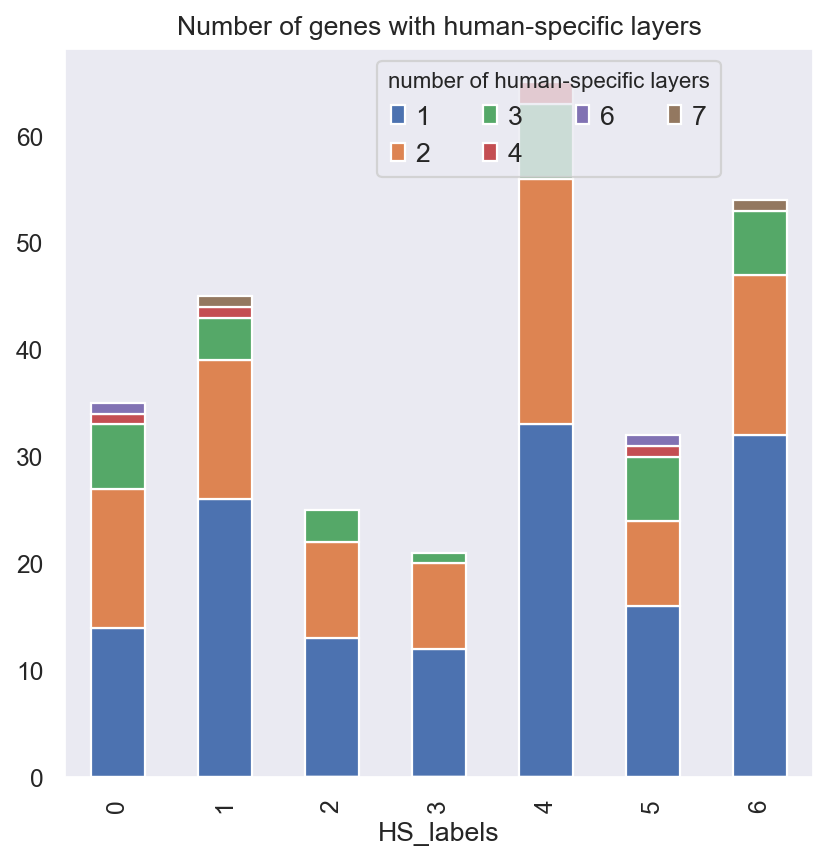

In [173]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [174]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS cluster'] = hs_labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS cluster,,,,,,,
0,13,7,8,9,12,11,8
1,9,13,12,11,7,10,13
2,5,4,3,5,5,8,10
3,4,6,4,6,2,3,6
4,21,9,15,22,19,19,3
5,8,9,9,4,8,11,11
6,12,9,9,18,14,14,11


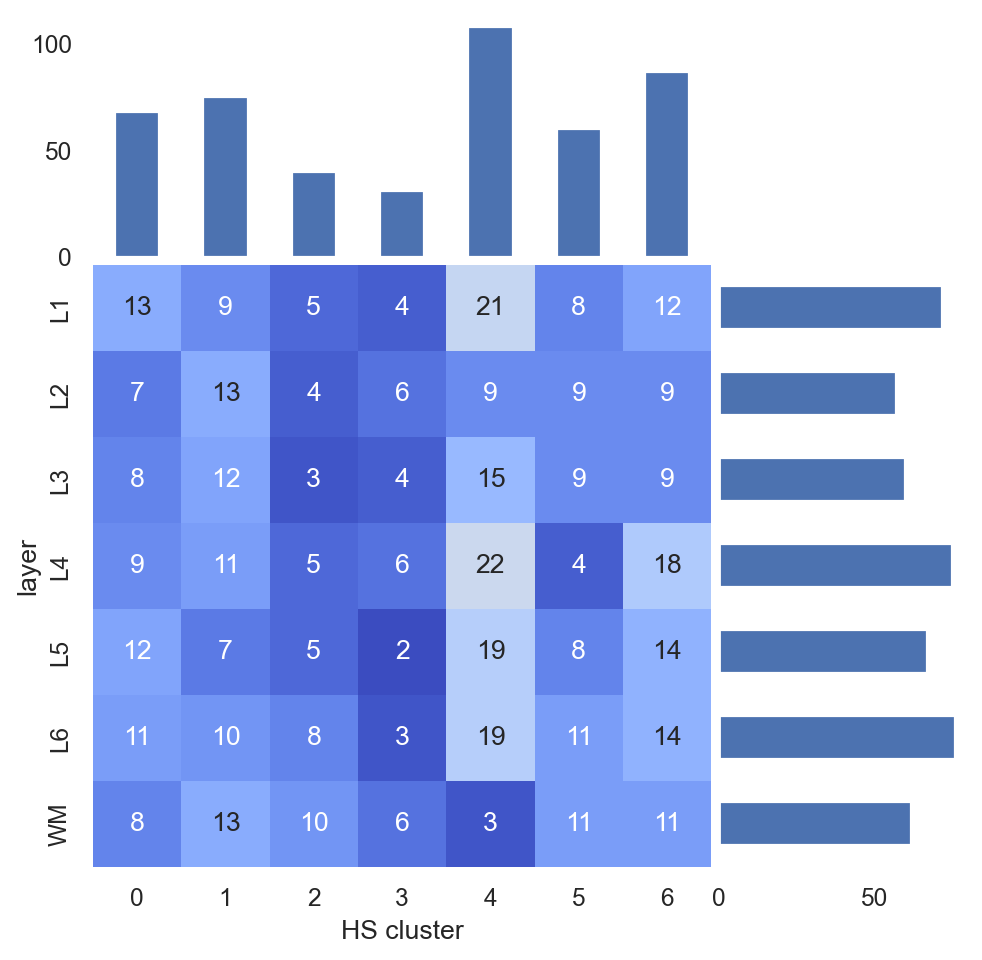

In [175]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

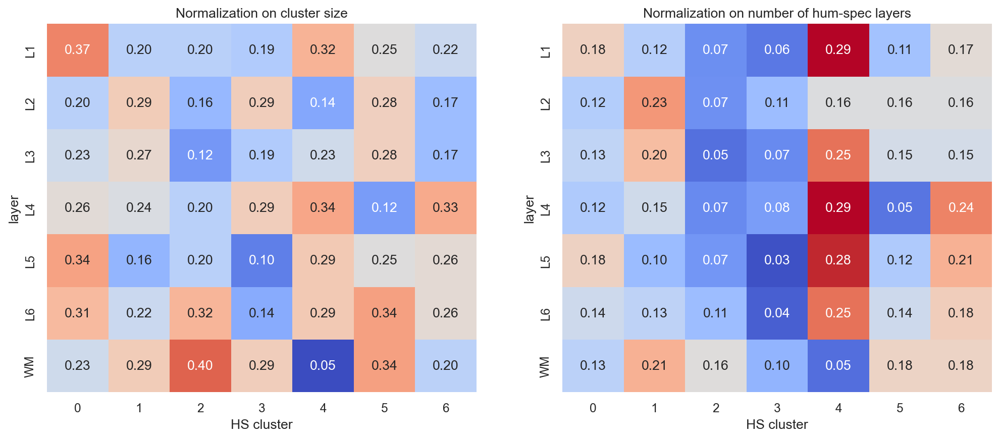

In [176]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size')

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers')
plt.show()

<Axes: xlabel='HS_labels'>

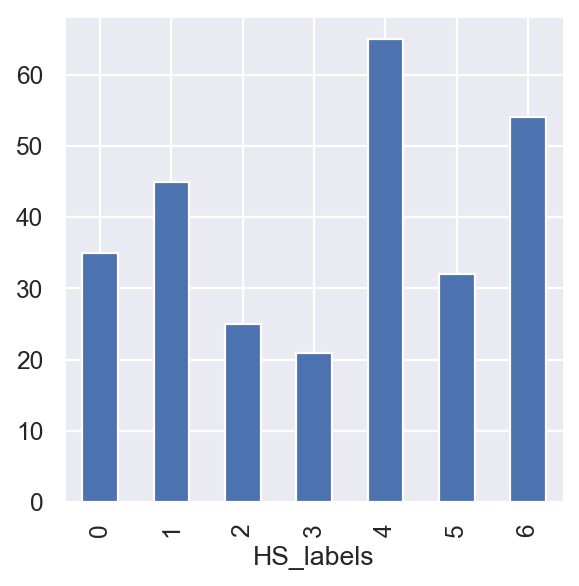

In [177]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

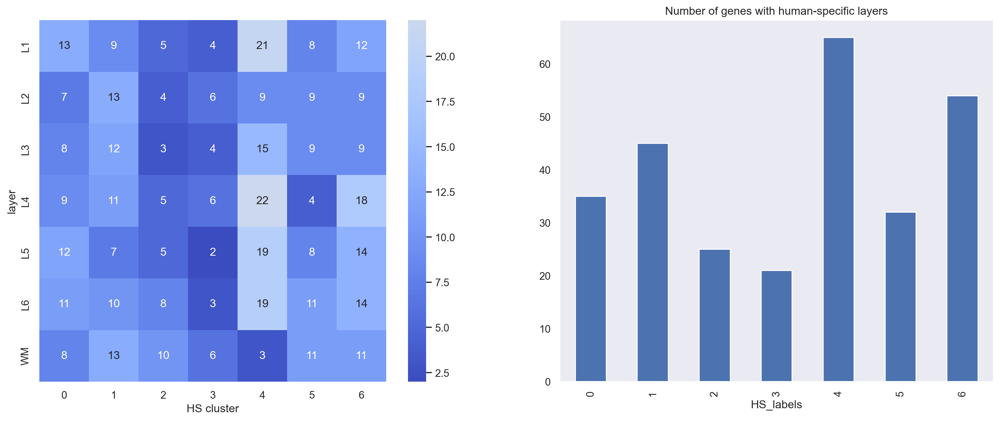

In [178]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7), dpi=120)
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax[0])

sns.set(font_scale=1)
pivot_labels.sum(axis=1).plot.bar(ax=ax[1], stacked=True)
ax[1].set_title('Number of genes with human-specific layers')
#ax[1].legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax[1].grid(False)

In [179]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [180]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK    ABI3BP     ACAP1     ACBD6     ACTN2  ADCY1  \
condition layer                                                            
chimp     L1    -0.539509  0.121710 -0.446778 -0.158668 -0.188512    0.0   
          L2    -1.150563 -1.142022 -0.808796  1.496868  0.808020    0.0   
          L3     0.164686 -0.242678  0.179863 -0.285135  1.410957    0.0   
          L4     0.145362 -0.656526  0.918027 -0.665936 -0.017920    0.0   
          L5     0.883652 -0.564811  0.304401 -0.639077 -0.505067    0.0   

                   ADGRB3      ADI1  ADRA2A    AKAP13  ...    ZBTB10  \
condition layer                                        ...             
chimp     L1     1.803627  1.816050     0.0  1.631677  ...  1.993941   
          L2    -0.395117 -0.242480     0.0  0.190807  ... -0.515403   
          L3    -0.178409 -0.754483     0.0 -0.665184  ... -0.044317   
          L4    -0.378734 -0.473983     0.0 -0.753010  ...  0.057801   
          L5    -0.652525 -0.478245     0.0 -0.518005  ... -0.713329   

                   ZBTB18   ZDHHC23    ZFAND3  ZNF333    ZNF341    ZNF579  \
condition layer                                                             
chimp     L1    -0.598878 -0.251976  0.773880     0.0 -1.010875 -0.807146   
          L2     1.105448 -0.251976  0.416082     0.0  0.252432 -0.023190   
          L3     0.813398  0.472456 -0.661515     0.0  0.022365  0.859209   
          L4     0.590885 -0.188982 -0.124473     0.0  0.517762 -0.529854   
          L5     0.089690 -0.188982 -0.184180     0.0  0.354078  0.223835   

                 ZNF672    ZNF706       ZYX  
condition layer                              
chimp     L1        0.0  0.254733  0.252614  
          L2        0.0  1.471642 -0.645583  
          L3        0.0  0.806847  0.367243  
          L4        0.0  0.056175  0.850038  
          L5        0.0 -0.455261 -0.293464  

[5 rows x 277 columns]

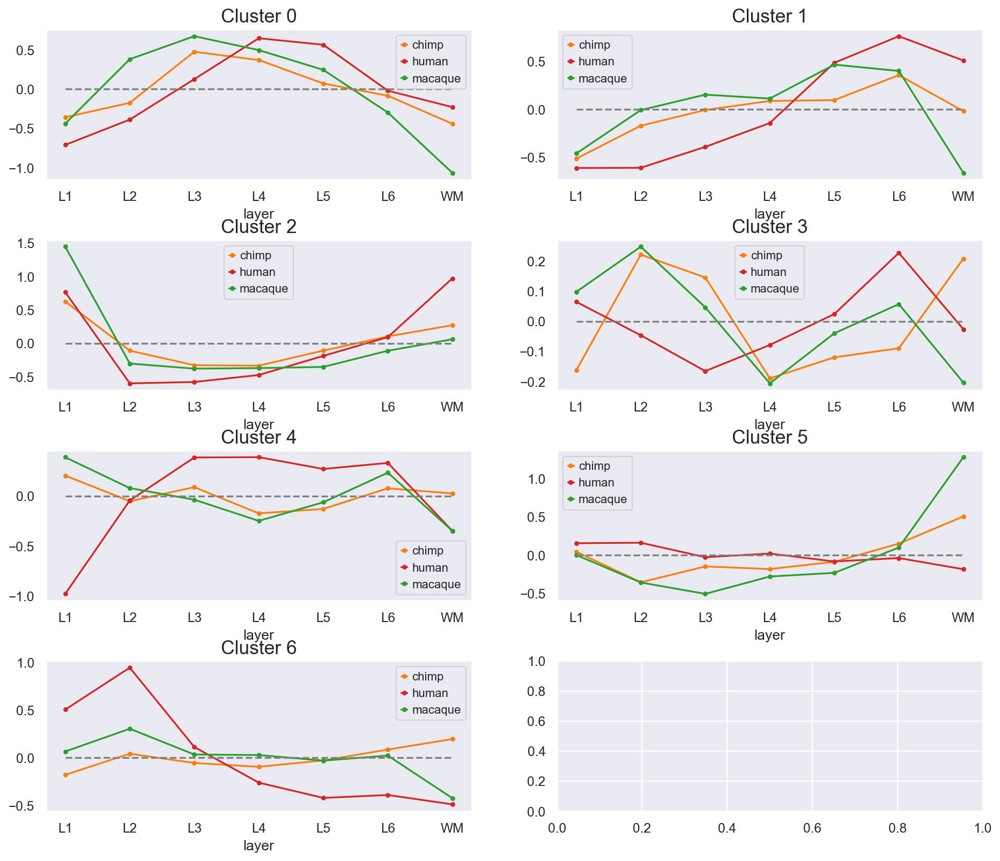

In [181]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(hs_labels.unique(), axes.flatten()):
    genes = hs_labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'hs_clusters.png', bbox_inches='tight')

## Clusterization of ttest sign and  hum-spec genes

### Hierarchial

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


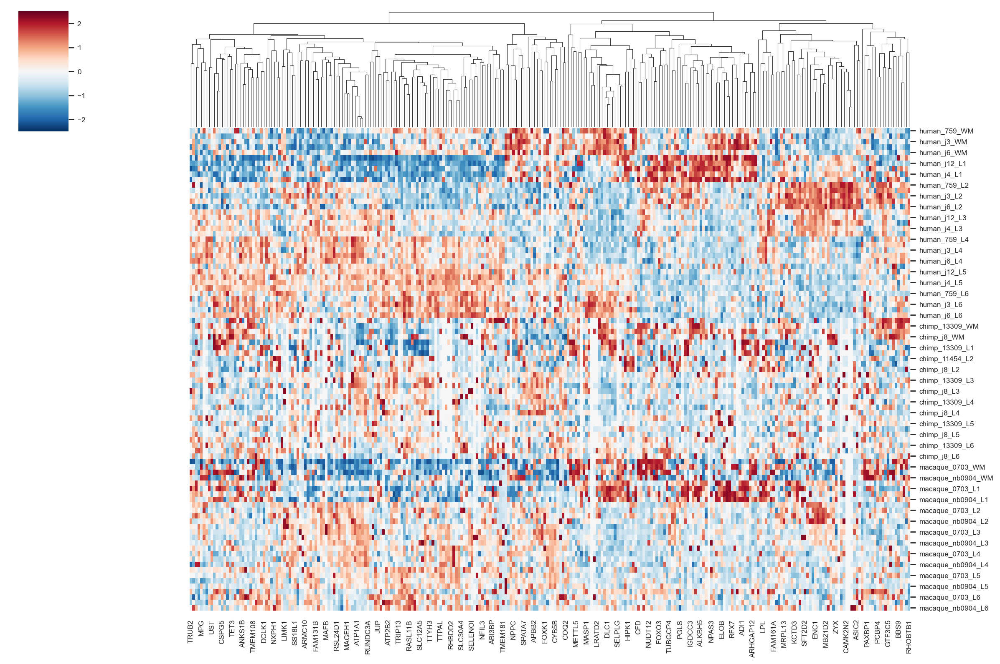

In [182]:
sns.set(font_scale=0.7)
sns.clustermap(df[hum_spec_ttest_inter], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

### Spectral

In [183]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hum_spec_ttest_inter].T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [184]:
labels = pd.Series(clustering.labels_, index=hum_spec_ttest_inter).sort_values()
order = labels.sort_values().index

<Axes: >

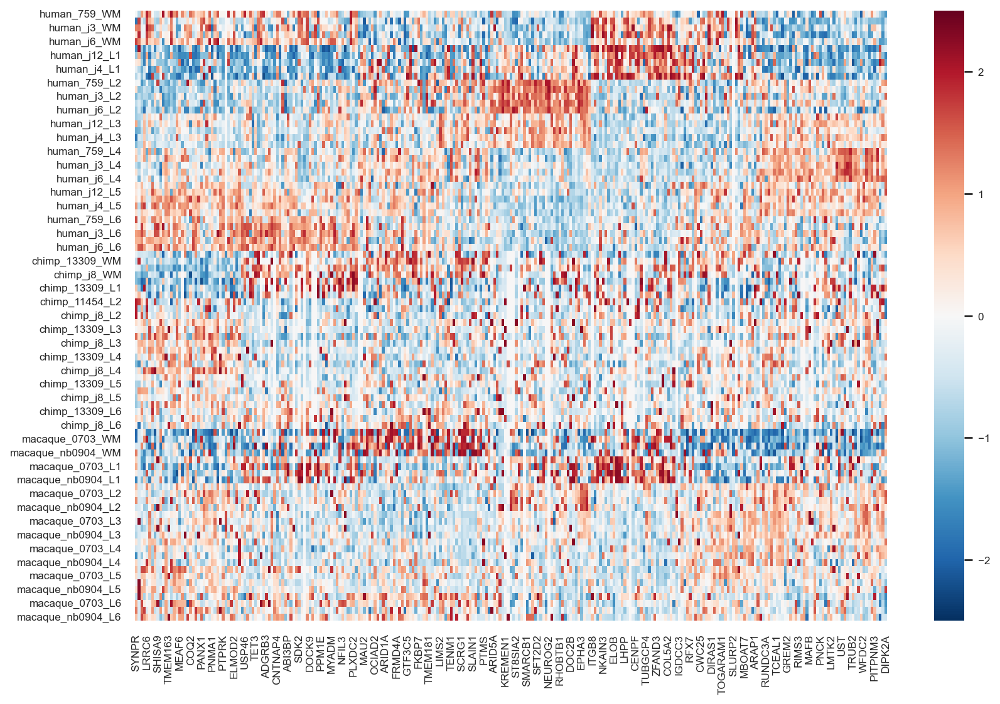

In [185]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
#plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

In [186]:
sns.set(font_scale=1)

### Profiles

In [187]:
df_annotation = df[hum_spec_ttest_inter].copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [188]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK    ABI3BP     ACAP1     ACBD6     ACTN2  ADCY1  \
condition layer                                                            
chimp     L1    -0.539509  0.121710 -0.446778 -0.158668 -0.188512    0.0   
          L2    -1.150563 -1.142022 -0.808796  1.496868  0.808020    0.0   
          L3     0.164686 -0.242678  0.179863 -0.285135  1.410957    0.0   
          L4     0.145362 -0.656526  0.918027 -0.665936 -0.017920    0.0   
          L5     0.883652 -0.564811  0.304401 -0.639077 -0.505067    0.0   

                   ADGRB3      ADI1  ADRA2A    AKAP13  ...    ZBTB10  \
condition layer                                        ...             
chimp     L1     1.803627  1.816050     0.0  1.631677  ...  1.993941   
          L2    -0.395117 -0.242480     0.0  0.190807  ... -0.515403   
          L3    -0.178409 -0.754483     0.0 -0.665184  ... -0.044317   
          L4    -0.378734 -0.473983     0.0 -0.753010  ...  0.057801   
          L5    -0.652525 -0.478245     0.0 -0.518005  ... -0.713329   

                   ZBTB18   ZDHHC23    ZFAND3  ZNF333    ZNF341    ZNF579  \
condition layer                                                             
chimp     L1    -0.598878 -0.251976  0.773880     0.0 -1.010875 -0.807146   
          L2     1.105448 -0.251976  0.416082     0.0  0.252432 -0.023190   
          L3     0.813398  0.472456 -0.661515     0.0  0.022365  0.859209   
          L4     0.590885 -0.188982 -0.124473     0.0  0.517762 -0.529854   
          L5     0.089690 -0.188982 -0.184180     0.0  0.354078  0.223835   

                 ZNF672    ZNF706       ZYX  
condition layer                              
chimp     L1        0.0  0.254733  0.252614  
          L2        0.0  1.471642 -0.645583  
          L3        0.0  0.806847  0.367243  
          L4        0.0  0.056175  0.850038  
          L5        0.0 -0.455261 -0.293464  

[5 rows x 277 columns]

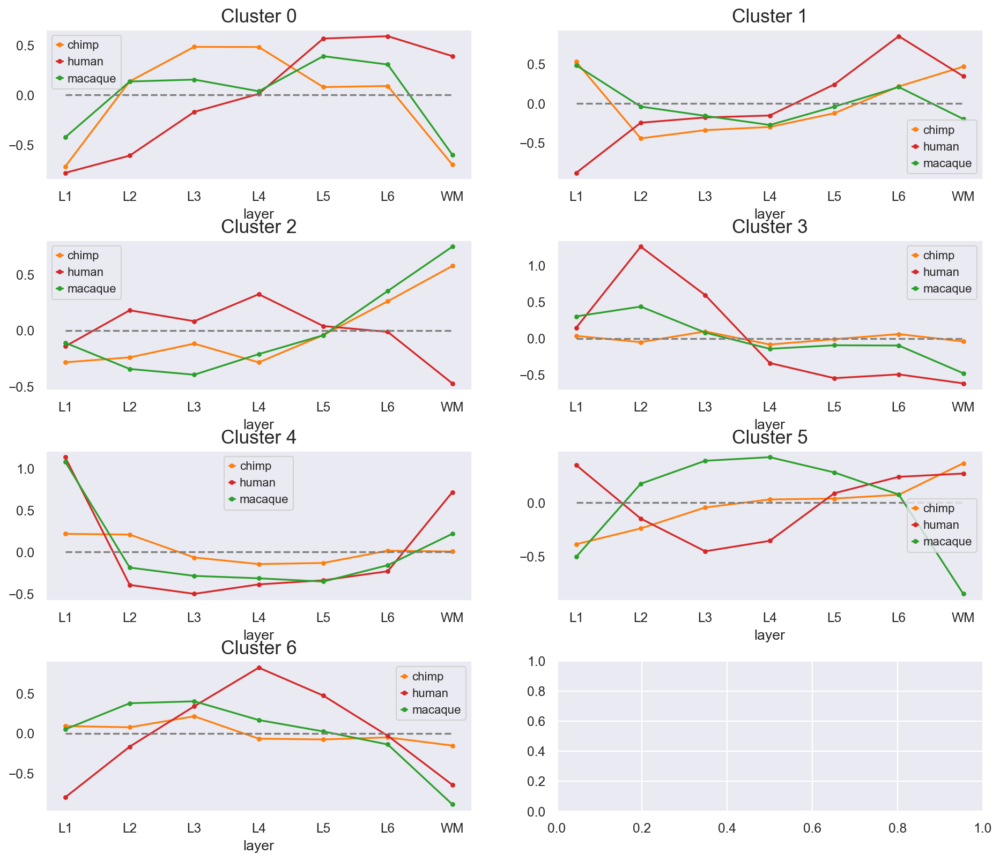

In [189]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels.loc[hum_spec_ttest_inter]
    genes = genes[genes == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'hs_clusters.png', bbox_inches='tight')

### Describe clusters

In [190]:
labels.name = 'HS & ttest labels'
pivot_labels = labels.to_frame()
pivot_labels['count'] = hum_spec_anova_onehot.sum()
pivot_labels['gene_name'] = pivot_labels.index
pivot_labels = pd.pivot_table(pivot_labels, values='gene_name', index='HS & ttest labels', columns='count', aggfunc='count', fill_value=0)
pivot_labels

count,1,2,3,4,6,7
HS & ttest labels,,,,,,
0,23,10,5,1,0,0
1,20,16,6,0,0,1
2,21,17,9,1,1,0
3,20,11,5,0,0,1
4,21,7,2,1,0,0
5,19,10,0,1,0,0
6,22,18,6,1,1,0


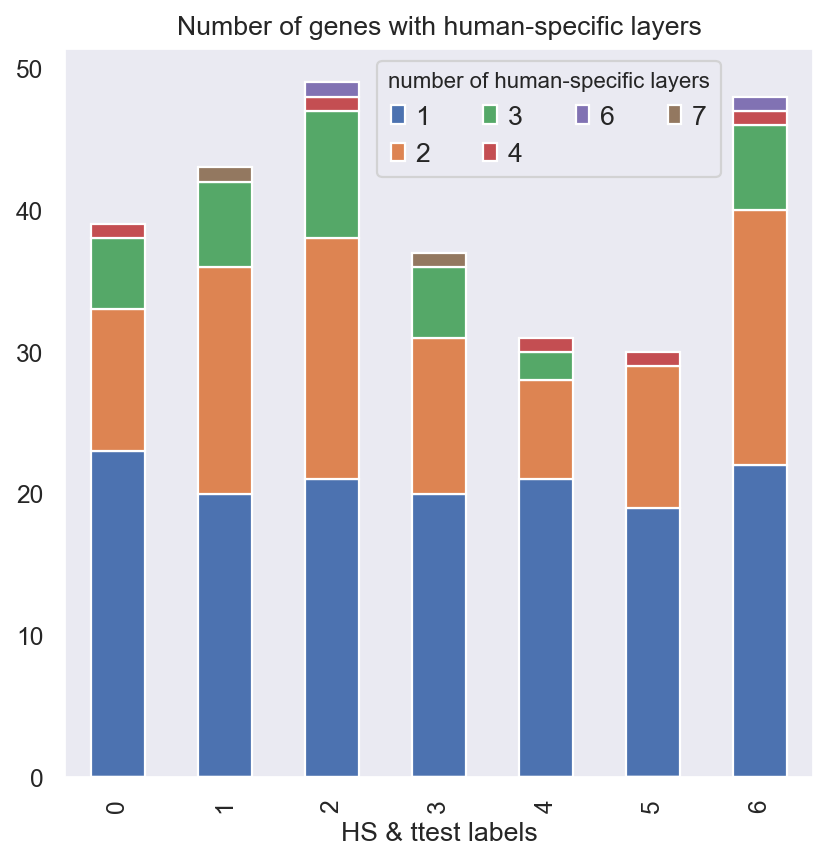

In [191]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sns.set(font_scale=1)
pivot_labels.plot.bar(ax=ax, stacked=True)
ax.set_title('Number of genes with human-specific layers')
ax.legend(loc='upper left', bbox_to_anchor=(0.4, 1), ncol=4, fontsize=12, title='number of human-specific layers', title_fontsize='small')
ax.grid(False)

In [192]:
onehot_unstack = hum_spec_ttest_onehot.unstack()
onehot_unstack.name = 'hum-spec & ttest'
onehot_unstack = onehot_unstack.to_frame()
onehot_unstack.index.names = ['gene', 'layer']
onehot_unstack.index.get_level_values('gene')
onehot_unstack.reset_index(level=1, inplace=True)
onehot_unstack['HS & ttest cluster'] = labels.loc[onehot_unstack.index]
layer_count = onehot_unstack[onehot_unstack['hum-spec & ttest'] == 1].groupby(['HS & ttest cluster', 'layer']).count().unstack()
layer_count = layer_count['hum-spec & ttest']
layer_count

layer,L1,L2,L3,L4,L5,L6,WM
HS & ttest cluster,,,,,,,
0,12,11,6,6,8,9,10
1,16,9,9,10,11,13,9
2,12,13,11,14,12,16,14
3,9,8,9,11,7,10,10
4,5,5,3,10,5,10,7
5,4,4,12,6,7,4,6
6,14,7,10,18,17,14,6


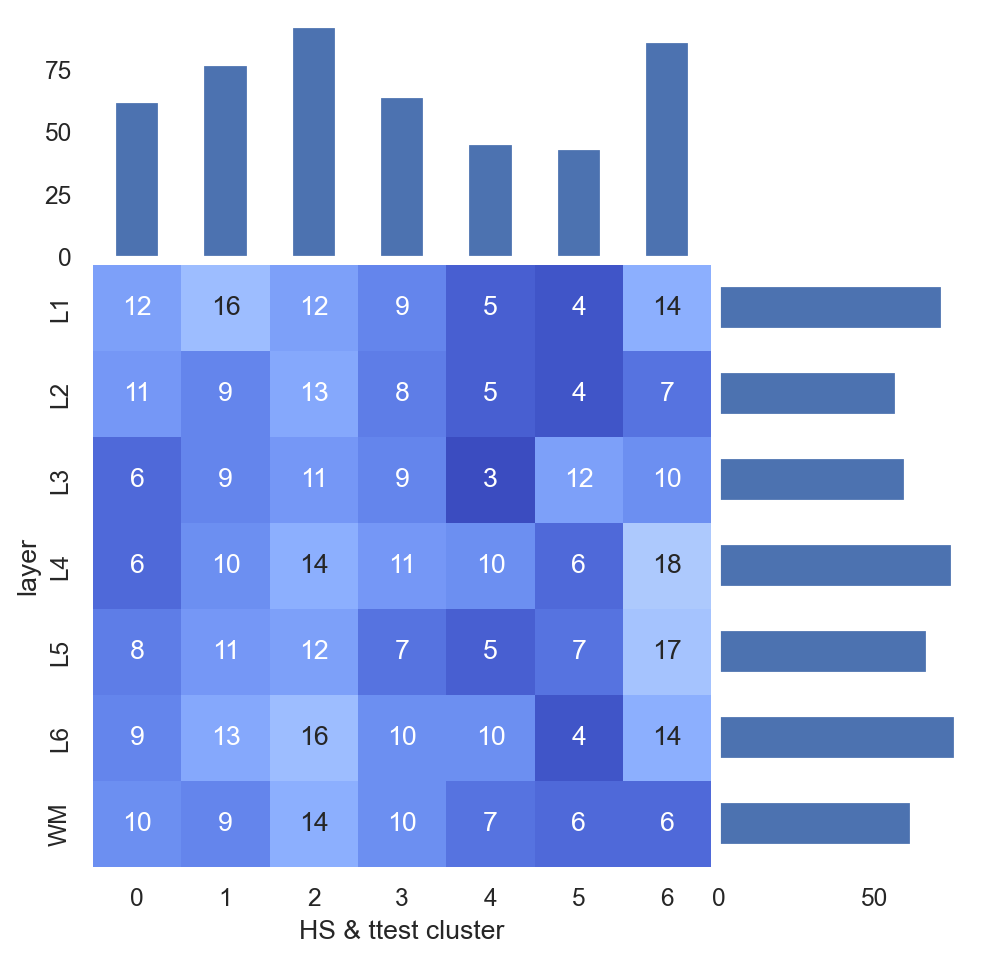

In [193]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(layer_count.T, annot=True, cmap = 'coolwarm', center=25, fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
layer_count.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = layer_count.columns[::-1]
layer_count.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

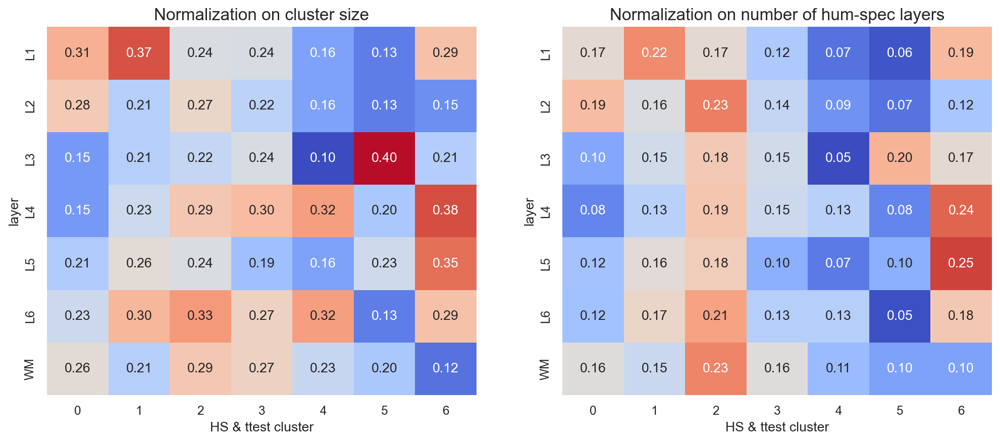

In [194]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
frac = layer_count / pivot_labels.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac.T, annot=True, cmap = 'coolwarm', center=0.25, fmt=".2f", ax=ax[0], cbar=False)
ax[0].set_title('Normalization on cluster size', fontsize=15)

frac = layer_count.T / hum_spec_ttest_onehot.sum(axis=1).values.reshape(7, 1)
sns.heatmap(frac, annot=True, cmap = 'coolwarm', center=0.16, fmt=".2f", ax=ax[1], cbar=False)
ax[1].set_title('Normalization on number of hum-spec layers', fontsize=15)
plt.show()

<Axes: xlabel='HS & ttest labels'>

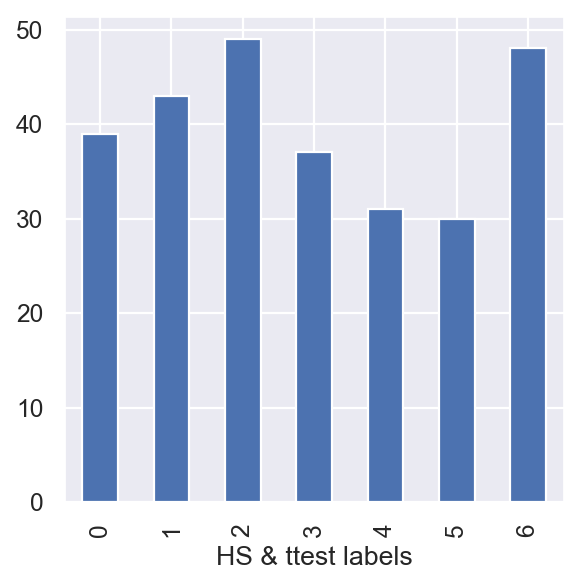

In [195]:
pivot_labels.sum(axis=1).plot.bar(stacked=True)

In [196]:
anova_dummies = anova_labels.astype(str).str.get_dummies()
anova_dummies.columns = 'ANOVA_' + anova_dummies.columns
anova_dummies.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7
ZYX,1,0,0,0,0,0,0
TOP2B,1,0,0,0,0,0,0
TOPORS,1,0,0,0,0,0,0
TOR2A,1,0,0,0,0,0,0
ARL15,1,0,0,0,0,0,0


In [197]:
hs_anova_dummies = labels.astype(str).str.get_dummies()
hs_anova_dummies.columns = 'HS & ttest' + hs_anova_dummies.columns
hs_anova_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
SYNPR,1,0,0,0,0,0,0
ATP2B2,1,0,0,0,0,0,0
KCNJ4,1,0,0,0,0,0,0
PANX1,1,0,0,0,0,0,0
FHL2,1,0,0,0,0,0,0


In [198]:
dummie_concat = pd.concat([anova_dummies, hs_anova_dummies], axis=1).fillna(0)
dummie_concat.head()

,ANOVA_1,ANOVA_2,ANOVA_3,ANOVA_4,ANOVA_5,ANOVA_6,ANOVA_7,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
ZYX,1,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
TOP2B,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOPORS,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOR2A,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ARL15,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


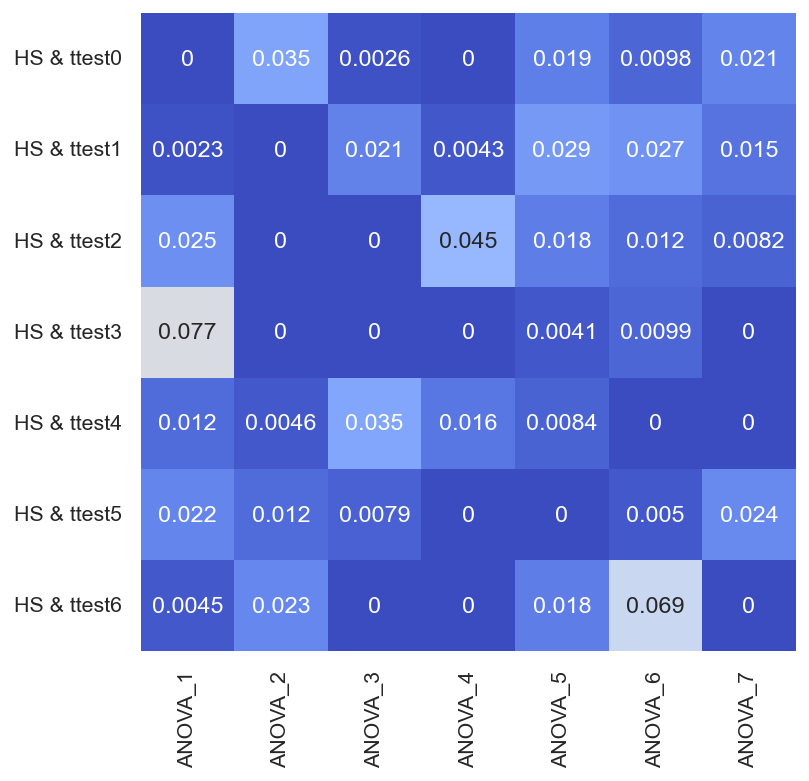

In [199]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_anova_dummies.columns, anova_dummies.columns], annot=True, cmap = 'coolwarm', center=0.08, cbar=False)
plt.grid(False)

In [200]:
gene_inter = labels.index.intersection(anova_labels.index)
table_to_pivot = pd.concat([anova_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['ANOVA', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('ANOVA').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
ANOVA,,,,,,,
1,0.0,1.0,11.0,31.0,5.0,9.0,2.0
2,15.0,0.0,0.0,0.0,2.0,5.0,10.0
3,1.0,8.0,0.0,0.0,13.0,3.0,0.0
4,0.0,2.0,20.0,0.0,7.0,0.0,0.0
5,9.0,14.0,9.0,2.0,4.0,0.0,9.0
6,4.0,11.0,5.0,4.0,0.0,2.0,27.0
7,10.0,7.0,4.0,0.0,0.0,11.0,0.0


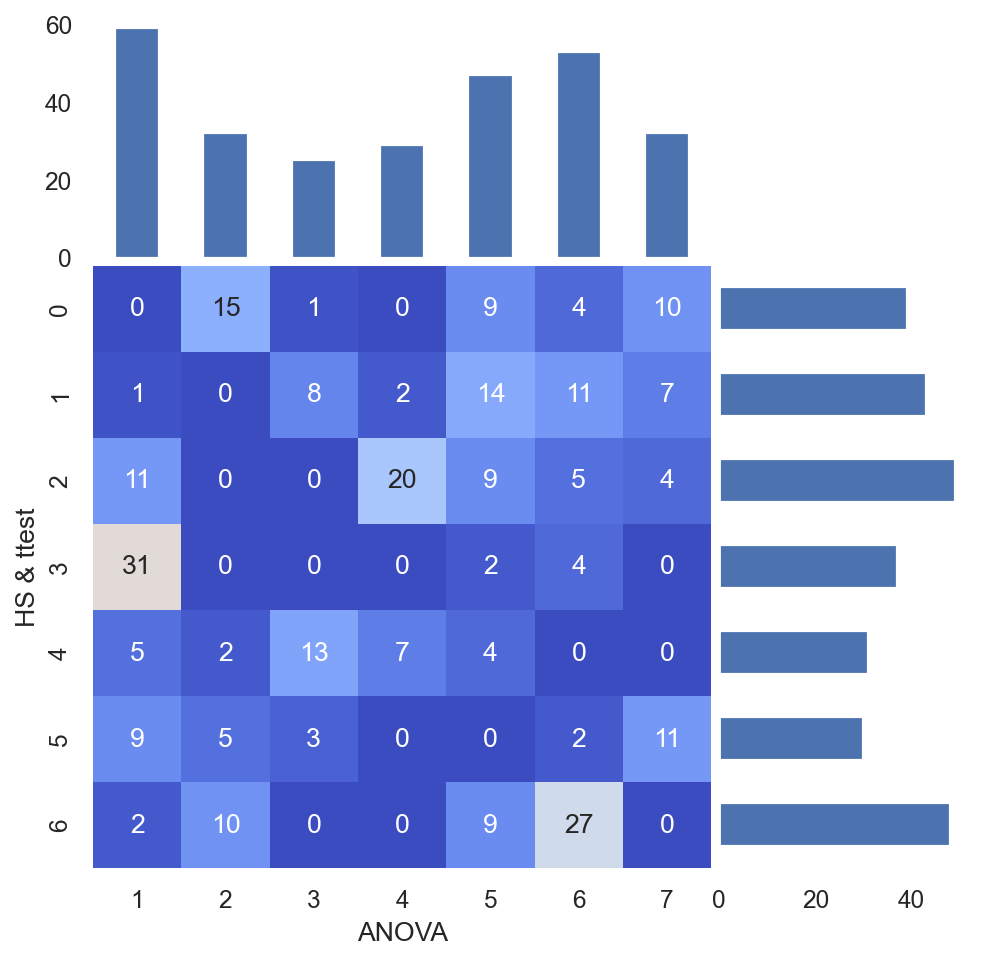

In [201]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

In [202]:
hs_dummies = hs_labels.astype(str).str.get_dummies()
hs_dummies.columns = 'HS' + hs_dummies.columns
hs_dummies.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6
JAKMIP1,1,0,0,0,0,0,0
HMGCL,1,0,0,0,0,0,0
CACNG3,1,0,0,0,0,0,0
RTN4RL2,1,0,0,0,0,0,0
TOX2,1,0,0,0,0,0,0


In [203]:
hs_ttest_dummies = labels.astype(str).str.get_dummies()
hs_ttest_dummies.columns = 'HS & ttest' + hs_ttest_dummies.columns
hs_ttest_dummies.head()

,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
SYNPR,1,0,0,0,0,0,0
ATP2B2,1,0,0,0,0,0,0
KCNJ4,1,0,0,0,0,0,0
PANX1,1,0,0,0,0,0,0
FHL2,1,0,0,0,0,0,0


In [204]:
dummie_concat = pd.concat([hs_dummies, hs_ttest_dummies], axis=1).fillna(0)
dummie_concat.head()

,HS0,HS1,HS2,HS3,HS4,HS5,HS6,HS & ttest0,HS & ttest1,HS & ttest2,HS & ttest3,HS & ttest4,HS & ttest5,HS & ttest6
JAKMIP1,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
HMGCL,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CACNG3,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RTN4RL2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOX2,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


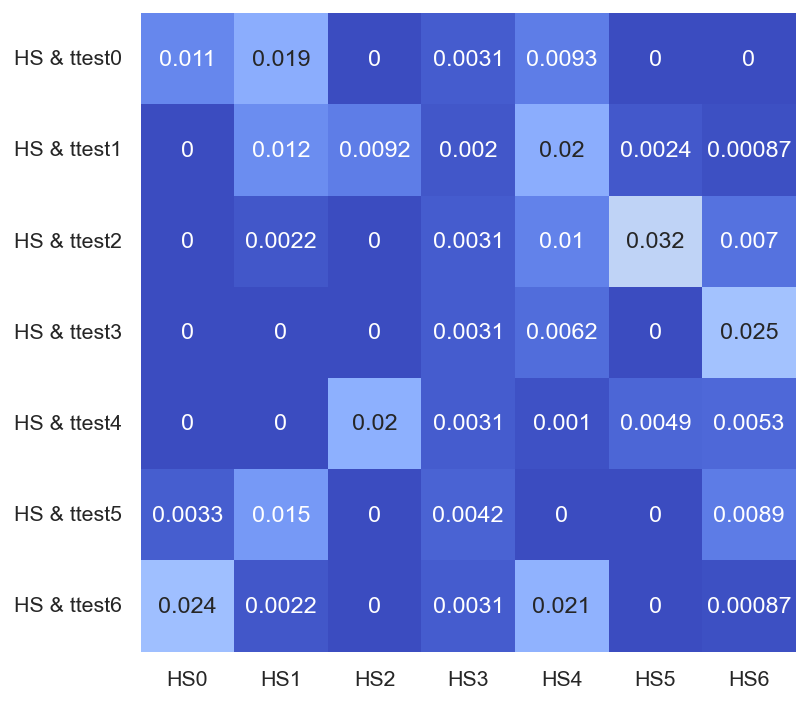

In [205]:
from sklearn.metrics import DistanceMetric
dist = DistanceMetric.get_metric('jaccard')
pairwise_jaccard = pd.DataFrame(1 - dist.pairwise(dummie_concat.T), columns=dummie_concat.columns, index=dummie_concat.columns)
pairwise_jaccard

plt.figure(figsize=(6, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pairwise_jaccard.loc[hs_ttest_dummies.columns, hs_dummies.columns], annot=True, cmap = 'coolwarm', center=0.04, cbar=False)
plt.grid(False)

In [206]:
gene_inter = labels.index.intersection(hs_labels.index)
table_to_pivot = pd.concat([hs_labels.loc[gene_inter], labels.loc[gene_inter]], axis=1)
table_to_pivot.columns = ['HS', 'HS & ttest']
pivot_labels_inter = table_to_pivot.groupby('HS').value_counts().unstack().fillna(0)
pivot_labels_inter

HS & ttest,0,1,2,3,4,5,6
HS,,,,,,,
0,10.0,0.0,0.0,0.0,0.0,3.0,22.0
1,17.0,11.0,2.0,0.0,0.0,13.0,2.0
2,0.0,8.0,0.0,0.0,17.0,0.0,0.0
3,3.0,2.0,3.0,3.0,3.0,4.0,3.0
4,9.0,19.0,10.0,6.0,1.0,0.0,20.0
5,0.0,2.0,26.0,0.0,4.0,0.0,0.0
6,0.0,1.0,8.0,28.0,6.0,10.0,1.0


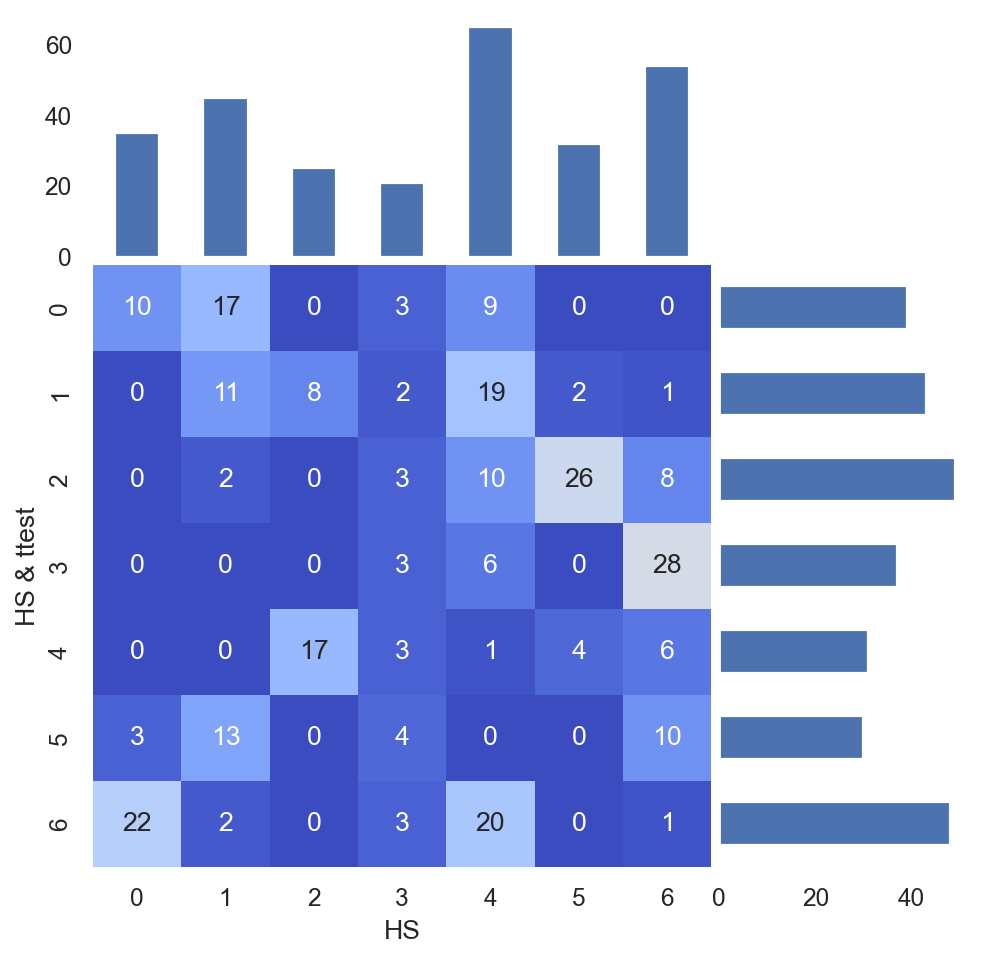

In [207]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(pivot_labels_inter.T, annot=True, cmap = 'coolwarm', center=30, fmt=".0f", ax=ax, cbar=False)

divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=1).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.columns[::-1]
pivot_labels_inter.sum(axis=0).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)